In [1]:
import os
import time
import itertools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import itertools
import umap
import gc
import uuid

from functools import partial

from sklearn import manifold
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler

import warnings
warnings.filterwarnings("ignore")

%matplotlib inline

In [2]:
def get_model(model_name: str, **kwargs):
    LLE = partial(manifold.LocallyLinearEmbedding)
    model_name = model_name.lower()
    if model_name == 'pca':
        return PCA(**kwargs)
    elif model_name == "lle":
        return LLE(method='standard', **kwargs)
    elif model_name =="ltsa":
        return LLE(method='ltsa', **kwargs) 
    elif model_name == "hlle":
        return LLE(method='hessian', **kwargs)
    elif model_name == "mlle":
        return LLE(method='modified', **kwargs)
    elif model_name== "isomap":
        return manifold.Isomap(**kwargs)
    elif model_name == "mds":
        return manifold.MDS(**kwargs)
    elif model_name == "se":
        return manifold.SpectralEmbedding(**kwargs)
    elif model_name == "t-sne":
        return manifold.TSNE(**kwargs)
    elif model_name == "umap":
        return umap.UMAP(**kwargs)
    raise ValueError(f"Invalid method {model_name}")

In [3]:
dataset_path = "data/datasets/KuHar/3.Time_domain_subsamples/KU-HAR_time_domain_subsamples_20750x300.csv"
activity_names = {
    0: "Stand",
    1: "Sit",
    2: "Talk-sit",
    3: "Talk-stand",
    4: "Stand-sit",
    5: "Lay",
    6: "Lay-stand",
    7: "Pick",
    8: "Jump",
    9: "Push-up",
    10: "Sit-up",
    11: "Walk",
    12: "Walk-backwards",
    13: "Walk-circle",
    14: "Run",
    15: "Stair-up",
    16: "Stair-down",
    17: "Table-tennis"
}

features = [f"{sensor}-{i}" for sensor in ["accel-x", "accel-y", "accel-z", "gyro-x", "gyro-y", "gyro-z"] for i in range(300)] + ["class", "length", "serial"]
accel_x_labels, accel_y_labels, accel_z_labels = features[0:300], features[300:600], features[600:900]
gyro_x_labels, gyro_y_labels, gyro_z_labels = features[900:1200], features[1200:1500], features[1500:1800]
sensor_features = accel_x_labels + accel_y_labels + accel_z_labels + gyro_x_labels + gyro_y_labels + gyro_z_labels

In [23]:
def perform_fit_transform(model, X, y, scaler=None):
    if scaler:
        X = scaler.fit_transform(X)
    print(f"X.shape={X.shape}, y.shape={y.shape}")

    start = time.time()
    X = model.fit_transform(X)
    print(f"Model took {time.time()-start:.3f} seconds")
    X = pd.DataFrame(X, columns=["X", "Y"])
    X["class"] = y
    return X

def plot_graph(X, xlabel="X", ylabel="Y", title=None, mark_color=None, open_markers: bool = False, output_file: str = None):
    # Plot it
    fig = plt.figure(figsize=(24,24))
    ax = fig.add_subplot(1,1,1)
    ax.set_xlabel(xlabel, fontsize=18)
    ax.set_ylabel(ylabel, fontsize=18)
    
    if title is not None:
        ax.set_title(title, fontsize=18)

    for i, (c, df) in enumerate(sorted(X.groupby(["class"]), key=lambda x: x[0])):
        if mark_color:
            ax.scatter(df["X"], df["Y"], marker=mark_color[i][0], edgecolors=mark_color[i][1], facecolors=mark_color[i][1] if not open_markers else "none", label=c)
        else:
            if open_markers:
                ax.scatter(df["X"], df["Y"], facecolors="none", label=c)
            else:
                ax.scatter(df["X"], df["Y"], label=c)

    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)
    ax.legend(prop={'size': 18})
    ax.grid()
    
    if output_file is not None:
        plt.savefig(output_file, bbox_inches='tight', transparent=True, pad_inches=0)
        print(f"Figure saved to {output_file}")
    
    plt.show()   
    
def apply_fft_to_data(df, features):
    start = time.time()
    rows = []
    for row_idx, row in df.iterrows():
        fft_row = []
        for feat_l in features:
            fft_row += np.abs(np.fft.fft(row[feat_l].to_numpy())).tolist()
        rows.append(fft_row)
    print(f"FFT took {time.time()-start:.3f} seconds")
    
    features_list = [f for flist in features for f in flist]
    
    return pd.DataFrame(rows, columns=features_list)

# Create dataset

## Original Dataset

* Original 
* FFT over all features (per row)
* FFT over each sensor (per row)

In [5]:
original_df = pd.read_csv(dataset_path, names=features)
original_df["class name"] = original_df.apply(lambda row: activity_names[row["class"]], axis=1)
original_df

,accel-x-0,accel-x-1,accel-x-2,accel-x-3,accel-x-4,accel-x-5,accel-x-6,accel-x-7,accel-x-8,accel-x-9,...,gyro-z-294,gyro-z-295,gyro-z-296,gyro-z-297,gyro-z-298,gyro-z-299,class,length,serial,class name
0,0.004230,-0.000280,-0.013906,-0.002544,0.027433,0.058300,0.051670,0.071857,0.080653,0.047917,...,-0.018566,-0.017361,-0.017919,-0.016680,-0.016650,-0.013097,0,300,1,Stand
1,0.012482,0.032496,0.067856,0.071552,0.078103,0.040353,-0.001060,-0.018580,-0.026813,-0.011280,...,-0.010408,-0.011459,-0.011747,-0.010394,-0.008070,-0.004354,0,300,2,Stand
2,0.012127,0.028458,0.062075,0.052611,0.022942,-0.010017,-0.023151,-0.028515,0.005036,0.008450,...,0.000771,-0.002559,-0.003020,-0.004190,0.000215,0.000850,0,300,3,Stand
3,0.052964,0.074319,0.110670,0.108490,0.091825,0.056989,0.029337,-0.016724,-0.042265,-0.053983,...,0.002878,0.000663,0.000982,-0.002148,-0.009200,-0.010653,0,300,4,Stand
4,-0.020462,-0.030787,-0.008617,0.008906,0.045046,0.042136,0.045037,0.045182,0.025113,0.021730,...,-0.006614,-0.004698,-0.007279,-0.006861,-0.006161,-0.006113,0,300,5,Stand
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20745,1.871600,1.648800,1.608900,1.802300,1.475000,1.390700,1.137800,1.289600,0.963750,1.022200,...,-0.432590,-0.414760,-0.363110,-0.329190,-0.460960,-0.621920,9,300,20746,Push-up
20746,1.889400,2.022700,0.817300,-0.505840,2.462200,3.814200,2.661000,2.651200,1.991400,4.427300,...,-0.288930,-0.320880,-0.379540,-0.408210,-0.507970,-0.548040,9,300,20747,Push-up
20747,1.269500,1.312200,0.725570,0.531290,0.958420,-0.049679,1.223100,1.837000,0.989740,1.882600,...,1.125400,0.639470,0.277320,0.172710,-0.002894,0.023955,9,300,20748,Push-up
20748,-5.562200,-2.797000,-2.353300,-3.075600,-4.136100,-4.028800,-0.580260,0.346070,-2.631700,-2.790000,...,-0.209020,-0.128670,-0.104730,-0.131960,-0.150780,-0.187320,9,300,20749,Push-up


In [6]:
full_fft_original_df = apply_fft_to_data(original_df, [sensor_features])
full_fft_original_df[["class", "length", "serial", "class name"]] = original_df[["class", "length", "serial", "class name"]].values
full_fft_original_df

FFT took 30.364 seconds


,accel-x-0,accel-x-1,accel-x-2,accel-x-3,accel-x-4,accel-x-5,accel-x-6,accel-x-7,accel-x-8,accel-x-9,...,gyro-z-294,gyro-z-295,gyro-z-296,gyro-z-297,gyro-z-298,gyro-z-299,class,length,serial,class name
0,2.651933,10.939837,2.706514,13.281396,2.373935,1.280948,5.197958,3.835044,3.719263,3.594119,...,5.197958,1.280948,2.373935,13.281396,2.706514,10.939837,0,300,1,Stand
1,4.720029,8.509425,5.690611,12.761530,3.934368,0.640667,1.059304,1.751361,1.522940,3.798451,...,1.059304,0.640667,3.934368,12.761530,5.690611,8.509425,0,300,2,Stand
2,4.584946,7.425626,5.770170,14.280483,3.677926,2.110581,0.825581,2.567146,3.395536,6.403733,...,0.825581,2.110581,3.677926,14.280483,5.770170,7.425626,0,300,3,Stand
3,2.405901,9.669209,5.412988,13.491154,1.452545,2.278650,0.998547,1.729796,1.338450,4.321136,...,0.998547,2.278650,1.452545,13.491154,5.412988,9.669209,0,300,4,Stand
4,3.929161,8.532279,5.674425,15.261860,2.344855,3.660566,2.065938,3.962049,2.642771,4.173036,...,2.065938,3.660566,2.344855,15.261860,5.674425,8.532279,0,300,5,Stand
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20745,606.027927,615.489315,389.924030,107.790703,310.391662,284.623632,65.544458,211.715657,269.645229,223.186840,...,65.544458,284.623632,310.391662,107.790703,389.924030,615.489315,9,300,20746,Push-up
20746,613.757513,620.152162,464.732538,89.268799,163.076412,96.412119,90.648183,276.015920,376.861108,212.960773,...,90.648183,96.412119,163.076412,89.268799,464.732538,620.152162,9,300,20747,Push-up
20747,451.942925,428.081624,403.767168,53.571118,156.279859,146.581409,71.564134,321.483846,433.985941,228.076067,...,71.564134,146.581409,156.279859,53.571118,403.767168,428.081624,9,300,20748,Push-up
20748,304.132903,327.012677,213.856226,32.271134,226.783072,254.469898,122.594428,312.878861,262.228791,220.019967,...,122.594428,254.469898,226.783072,32.271134,213.856226,327.012677,9,300,20749,Push-up


In [7]:
per_sensor_fft_original_df = apply_fft_to_data(original_df, [accel_x_labels, accel_y_labels, accel_z_labels, gyro_x_labels, gyro_y_labels, gyro_z_labels])
per_sensor_fft_original_df[["class", "length", "serial", "class name"]] = original_df[["class", "length", "serial", "class name"]].values
per_sensor_fft_original_df 

FFT took 69.983 seconds


,accel-x-0,accel-x-1,accel-x-2,accel-x-3,accel-x-4,accel-x-5,accel-x-6,accel-x-7,accel-x-8,accel-x-9,...,gyro-z-294,gyro-z-295,gyro-z-296,gyro-z-297,gyro-z-298,gyro-z-299,class,length,serial,class name
0,6.058580,0.273496,1.179259,0.535533,1.140474,0.152083,0.840698,0.576329,0.239720,0.691060,...,0.188430,0.177158,0.444133,0.417925,0.654713,0.482188,0,300,1,Stand
1,5.293144,0.260169,0.593212,0.168227,0.153629,0.428229,0.103643,0.388941,0.377599,0.202469,...,0.093762,0.053484,0.032473,0.298644,0.215010,0.200065,0,300,2,Stand
2,4.832682,0.666655,0.477724,0.603664,0.446667,0.289116,0.200557,0.903229,0.405768,0.524012,...,0.106655,0.069221,0.117349,0.467452,0.301199,0.164491,0,300,3,Stand
3,6.589204,0.592314,0.568700,1.085516,0.553400,0.420281,0.429776,0.392644,0.697227,0.663075,...,0.175759,0.182317,0.105177,0.254456,0.474780,0.280463,0,300,4,Stand
4,5.546648,0.781495,0.851947,0.142692,0.232562,0.498809,0.387429,0.076312,0.554076,0.488413,...,0.102709,0.165226,0.369874,0.028092,0.510515,0.265811,0,300,5,Stand
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20745,427.181178,24.633363,535.251581,70.872094,179.292532,17.517674,93.171141,23.362791,76.101756,25.730166,...,41.416813,11.827208,52.203273,24.009592,139.582684,2.452477,9,300,20746,Push-up
20746,382.285488,50.327474,431.518163,60.266042,162.526259,90.247958,57.330080,26.500969,69.702155,23.349391,...,31.235019,24.340420,45.122899,26.684654,123.885665,8.815925,9,300,20747,Push-up
20747,330.335958,73.298219,426.864329,130.130474,197.884956,139.206115,54.428743,123.168875,17.053680,26.287369,...,12.255181,39.088506,54.736463,29.041165,104.504273,21.956834,9,300,20748,Push-up
20748,197.065930,189.012951,240.579262,57.433230,143.196542,6.100928,56.422242,75.062880,18.332837,25.404239,...,30.543039,6.846204,38.412628,21.725465,61.863093,49.995086,9,300,20749,Push-up


## Balanced Dataset

* Balanced 
* FFT over all features (per row)
* FFT over each sensor (per row)

In [8]:
train_fname = os.path.join("data", "embbedings", "Ku-Har", "train_val_test_300samples", "raw", "1638731242", "train.csv")
val_fname = os.path.join("data", "embbedings", "Ku-Har", "train_val_test_300samples", "raw", "1638731242", "train.csv")
test_fname = os.path.join("data", "embbedings", "Ku-Har", "train_val_test_300samples", "raw", "1638731242", "train.csv")
train, val, test = pd.read_csv(train_fname), pd.read_csv(val_fname), pd.read_csv(test_fname)

# Concat all
balanced_df = pd.concat([train, val, test])
balanced_df["class name"] = balanced_df.apply(lambda row: activity_names[row["class"]], axis=1)
balanced_df

,accel-x-0,accel-x-1,accel-x-2,accel-x-3,accel-x-4,accel-x-5,accel-x-6,accel-x-7,accel-x-8,accel-x-9,...,accel-start-time,gyro-start-time,accel-end-time,gyro-end-time,class,length,serial,index,user,class name
0,-0.058200,-0.029593,-0.018923,0.003057,0.021901,0.023075,0.013433,-0.012101,-0.007438,-0.031277,...,48.003,48.005,50.993,50.995,0,300,1,4800,1060,Stand
1,0.032707,0.062652,0.060266,0.035136,-0.006758,-0.042667,-0.063012,-0.060610,-0.025887,0.047135,...,10.006,10.005,12.996,12.995,0,300,1,0,1040,Stand
2,-0.025723,-0.000050,0.002690,-0.005733,-0.025487,-0.032737,-0.038942,-0.030343,-0.009173,-0.009040,...,51.009,51.011,53.999,54.001,0,300,6,5100,1014,Stand
3,-0.027010,-0.031045,-0.044404,-0.036361,-0.028448,-0.034861,-0.031902,-0.027610,-0.001927,0.011143,...,15.009,15.007,17.999,17.997,0,300,1,1500,1065,Stand
4,0.000015,0.009981,0.031118,0.015529,-0.008692,-0.000628,-0.000435,-0.018717,-0.004603,0.022903,...,33.006,33.004,35.996,35.994,0,300,6,3300,1071,Stand
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2407,1.100900,1.867900,2.296100,2.978700,3.336400,3.352900,3.173500,2.670900,1.755400,1.084000,...,48.002,48.008,50.992,50.998,17,300,2,4800,1082,Table-tennis
2408,-4.529000,0.016223,6.846200,14.215000,26.545000,30.841000,26.847000,20.829000,16.925000,11.854000,...,60.009,60.006,62.999,62.996,17,300,2,6000,1086,Table-tennis
2409,5.691000,7.164400,6.952400,5.513400,5.094900,4.471000,3.345100,2.261500,1.484600,0.175570,...,36.009,36.007,38.999,38.997,17,300,1,3600,1081,Table-tennis
2410,3.990600,5.433600,6.104700,6.387300,6.421900,5.906600,5.307300,4.032500,1.854600,-0.341950,...,3.004,3.007,5.994,5.997,17,300,1,300,1087,Table-tennis


In [9]:
full_fft_balanced_df = apply_fft_to_data(balanced_df, [sensor_features])
full_fft_balanced_df[["class", "length", "serial", "class name"]] = balanced_df[["class", "length", "serial", "class name"]].values
full_fft_balanced_df

FFT took 10.552 seconds


,accel-x-0,accel-x-1,accel-x-2,accel-x-3,accel-x-4,accel-x-5,accel-x-6,accel-x-7,accel-x-8,accel-x-9,...,gyro-z-294,gyro-z-295,gyro-z-296,gyro-z-297,gyro-z-298,gyro-z-299,class,length,serial,class name
0,5.050113,16.333164,16.438781,11.018324,7.263015,1.663172,0.695203,3.424916,3.992447,2.125406,...,0.695203,1.663172,7.263015,11.018324,16.438781,16.333164,0,300,1,Stand
1,1.048987,7.817550,11.679296,1.931510,6.281290,2.947589,1.776378,3.887139,2.021813,5.252648,...,1.776378,2.947589,6.281290,1.931510,11.679296,7.817550,0,300,1,Stand
2,9.336468,20.179437,16.670769,7.242858,11.306671,5.791294,1.421371,2.720599,3.074786,5.419578,...,1.421371,5.791294,11.306671,7.242858,16.670769,20.179437,0,300,6,Stand
3,1.592243,5.547046,4.006598,1.383969,5.889987,1.893817,2.743732,3.061271,1.381412,3.598409,...,2.743732,1.893817,5.889987,1.383969,4.006598,5.547046,0,300,1,Stand
4,2.787708,5.150220,2.556196,3.576918,5.633866,4.250302,6.149124,1.788644,3.389039,2.255020,...,6.149124,4.250302,5.633866,3.576918,2.556196,5.150220,0,300,6,Stand
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7231,205.104069,97.185624,134.483943,67.669683,66.312922,41.963239,234.218649,445.161263,406.481490,241.266502,...,234.218649,41.963239,66.312922,67.669683,134.483943,97.185624,17,300,2,Table-tennis
7232,51.941291,138.471621,227.067822,275.318120,105.897336,322.354949,144.233691,217.767727,232.023383,145.434909,...,144.233691,322.354949,105.897336,275.318120,227.067822,138.471621,17,300,2,Table-tennis
7233,327.302144,248.379111,291.600778,301.270630,115.639665,150.836370,335.417385,456.073329,361.627756,143.524450,...,335.417385,150.836370,115.639665,301.270630,291.600778,248.379111,17,300,1,Table-tennis
7234,46.823198,99.576539,60.564404,329.473040,417.661303,285.399904,426.992504,209.151065,30.432499,453.112775,...,426.992504,285.399904,417.661303,329.473040,60.564404,99.576539,17,300,1,Table-tennis


In [10]:
per_sensor_fft_balanced_df = apply_fft_to_data(balanced_df, [accel_x_labels, accel_y_labels, accel_z_labels, gyro_x_labels, gyro_y_labels, gyro_z_labels])
per_sensor_fft_balanced_df[["class", "length", "serial", "class name"]] = balanced_df[["class", "length", "serial", "class name"]].values
per_sensor_fft_balanced_df 

FFT took 24.785 seconds


,accel-x-0,accel-x-1,accel-x-2,accel-x-3,accel-x-4,accel-x-5,accel-x-6,accel-x-7,accel-x-8,accel-x-9,...,gyro-z-294,gyro-z-295,gyro-z-296,gyro-z-297,gyro-z-298,gyro-z-299,class,length,serial,class name
0,3.620209,0.442929,0.181812,0.095873,0.089382,0.158607,0.157784,0.444532,0.262685,0.408322,...,0.173618,0.116158,0.040781,0.157283,0.050872,0.172252,0,300,1,Stand
1,5.980150,0.654837,0.793391,0.532894,0.708706,0.678087,1.060815,0.790362,1.237859,0.261448,...,0.321767,0.426639,0.817504,0.193788,0.229182,0.348050,0,300,1,Stand
2,4.440415,0.865219,0.682767,0.107097,0.326117,0.278776,0.605326,1.310552,0.668067,1.368316,...,0.091486,0.045396,0.037913,0.195812,0.279768,0.807059,0,300,6,Stand
3,1.321592,0.211926,0.711659,0.739015,0.542606,0.770495,0.328934,0.623049,0.648872,0.598013,...,0.332840,0.414287,0.519651,0.658839,0.388874,0.276851,0,300,1,Stand
4,0.368244,0.472827,0.490609,0.478347,0.402333,1.194424,0.826655,0.561558,0.677982,1.032877,...,0.245229,0.131031,0.024102,0.288272,0.412614,0.410766,0,300,6,Stand
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7231,13.892101,66.037035,82.149290,129.987827,66.601731,74.263187,229.017805,240.377243,73.790203,375.762451,...,17.771802,10.379670,26.033781,68.375912,56.732651,77.102826,17,300,2,Table-tennis
7232,103.632668,181.665179,127.785393,203.106826,140.830441,133.409540,324.355643,140.306740,339.195479,311.755549,...,14.069735,21.918128,10.362058,20.200367,74.198792,92.456051,17,300,2,Table-tennis
7233,64.053424,106.850424,51.566489,102.584078,190.596731,31.546944,490.526293,195.609618,619.577068,264.035491,...,22.858558,72.363975,81.997203,114.384488,117.135135,65.883160,17,300,1,Table-tennis
7234,21.689793,157.477719,207.866042,155.887188,505.662743,387.862925,667.640224,473.686194,596.582801,459.512846,...,8.139228,70.976614,15.745332,37.843912,80.214487,59.039680,17,300,1,Table-tennis


# Perform Experiments

In [22]:
colors = ["tab:blue", "tab:orange", "tab:green", "tab:red", "tab:purple", "tab:brown", "tab:olive"]
markers = ["o", "s", "^"]
mark_color = list(itertools.product(markers, colors))

features_cols = sensor_features
target_col = "class name"

datasets = [
    ("kuhar", "Ku-HAR dataset", original_df),
    ("kuhar_fft_full", "Ku-HAR dataset (FFT)", full_fft_original_df),
    ("kuhar_fft_sensor", "Ku-HAR dataset (FFT per row)", per_sensor_fft_original_df),
    ("balanced_kuhar", "Balanced Ku-HAR dataset", balanced_df),
    ("balanced_kuhar_fft_full", "Balanced Ku-HAR dataset (FFT)", full_fft_balanced_df),
    ("balanced_kuhar_fft_sensor", "Balanced Ku-HAR dataset (FFT per row)", per_sensor_fft_balanced_df),    
]

models = [
    ("umap", "UMAP", {"n_components": 2}),
    ("tsne-perp30", "t-SNE", {"n_components": 2, "perplexity": 30.0}),
    ("tsne-perp60", "t-SNE", {"n_components": 2, "perplexity": 60.0})
]

scalers = [
    ("no-scaler", "No Scaler", None),
    ("std-scaler", "Standard Scaler", StandardScaler),
    ("minmax-scaler", "MinMax Scaler", MinMaxScaler)
]

Default output path to 'outputs/manifold/868d6394'...
Starting experiment with 'UMAP' on 'Ku-HAR dataset' with No Scaler. Model parameters: {'n_components': 2}
X.shape=(20750, 1800), y.shape=(20750,)
Model took 11.343 seconds
Figure saved to outputs/manifold/868d6394/kuhar-umap-no-scaler.png


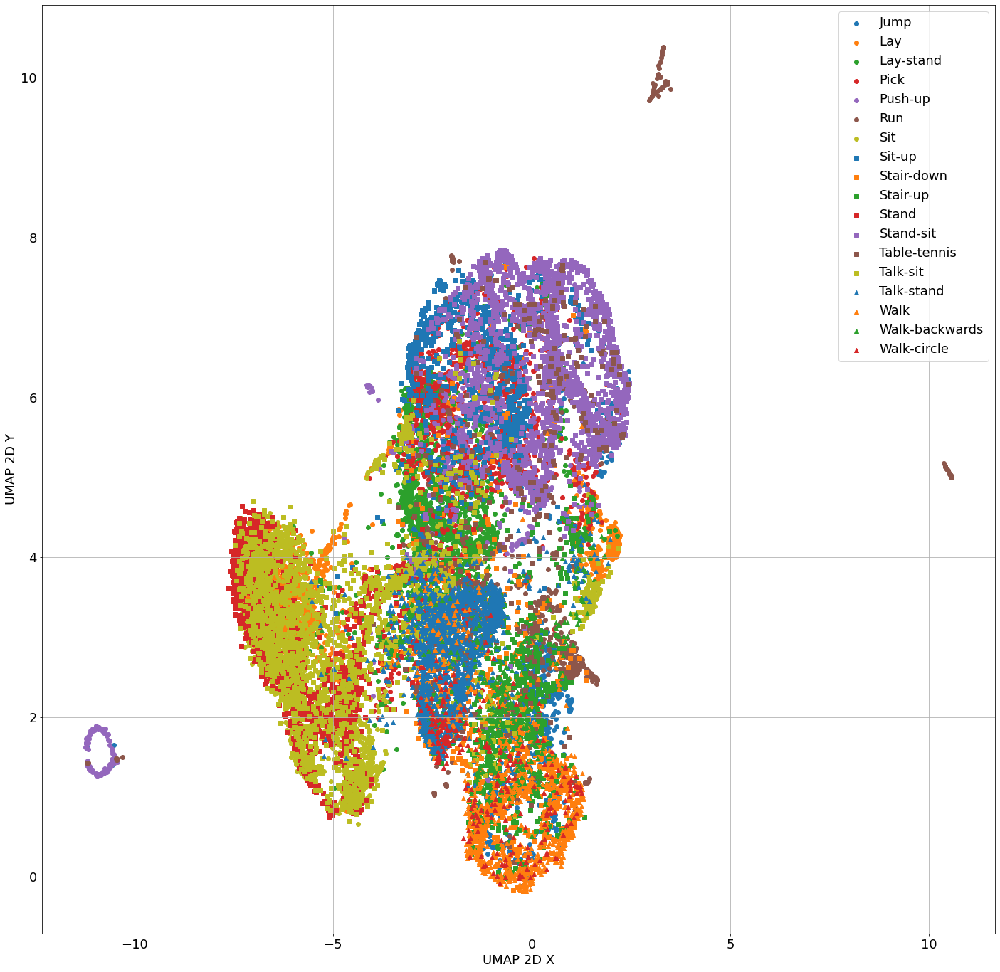

Experiment took 12.539 seconds

Starting experiment with 'UMAP' on 'Ku-HAR dataset' with Standard Scaler. Model parameters: {'n_components': 2}
X.shape=(20750, 1800), y.shape=(20750,)
Model took 11.121 seconds
Figure saved to outputs/manifold/868d6394/kuhar-umap-std-scaler.png


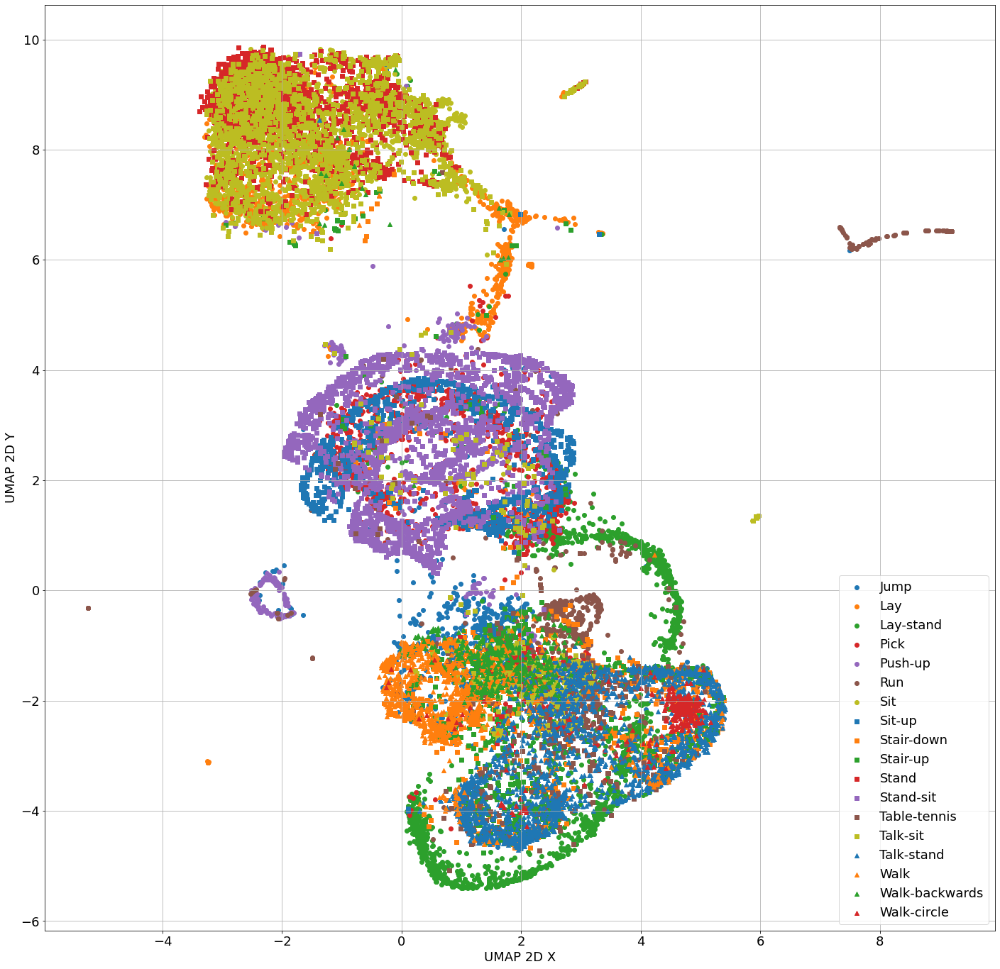

Experiment took 13.130 seconds

Starting experiment with 'UMAP' on 'Ku-HAR dataset' with MinMax Scaler. Model parameters: {'n_components': 2}
X.shape=(20750, 1800), y.shape=(20750,)
Model took 11.098 seconds
Figure saved to outputs/manifold/868d6394/kuhar-umap-minmax-scaler.png


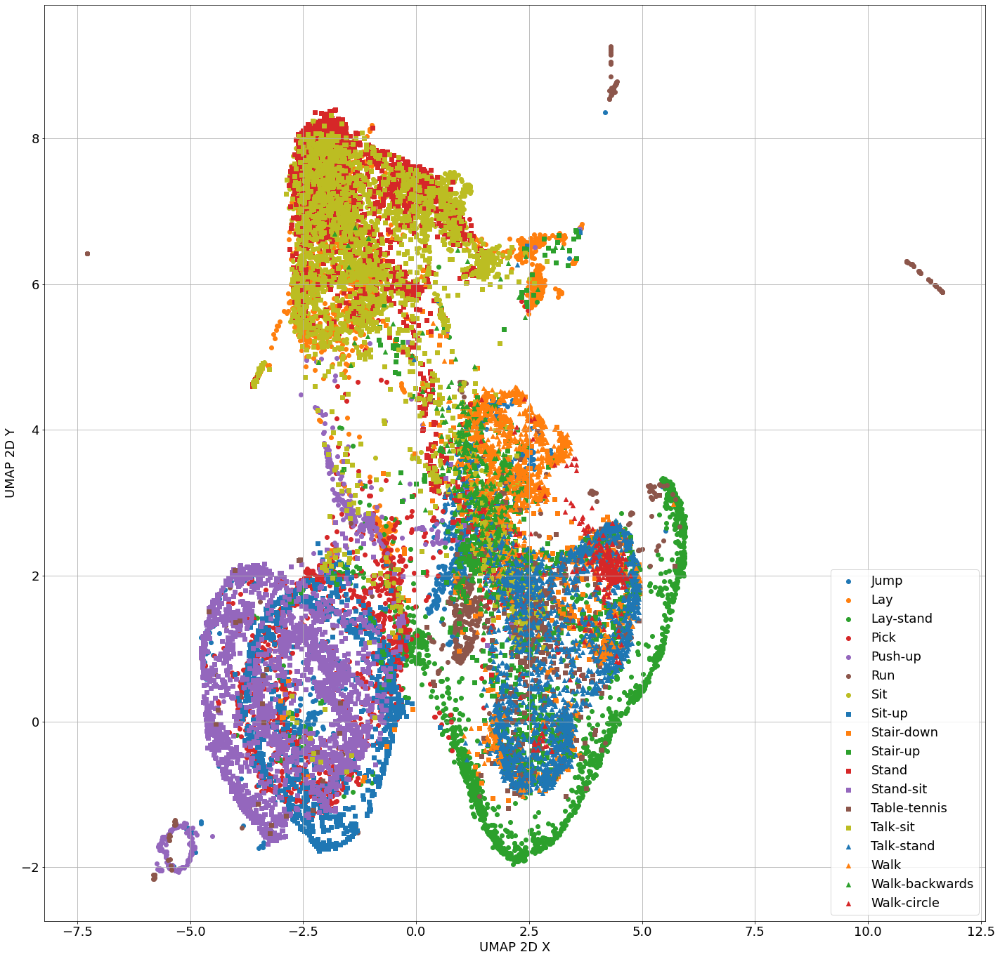

Experiment took 12.825 seconds

Starting experiment with 't-SNE' on 'Ku-HAR dataset' with No Scaler. Model parameters: {'n_components': 2, 'perplexity': 30.0}
X.shape=(20750, 1800), y.shape=(20750,)
Model took 83.421 seconds
Figure saved to outputs/manifold/868d6394/kuhar-tsne-perp30-no-scaler.png


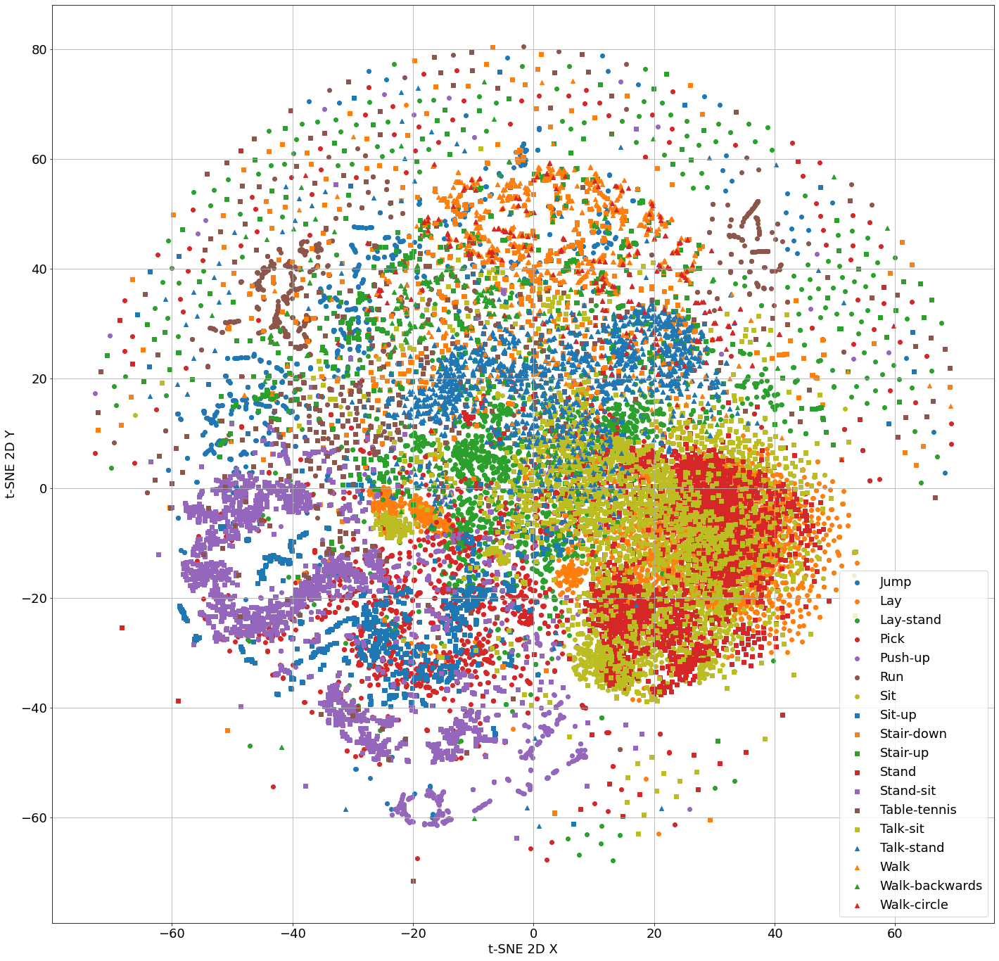

Experiment took 85.432 seconds

Starting experiment with 't-SNE' on 'Ku-HAR dataset' with Standard Scaler. Model parameters: {'n_components': 2, 'perplexity': 30.0}
X.shape=(20750, 1800), y.shape=(20750,)
Model took 73.390 seconds
Figure saved to outputs/manifold/868d6394/kuhar-tsne-perp30-std-scaler.png


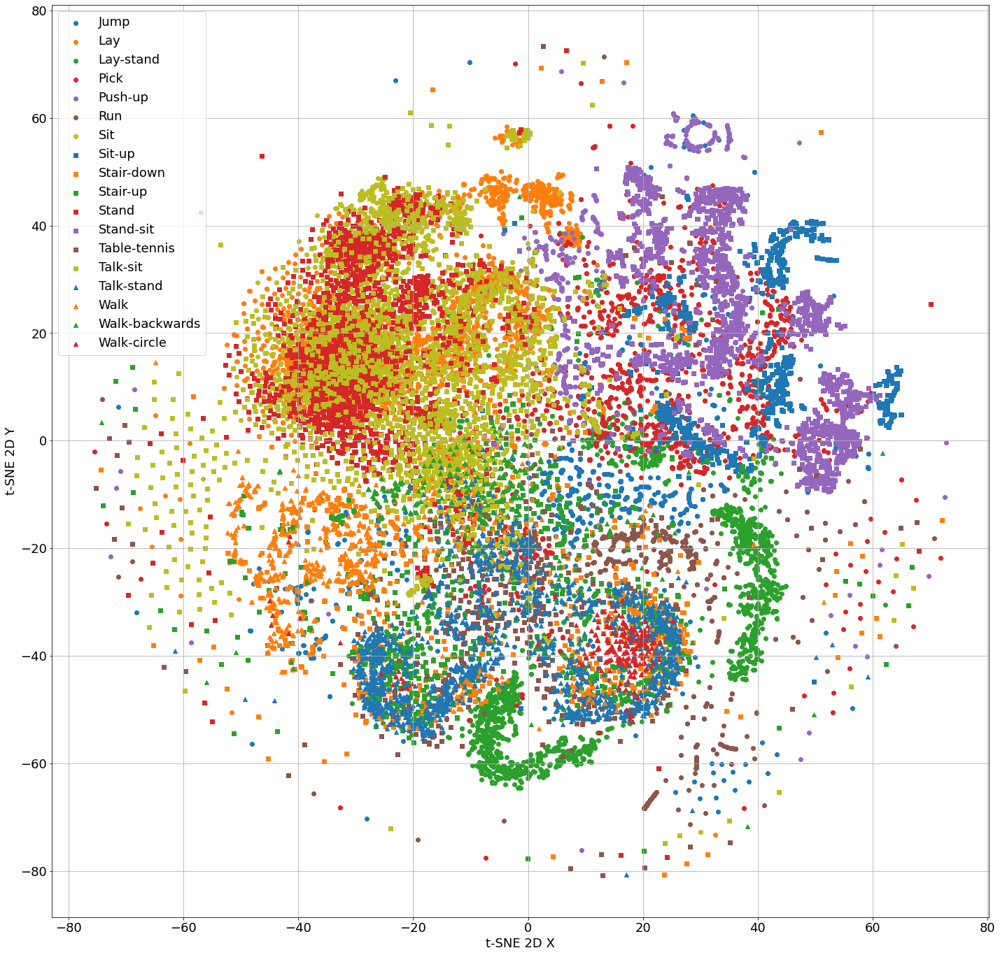

Experiment took 75.946 seconds

Starting experiment with 't-SNE' on 'Ku-HAR dataset' with MinMax Scaler. Model parameters: {'n_components': 2, 'perplexity': 30.0}
X.shape=(20750, 1800), y.shape=(20750,)
Model took 77.321 seconds
Figure saved to outputs/manifold/868d6394/kuhar-tsne-perp30-minmax-scaler.png


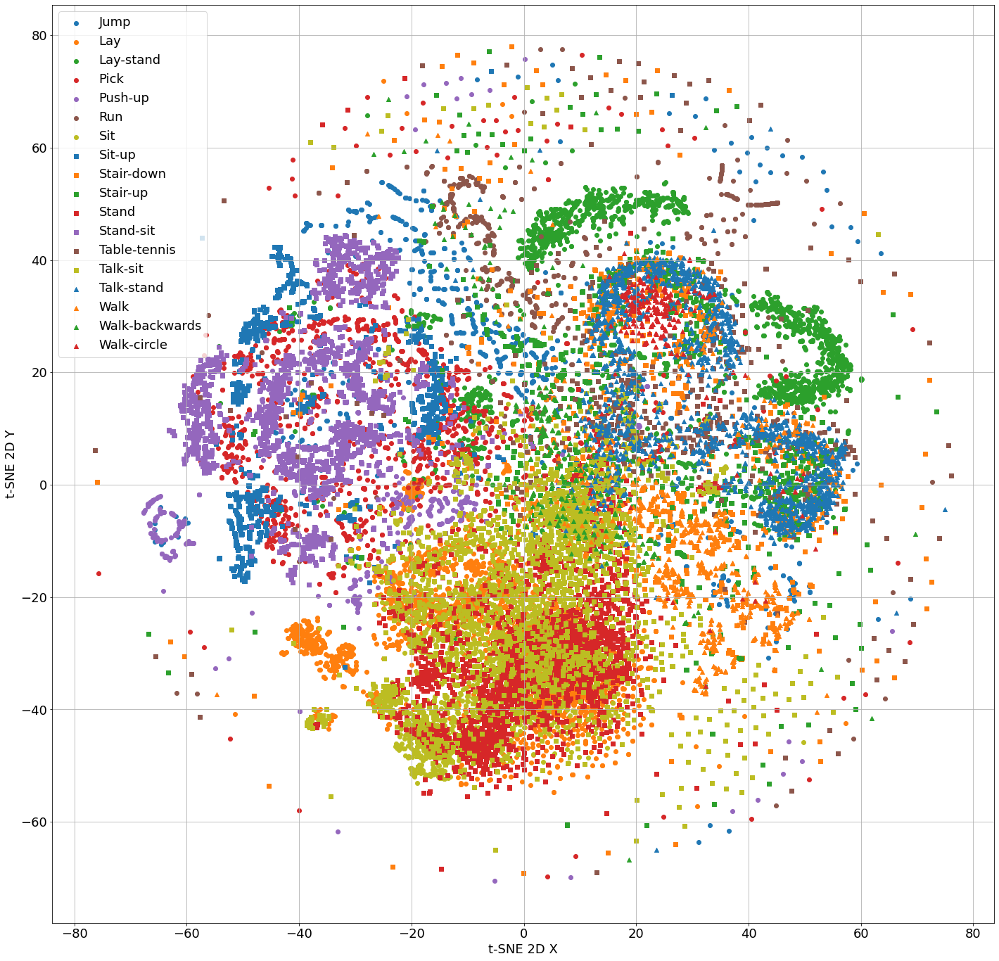

Experiment took 79.493 seconds

Starting experiment with 't-SNE' on 'Ku-HAR dataset' with No Scaler. Model parameters: {'n_components': 2, 'perplexity': 60.0}
X.shape=(20750, 1800), y.shape=(20750,)
Model took 93.403 seconds
Figure saved to outputs/manifold/868d6394/kuhar-tsne-perp60-no-scaler.png


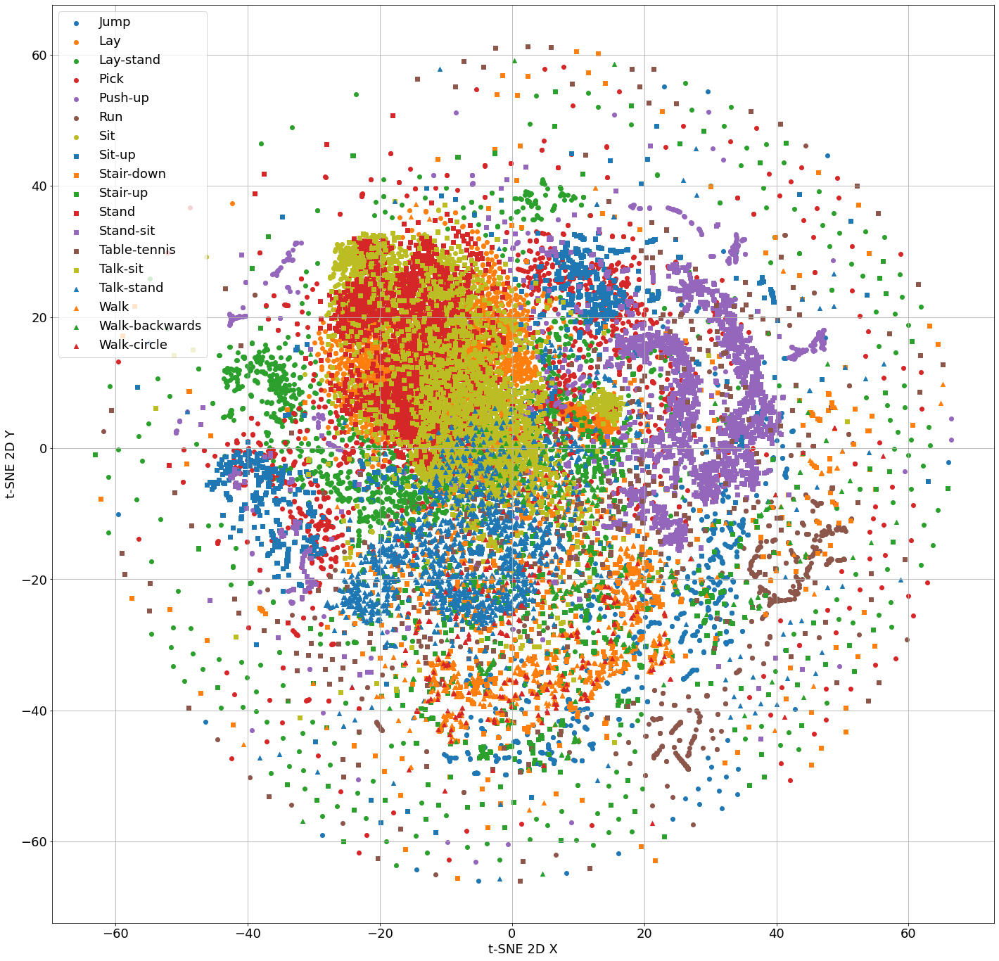

Experiment took 95.332 seconds

Starting experiment with 't-SNE' on 'Ku-HAR dataset' with Standard Scaler. Model parameters: {'n_components': 2, 'perplexity': 60.0}
X.shape=(20750, 1800), y.shape=(20750,)
Model took 86.855 seconds
Figure saved to outputs/manifold/868d6394/kuhar-tsne-perp60-std-scaler.png


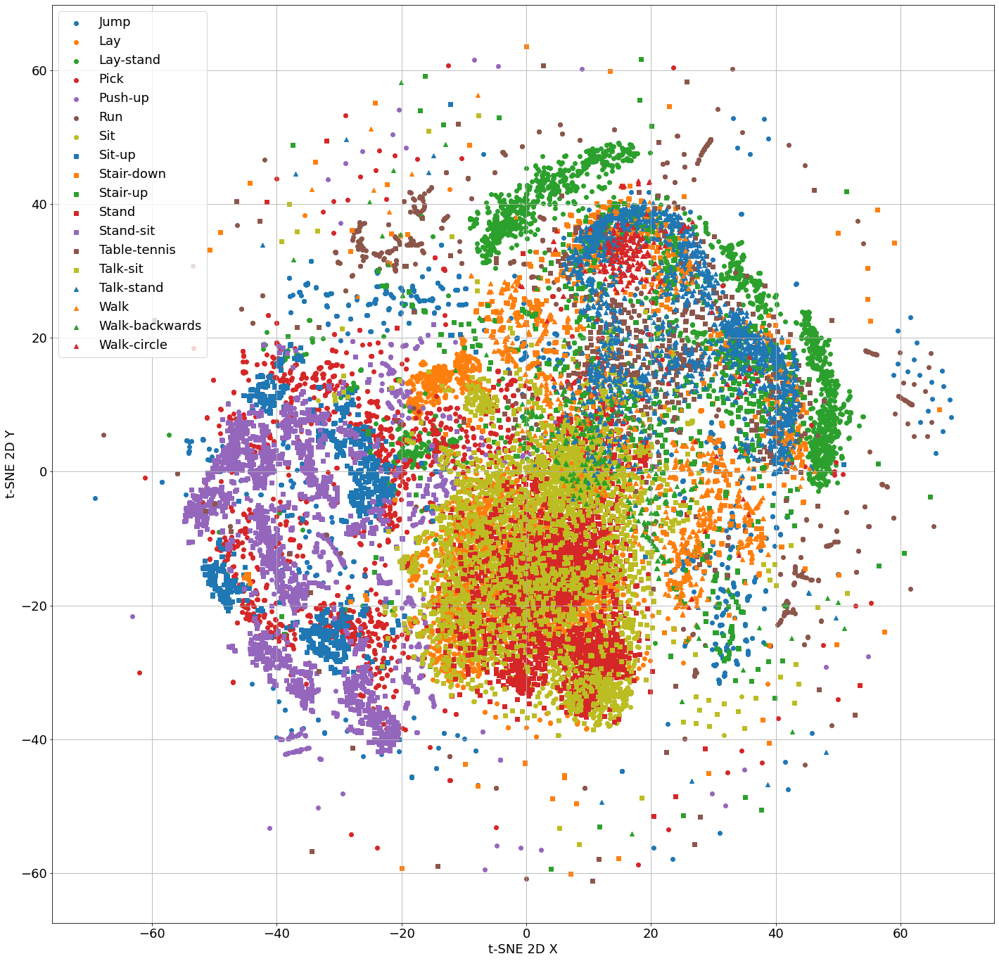

Experiment took 89.242 seconds

Starting experiment with 't-SNE' on 'Ku-HAR dataset' with MinMax Scaler. Model parameters: {'n_components': 2, 'perplexity': 60.0}
X.shape=(20750, 1800), y.shape=(20750,)
Model took 90.344 seconds
Figure saved to outputs/manifold/868d6394/kuhar-tsne-perp60-minmax-scaler.png


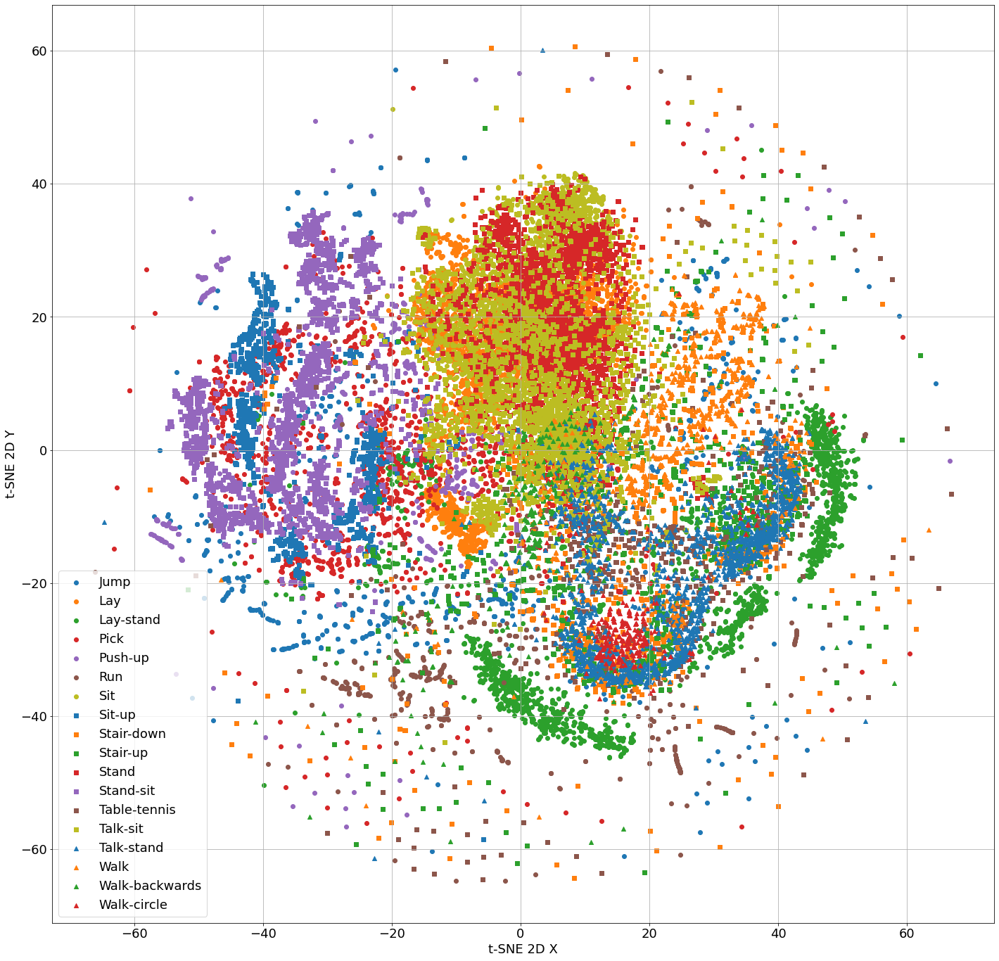

Experiment took 92.463 seconds

Starting experiment with 'UMAP' on 'Ku-HAR dataset (FFT)' with No Scaler. Model parameters: {'n_components': 2}
X.shape=(20750, 1800), y.shape=(20750,)
Model took 10.154 seconds
Figure saved to outputs/manifold/868d6394/kuhar_fft_full-umap-no-scaler.png


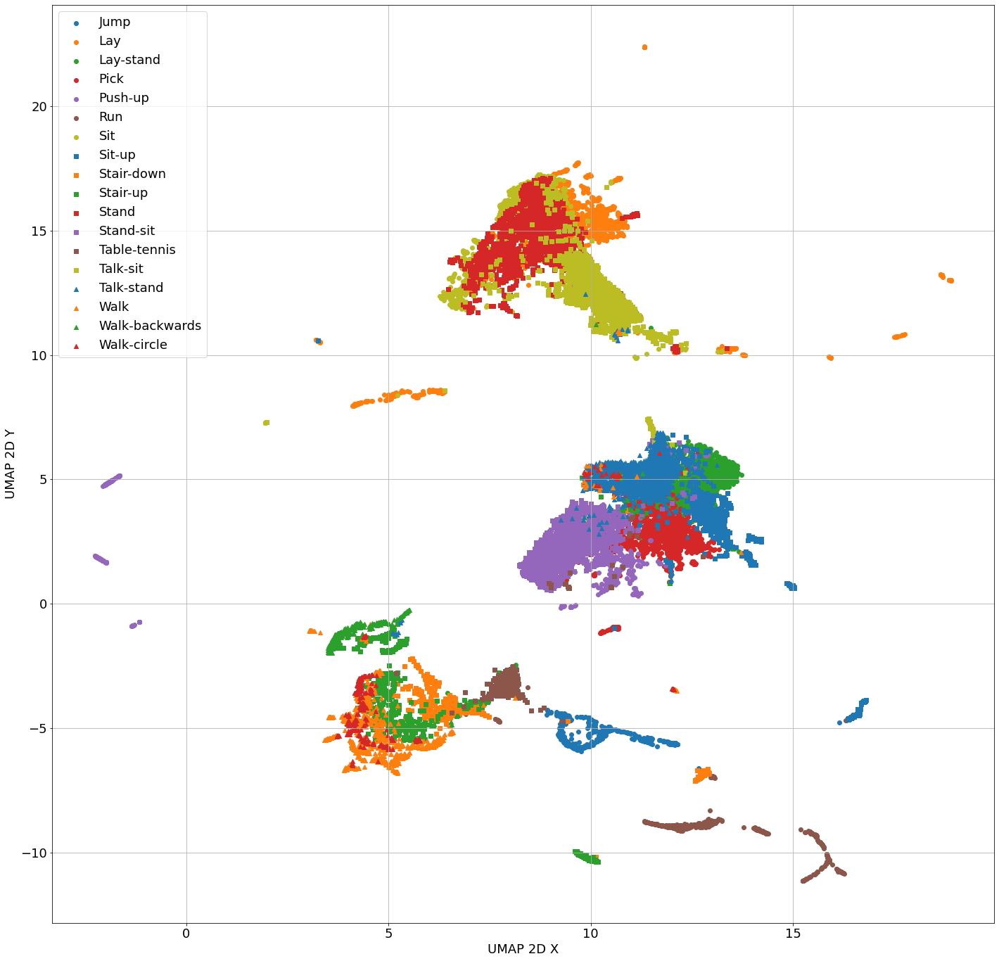

Experiment took 11.365 seconds

Starting experiment with 'UMAP' on 'Ku-HAR dataset (FFT)' with Standard Scaler. Model parameters: {'n_components': 2}
X.shape=(20750, 1800), y.shape=(20750,)
Model took 9.531 seconds
Figure saved to outputs/manifold/868d6394/kuhar_fft_full-umap-std-scaler.png


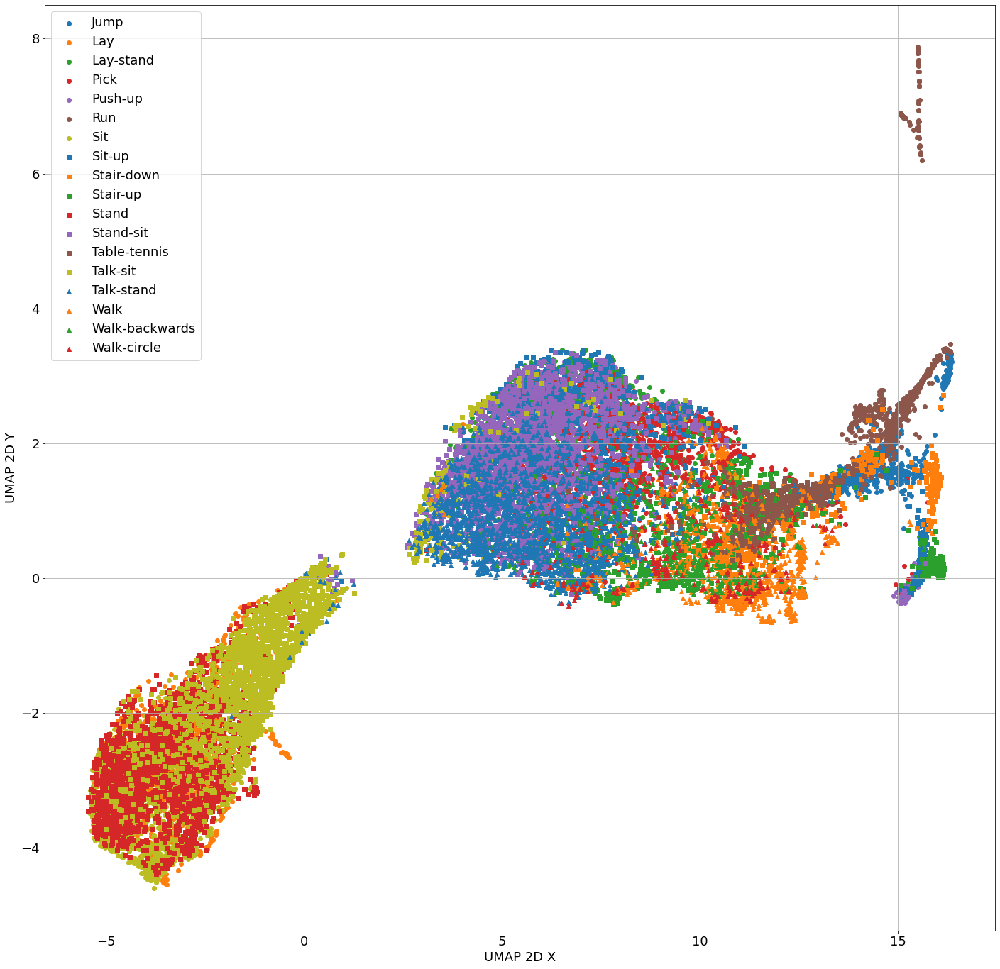

Experiment took 11.240 seconds

Starting experiment with 'UMAP' on 'Ku-HAR dataset (FFT)' with MinMax Scaler. Model parameters: {'n_components': 2}
X.shape=(20750, 1800), y.shape=(20750,)
Model took 10.066 seconds
Figure saved to outputs/manifold/868d6394/kuhar_fft_full-umap-minmax-scaler.png


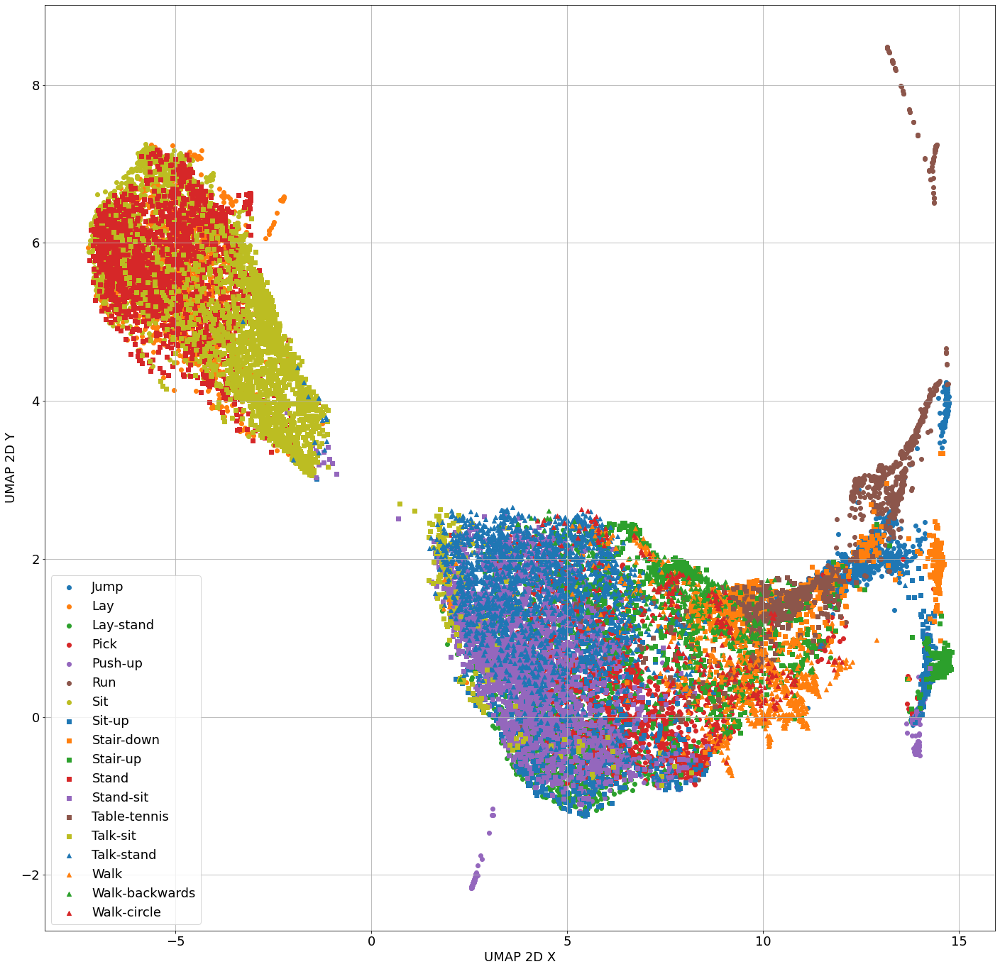

Experiment took 11.578 seconds

Starting experiment with 't-SNE' on 'Ku-HAR dataset (FFT)' with No Scaler. Model parameters: {'n_components': 2, 'perplexity': 30.0}
X.shape=(20750, 1800), y.shape=(20750,)
Model took 58.099 seconds
Figure saved to outputs/manifold/868d6394/kuhar_fft_full-tsne-perp30-no-scaler.png


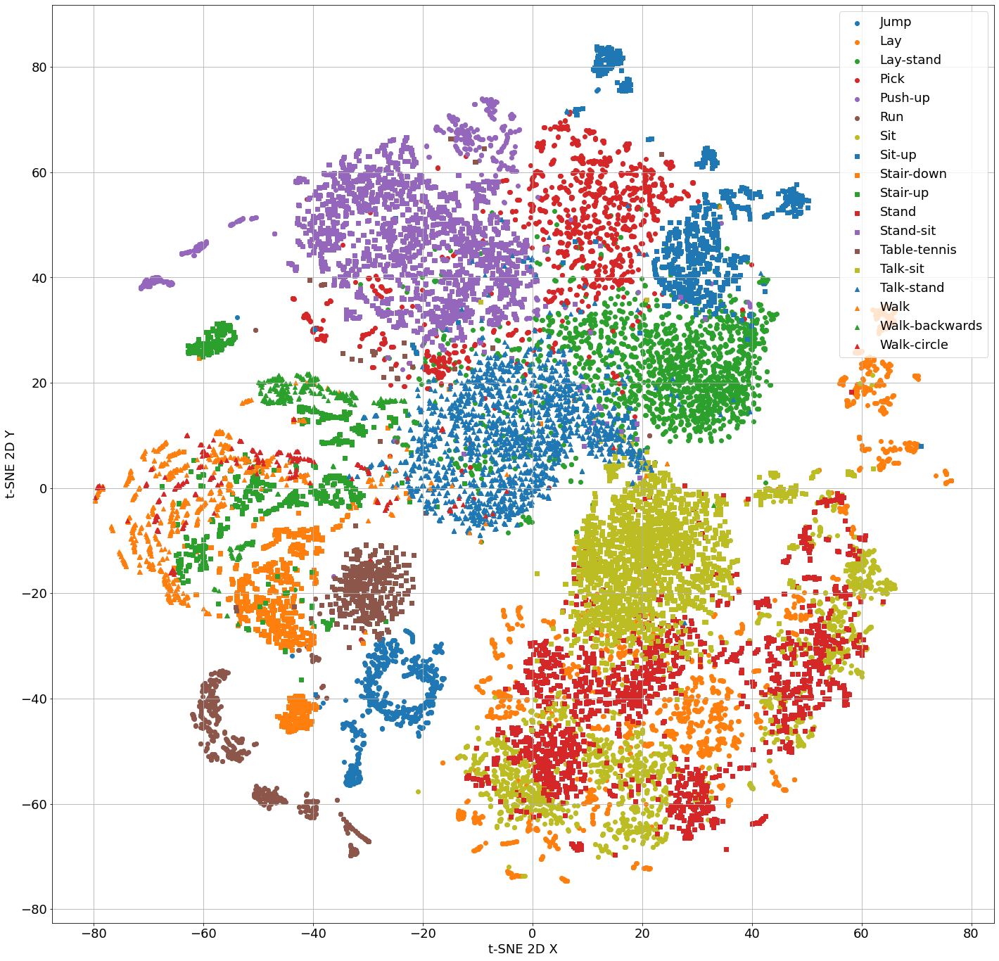

Experiment took 60.056 seconds

Starting experiment with 't-SNE' on 'Ku-HAR dataset (FFT)' with Standard Scaler. Model parameters: {'n_components': 2, 'perplexity': 30.0}
X.shape=(20750, 1800), y.shape=(20750,)
Model took 60.952 seconds
Figure saved to outputs/manifold/868d6394/kuhar_fft_full-tsne-perp30-std-scaler.png


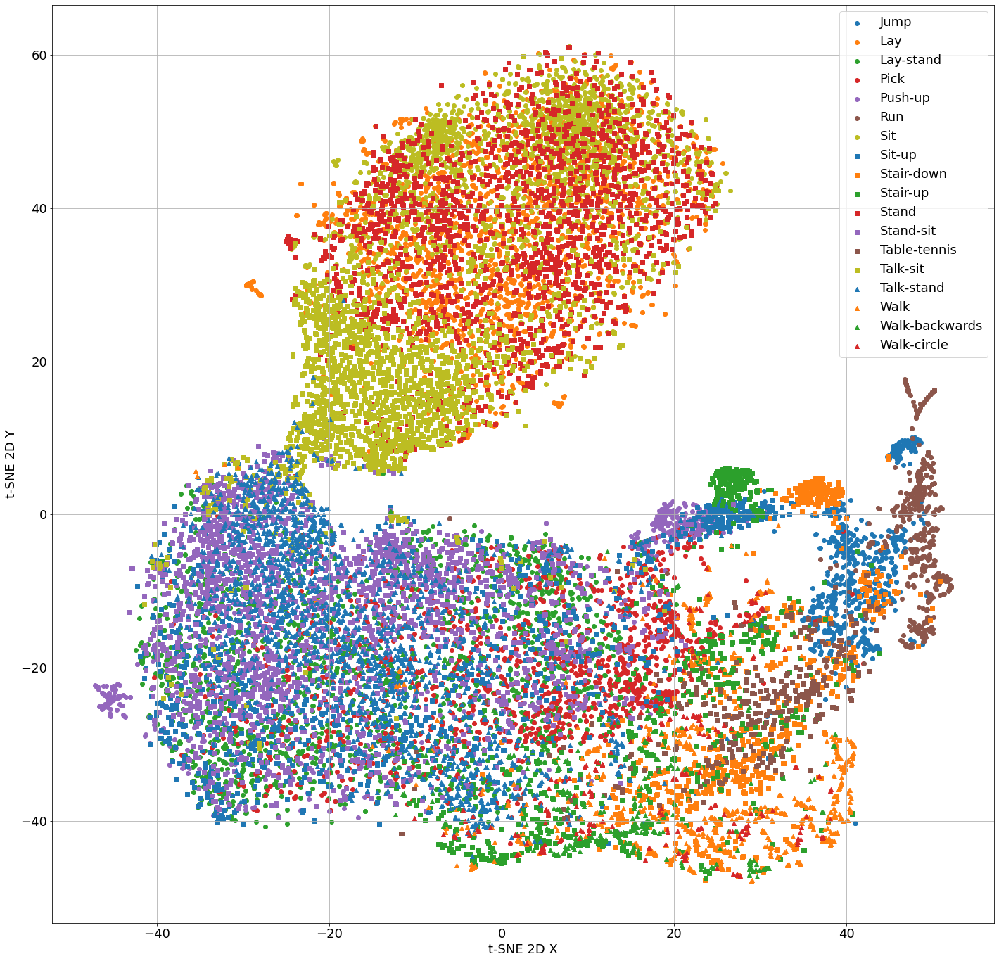

Experiment took 62.624 seconds

Starting experiment with 't-SNE' on 'Ku-HAR dataset (FFT)' with MinMax Scaler. Model parameters: {'n_components': 2, 'perplexity': 30.0}
X.shape=(20750, 1800), y.shape=(20750,)
Model took 68.068 seconds
Figure saved to outputs/manifold/868d6394/kuhar_fft_full-tsne-perp30-minmax-scaler.png


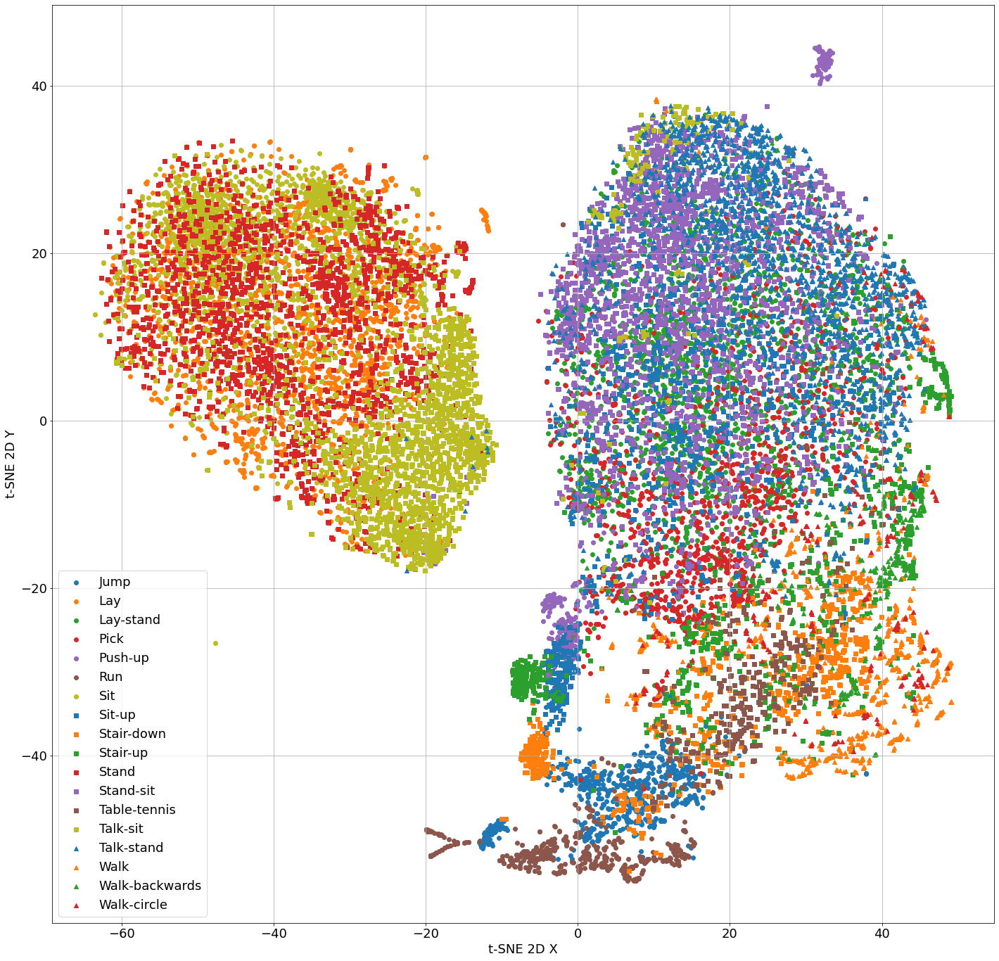

Experiment took 69.637 seconds

Starting experiment with 't-SNE' on 'Ku-HAR dataset (FFT)' with No Scaler. Model parameters: {'n_components': 2, 'perplexity': 60.0}
X.shape=(20750, 1800), y.shape=(20750,)
Model took 69.336 seconds
Figure saved to outputs/manifold/868d6394/kuhar_fft_full-tsne-perp60-no-scaler.png


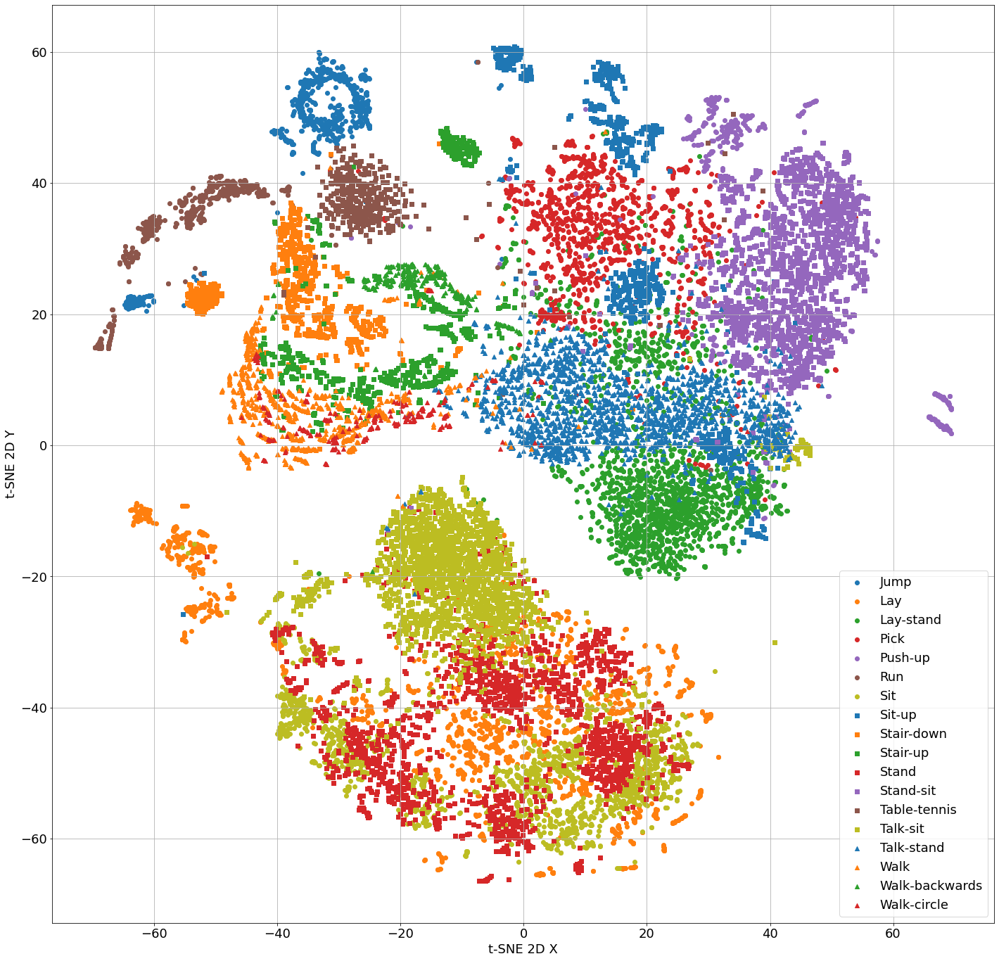

Experiment took 70.779 seconds

Starting experiment with 't-SNE' on 'Ku-HAR dataset (FFT)' with Standard Scaler. Model parameters: {'n_components': 2, 'perplexity': 60.0}
X.shape=(20750, 1800), y.shape=(20750,)
Model took 72.945 seconds
Figure saved to outputs/manifold/868d6394/kuhar_fft_full-tsne-perp60-std-scaler.png


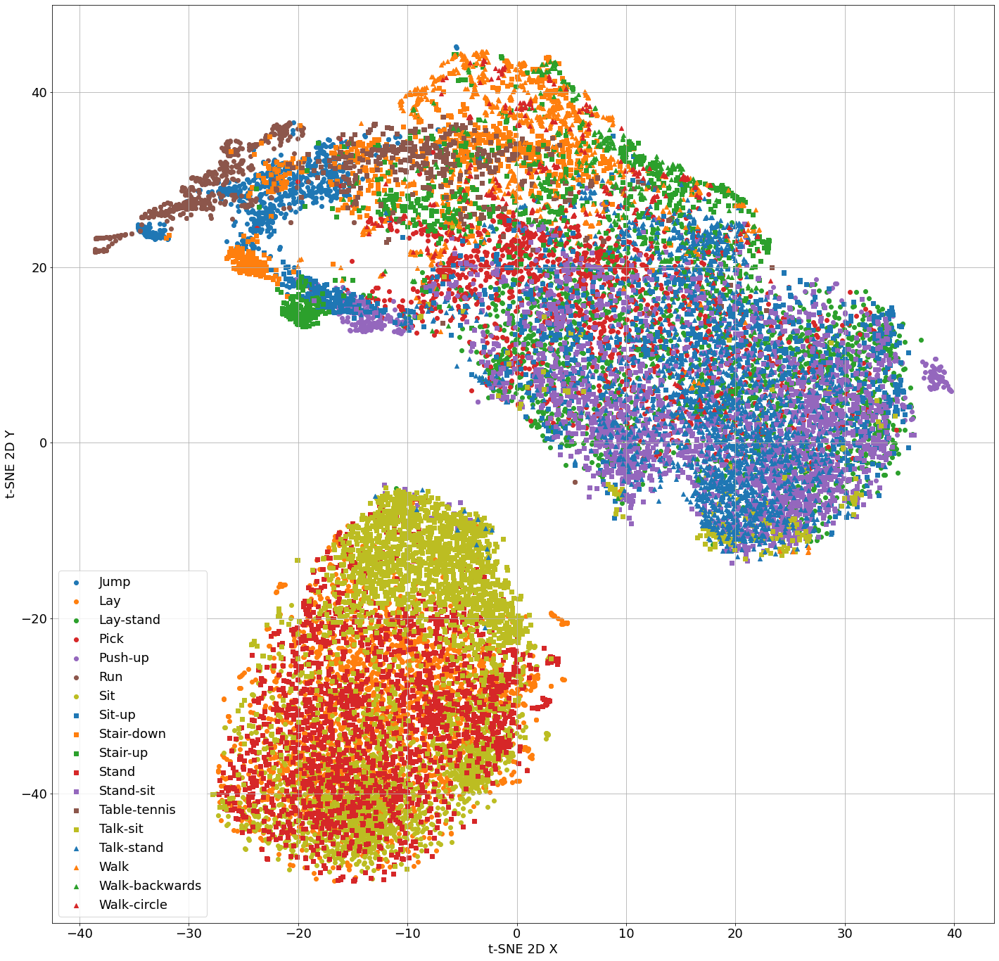

Experiment took 74.765 seconds

Starting experiment with 't-SNE' on 'Ku-HAR dataset (FFT)' with MinMax Scaler. Model parameters: {'n_components': 2, 'perplexity': 60.0}
X.shape=(20750, 1800), y.shape=(20750,)
Model took 76.906 seconds
Figure saved to outputs/manifold/868d6394/kuhar_fft_full-tsne-perp60-minmax-scaler.png


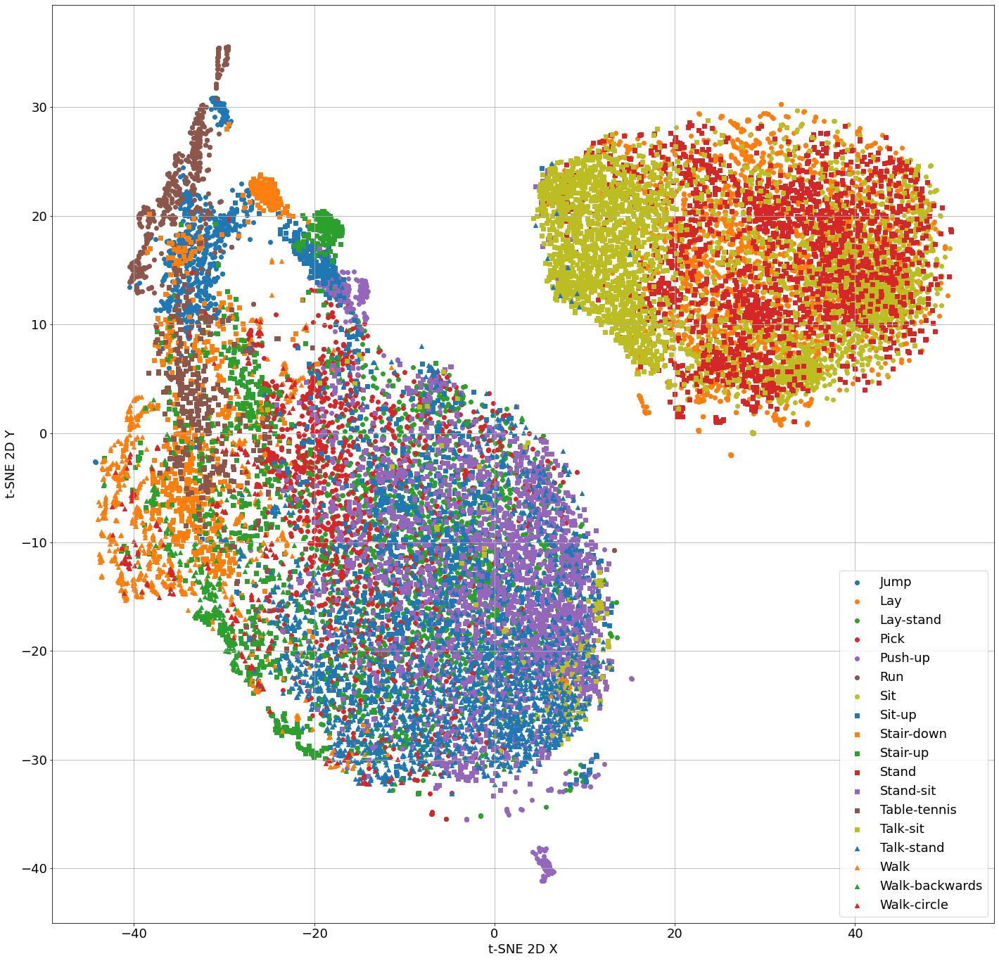

Experiment took 78.546 seconds

Starting experiment with 'UMAP' on 'Ku-HAR dataset (FFT per row)' with No Scaler. Model parameters: {'n_components': 2}
X.shape=(20750, 1800), y.shape=(20750,)
Model took 9.773 seconds
Figure saved to outputs/manifold/868d6394/kuhar_fft_sensor-umap-no-scaler.png


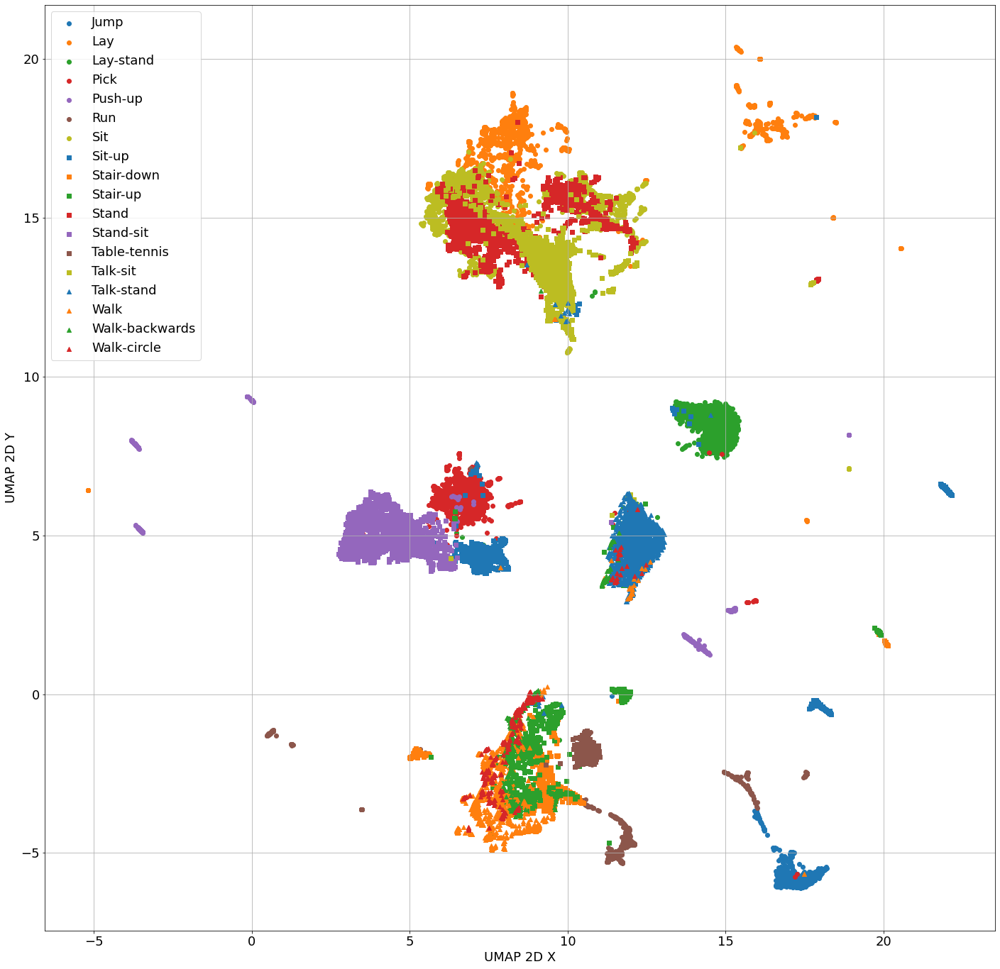

Experiment took 10.989 seconds

Starting experiment with 'UMAP' on 'Ku-HAR dataset (FFT per row)' with Standard Scaler. Model parameters: {'n_components': 2}
X.shape=(20750, 1800), y.shape=(20750,)
Model took 9.859 seconds
Figure saved to outputs/manifold/868d6394/kuhar_fft_sensor-umap-std-scaler.png


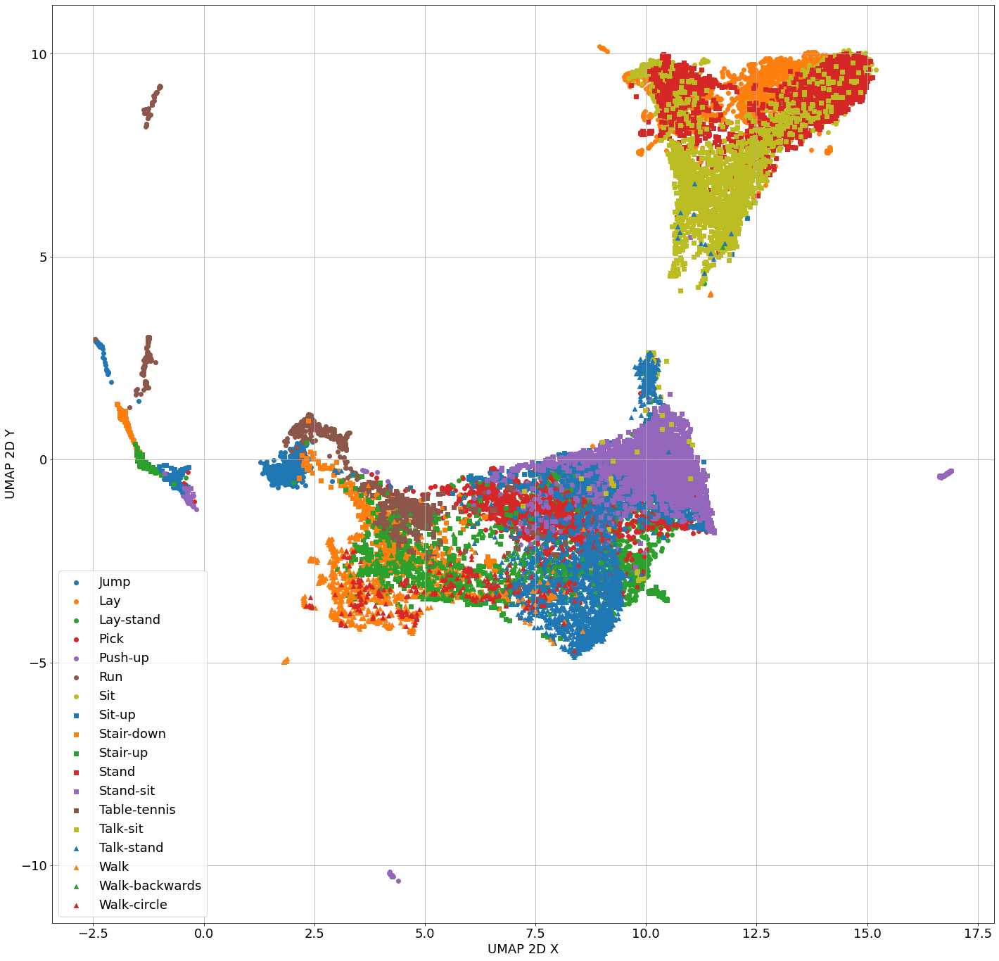

Experiment took 11.635 seconds

Starting experiment with 'UMAP' on 'Ku-HAR dataset (FFT per row)' with MinMax Scaler. Model parameters: {'n_components': 2}
X.shape=(20750, 1800), y.shape=(20750,)
Model took 10.099 seconds
Figure saved to outputs/manifold/868d6394/kuhar_fft_sensor-umap-minmax-scaler.png


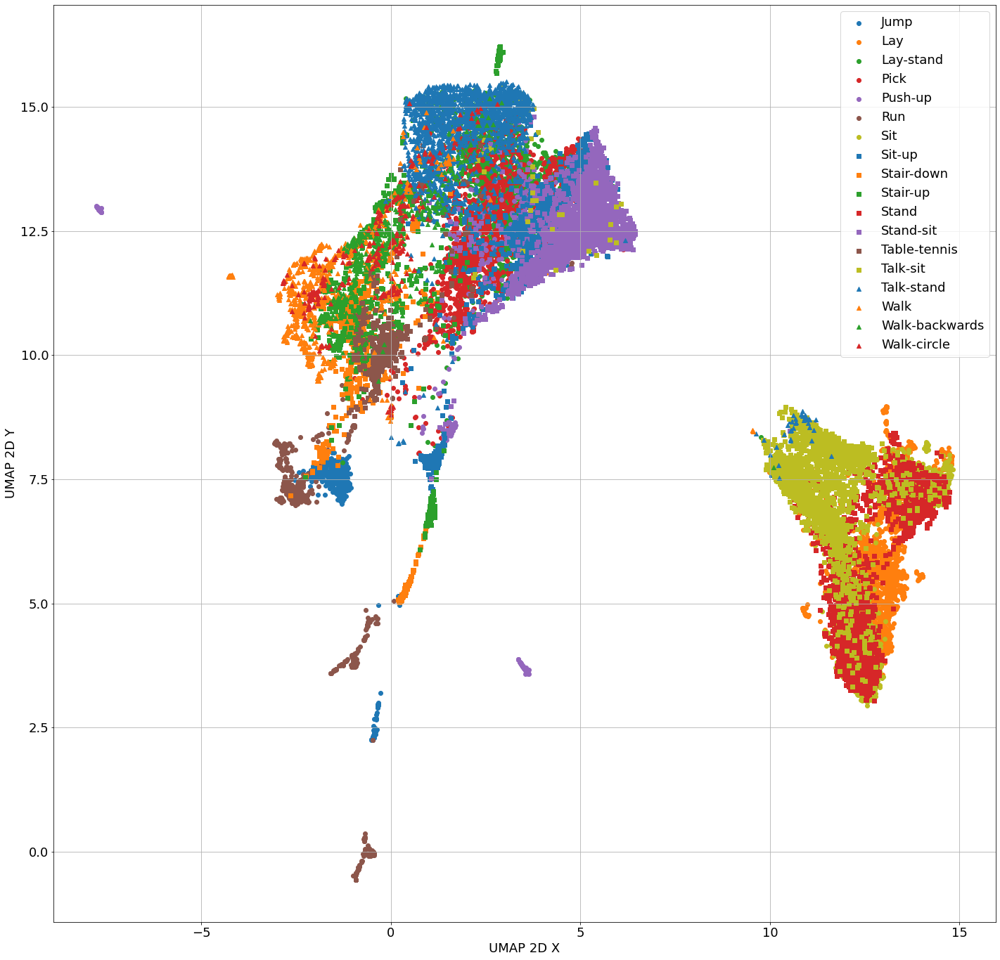

Experiment took 11.442 seconds

Starting experiment with 't-SNE' on 'Ku-HAR dataset (FFT per row)' with No Scaler. Model parameters: {'n_components': 2, 'perplexity': 30.0}
X.shape=(20750, 1800), y.shape=(20750,)
Model took 56.678 seconds
Figure saved to outputs/manifold/868d6394/kuhar_fft_sensor-tsne-perp30-no-scaler.png


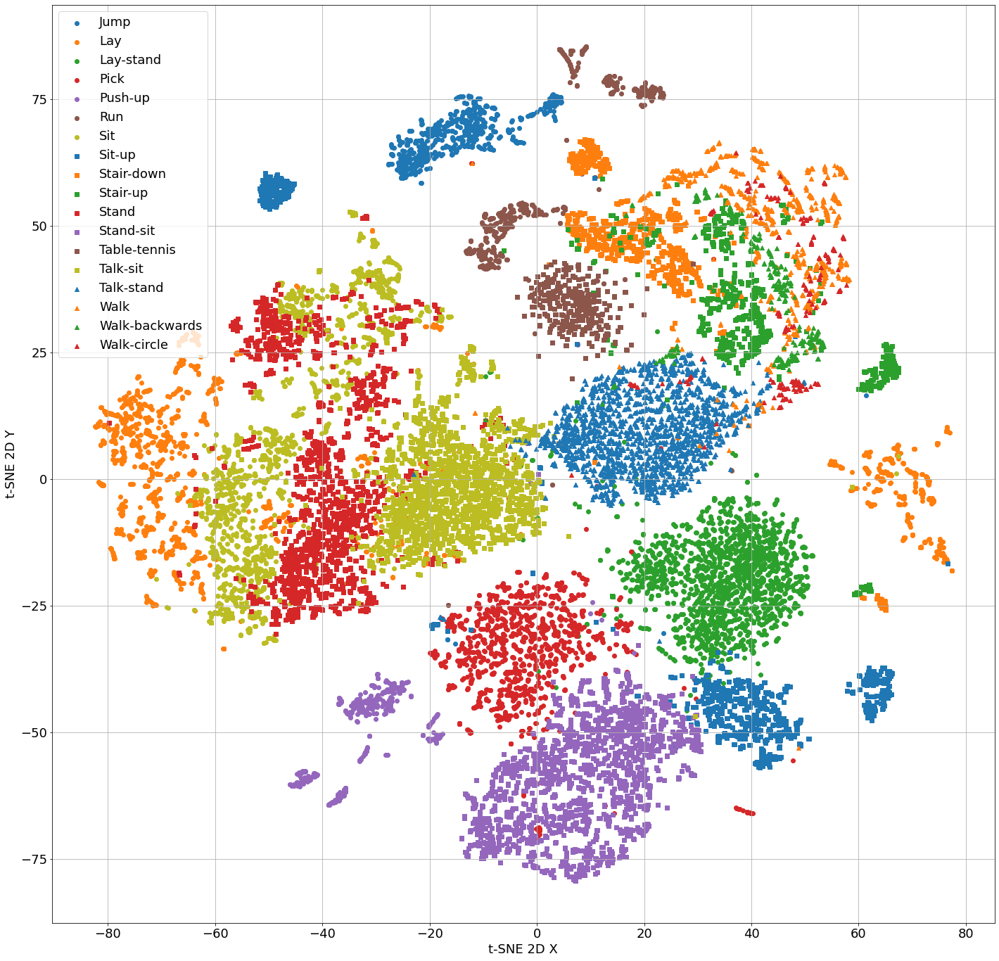

Experiment took 58.603 seconds

Starting experiment with 't-SNE' on 'Ku-HAR dataset (FFT per row)' with Standard Scaler. Model parameters: {'n_components': 2, 'perplexity': 30.0}
X.shape=(20750, 1800), y.shape=(20750,)
Model took 61.379 seconds
Figure saved to outputs/manifold/868d6394/kuhar_fft_sensor-tsne-perp30-std-scaler.png


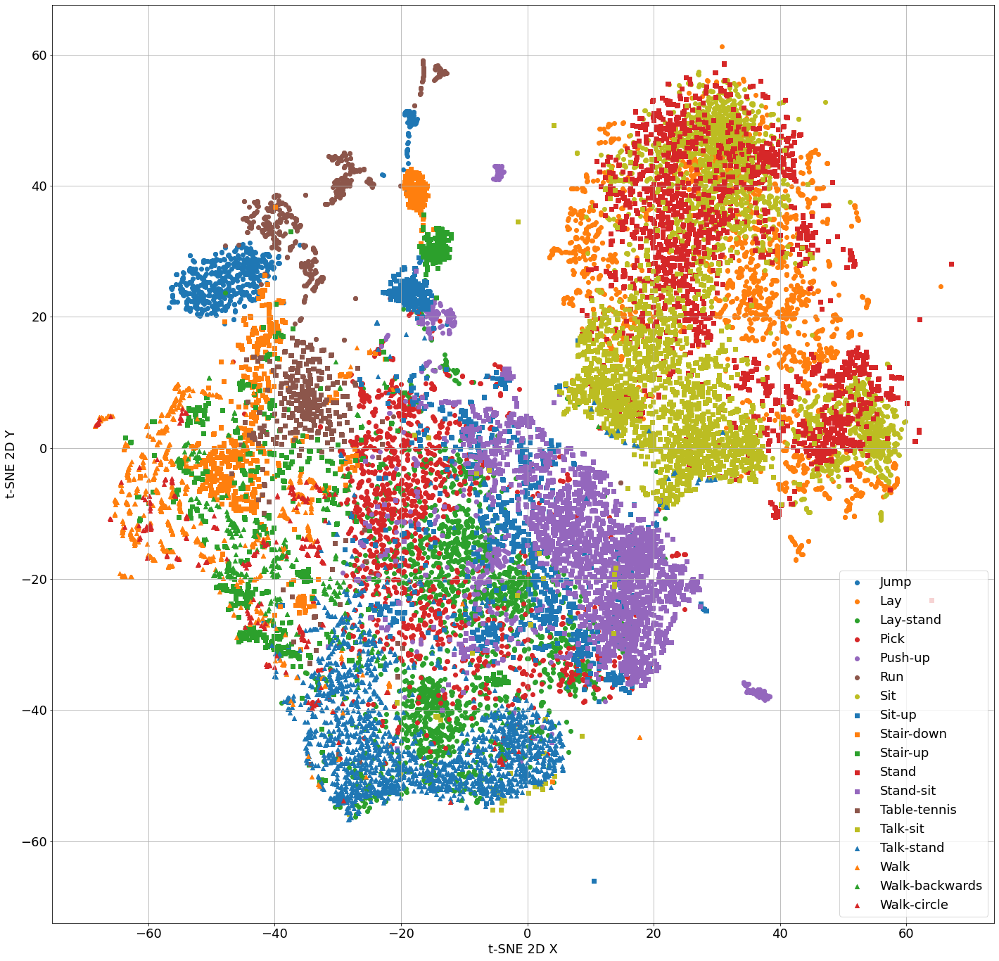

Experiment took 63.765 seconds

Starting experiment with 't-SNE' on 'Ku-HAR dataset (FFT per row)' with MinMax Scaler. Model parameters: {'n_components': 2, 'perplexity': 30.0}
X.shape=(20750, 1800), y.shape=(20750,)
Model took 62.609 seconds
Figure saved to outputs/manifold/868d6394/kuhar_fft_sensor-tsne-perp30-minmax-scaler.png


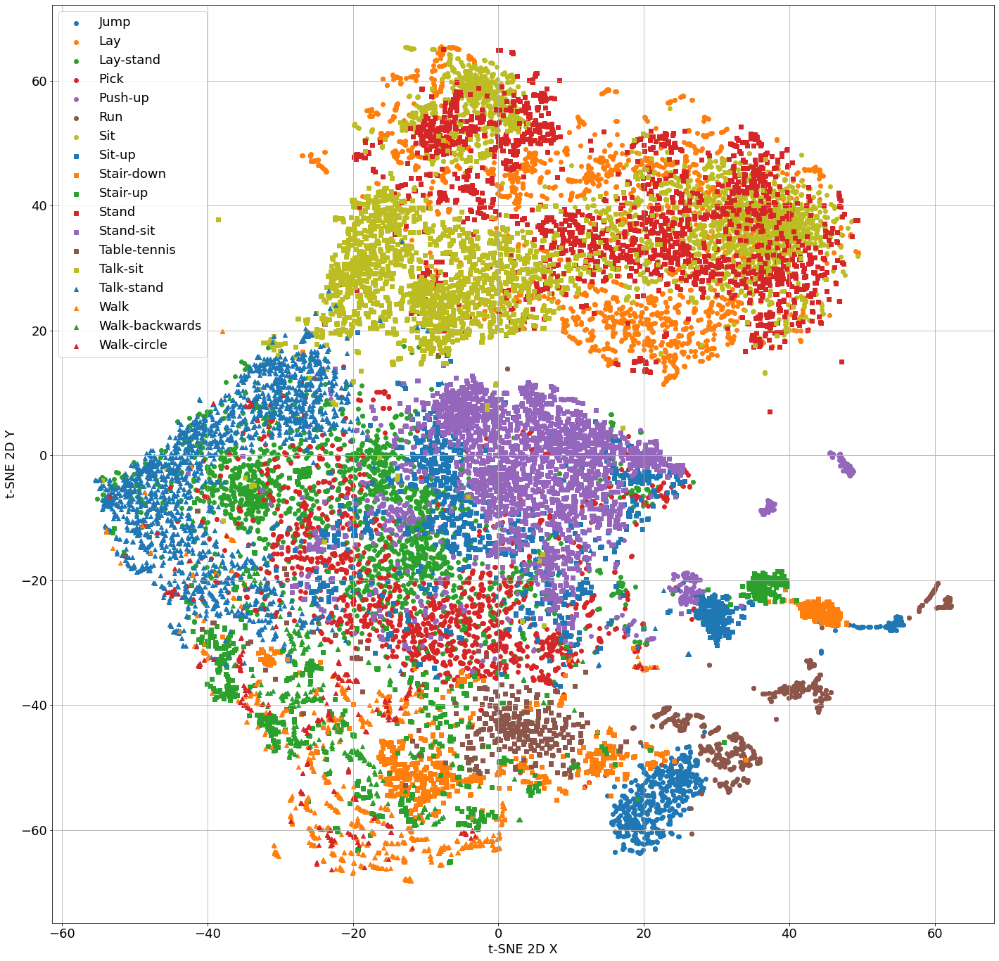

Experiment took 64.085 seconds

Starting experiment with 't-SNE' on 'Ku-HAR dataset (FFT per row)' with No Scaler. Model parameters: {'n_components': 2, 'perplexity': 60.0}
X.shape=(20750, 1800), y.shape=(20750,)
Model took 68.067 seconds
Figure saved to outputs/manifold/868d6394/kuhar_fft_sensor-tsne-perp60-no-scaler.png


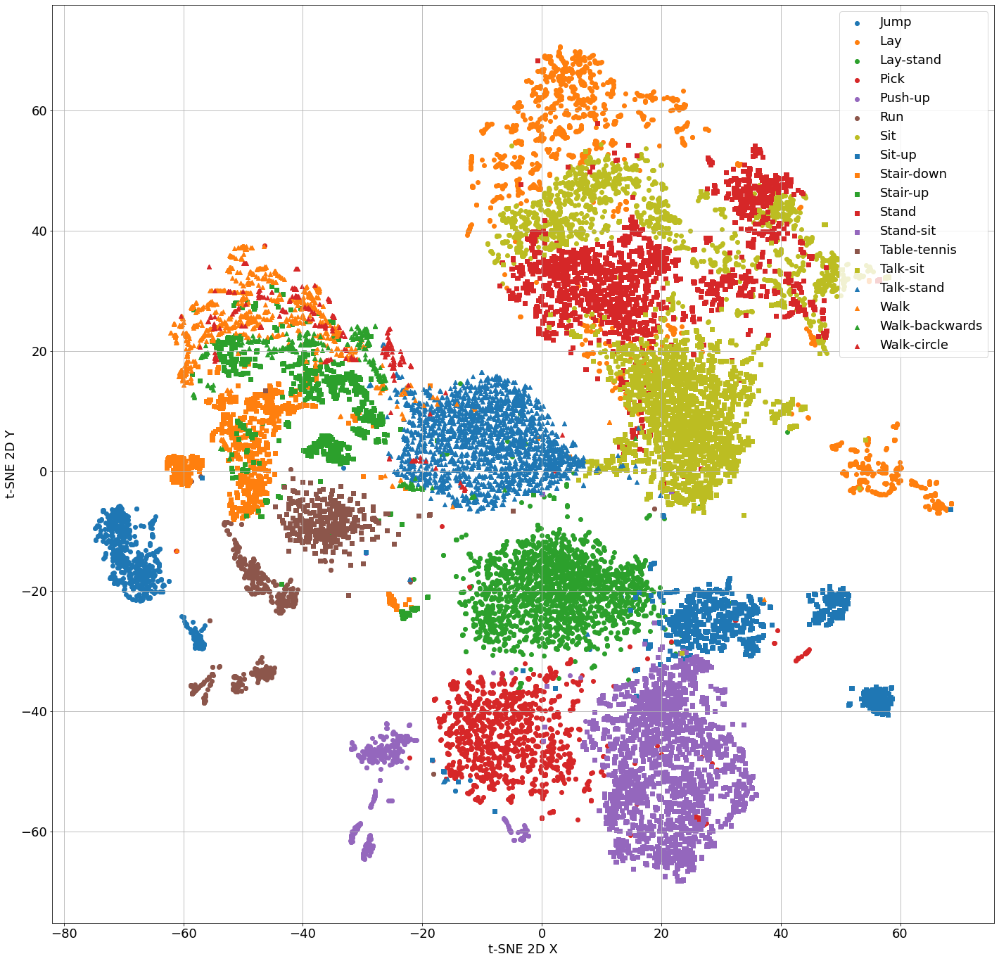

Experiment took 69.971 seconds

Starting experiment with 't-SNE' on 'Ku-HAR dataset (FFT per row)' with Standard Scaler. Model parameters: {'n_components': 2, 'perplexity': 60.0}
X.shape=(20750, 1800), y.shape=(20750,)
Model took 79.543 seconds
Figure saved to outputs/manifold/868d6394/kuhar_fft_sensor-tsne-perp60-std-scaler.png


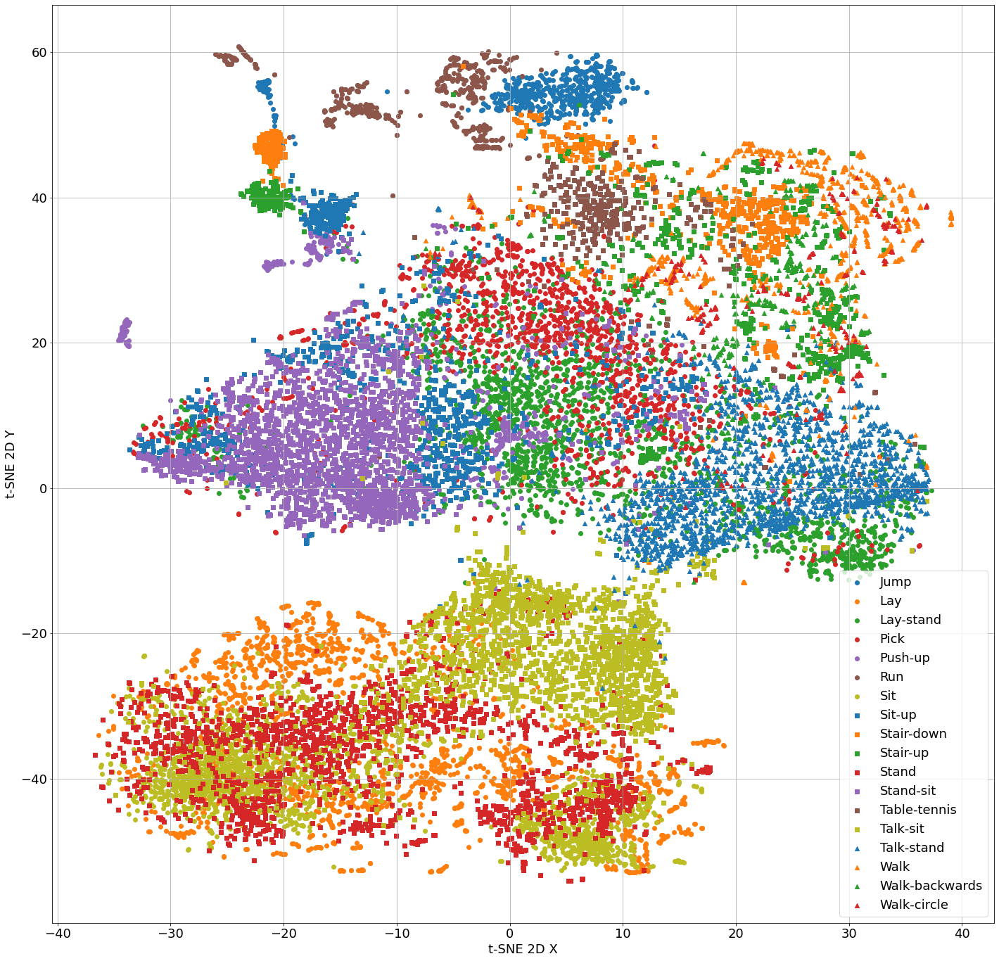

Experiment took 81.945 seconds

Starting experiment with 't-SNE' on 'Ku-HAR dataset (FFT per row)' with MinMax Scaler. Model parameters: {'n_components': 2, 'perplexity': 60.0}
X.shape=(20750, 1800), y.shape=(20750,)
Model took 73.928 seconds
Figure saved to outputs/manifold/868d6394/kuhar_fft_sensor-tsne-perp60-minmax-scaler.png


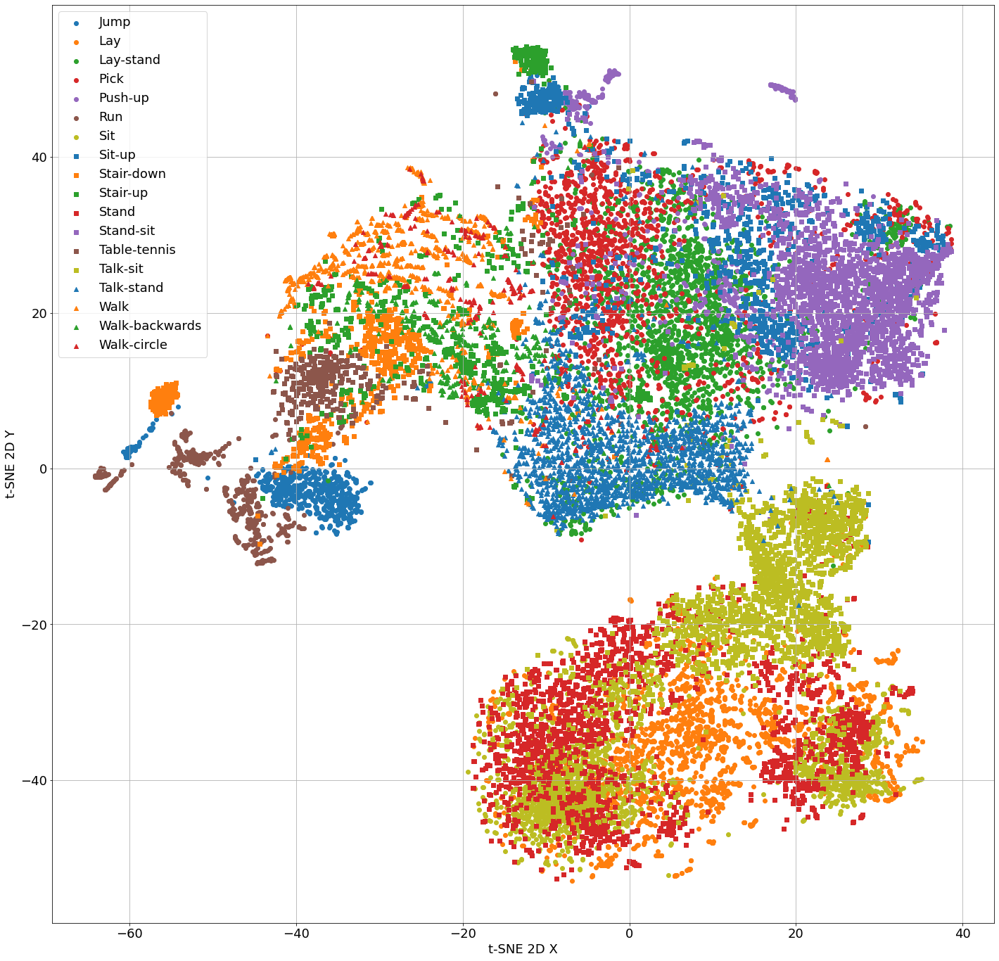

Experiment took 75.383 seconds

Starting experiment with 'UMAP' on 'Balanced Ku-HAR dataset' with No Scaler. Model parameters: {'n_components': 2}
X.shape=(7236, 1800), y.shape=(7236,)
Model took 8.262 seconds
Figure saved to outputs/manifold/868d6394/balanced_kuhar-umap-no-scaler.png


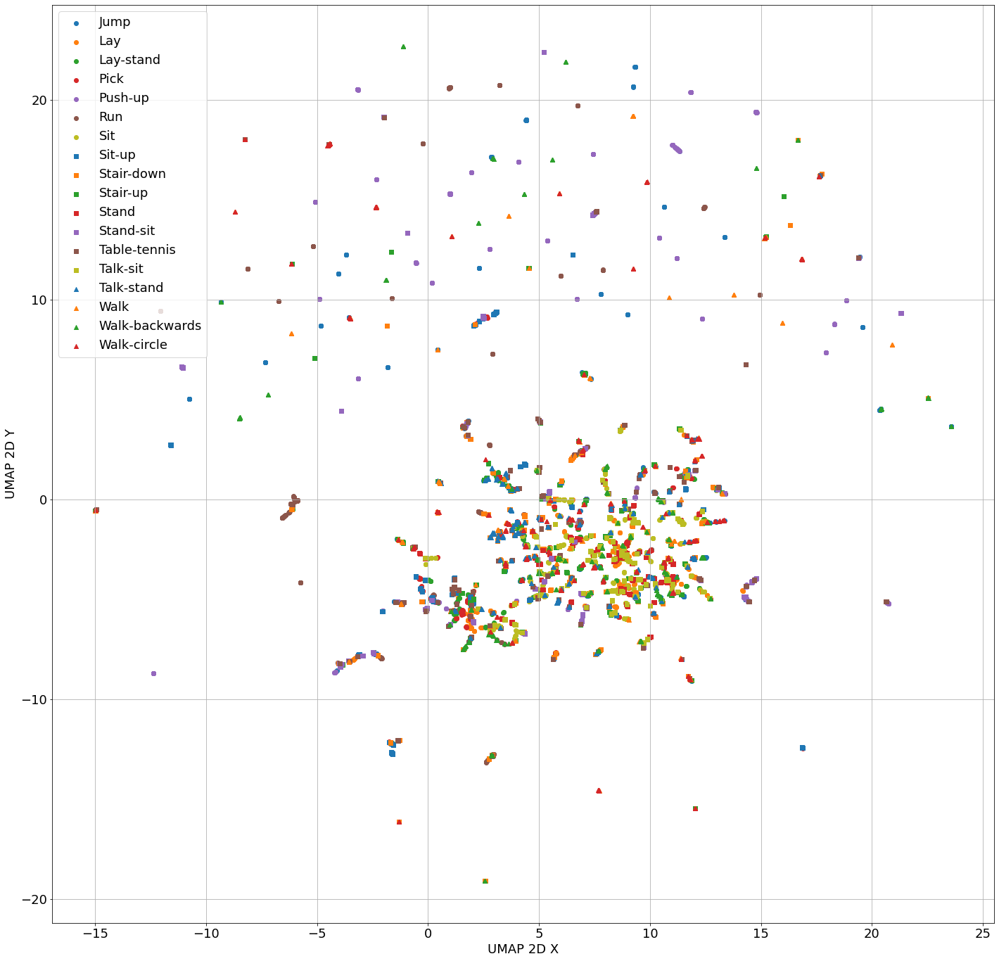

Experiment took 9.469 seconds

Starting experiment with 'UMAP' on 'Balanced Ku-HAR dataset' with Standard Scaler. Model parameters: {'n_components': 2}
X.shape=(7236, 1800), y.shape=(7236,)
Model took 8.451 seconds
Figure saved to outputs/manifold/868d6394/balanced_kuhar-umap-std-scaler.png


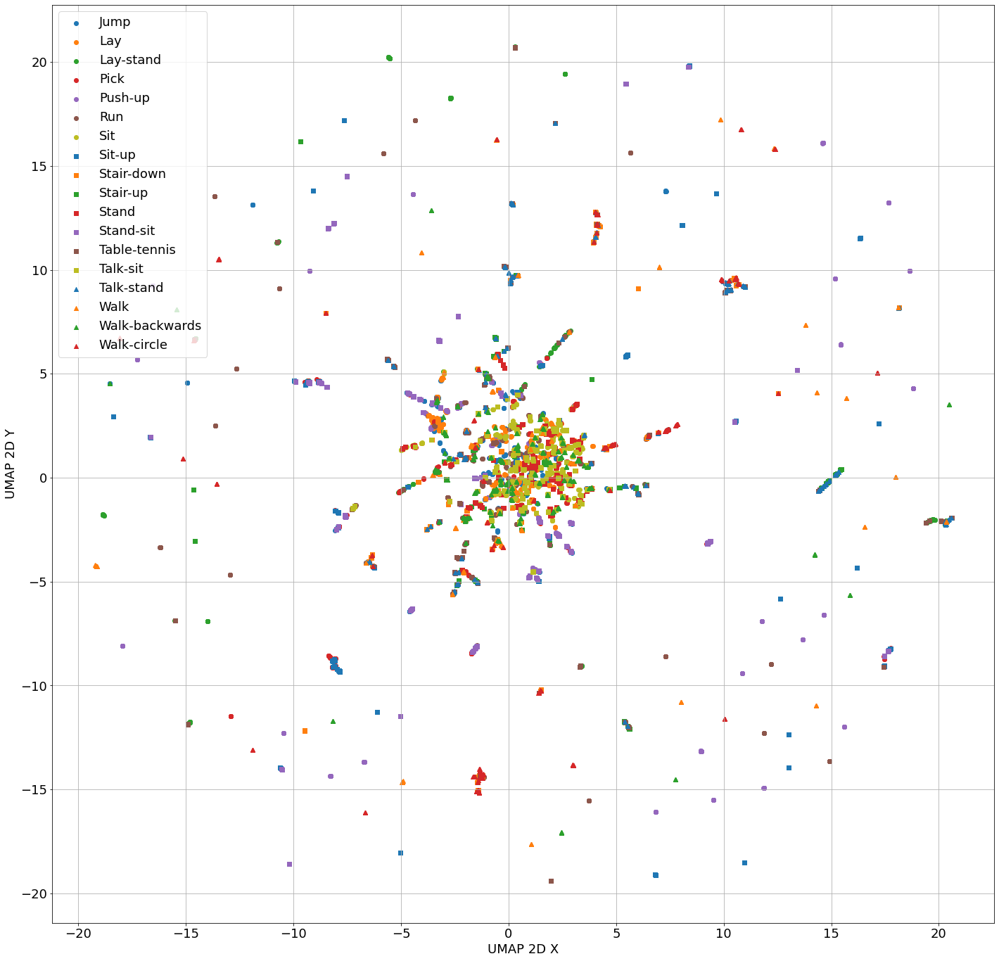

Experiment took 9.826 seconds

Starting experiment with 'UMAP' on 'Balanced Ku-HAR dataset' with MinMax Scaler. Model parameters: {'n_components': 2}
X.shape=(7236, 1800), y.shape=(7236,)
Model took 8.381 seconds
Figure saved to outputs/manifold/868d6394/balanced_kuhar-umap-minmax-scaler.png


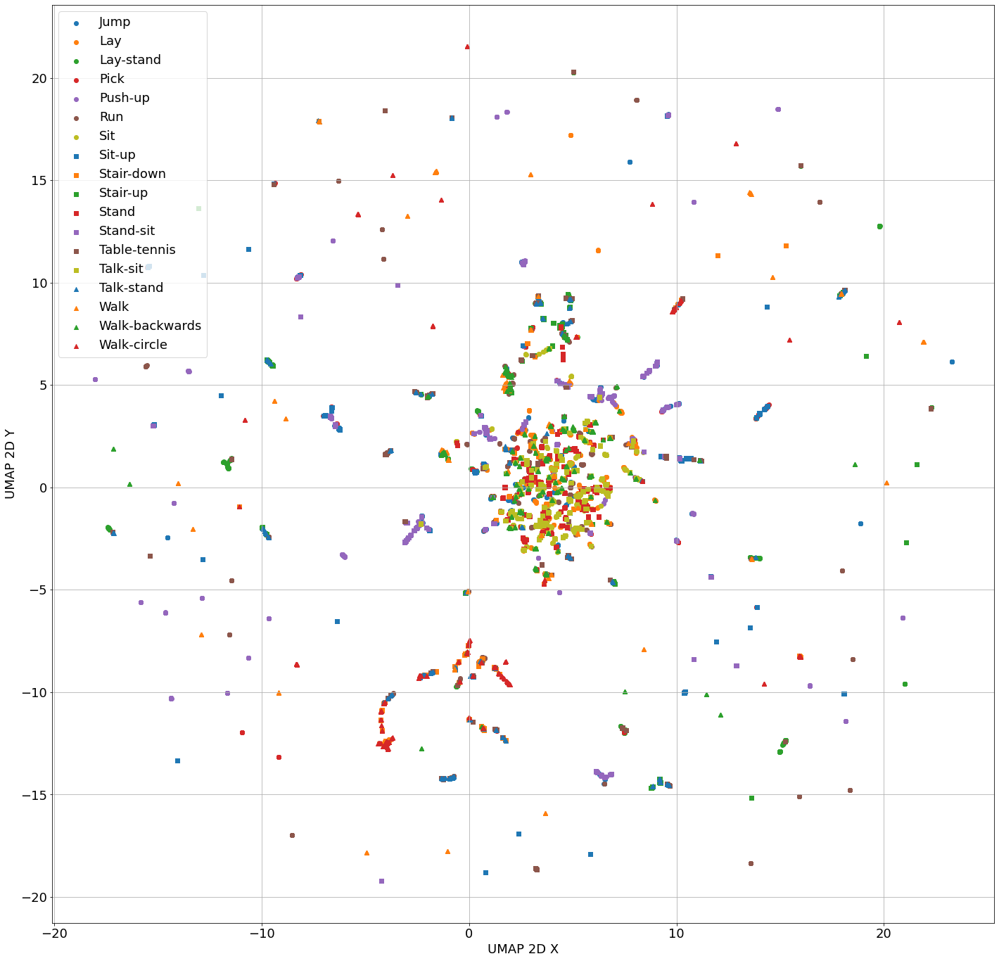

Experiment took 9.643 seconds

Starting experiment with 't-SNE' on 'Balanced Ku-HAR dataset' with No Scaler. Model parameters: {'n_components': 2, 'perplexity': 30.0}
X.shape=(7236, 1800), y.shape=(7236,)
Model took 19.229 seconds
Figure saved to outputs/manifold/868d6394/balanced_kuhar-tsne-perp30-no-scaler.png


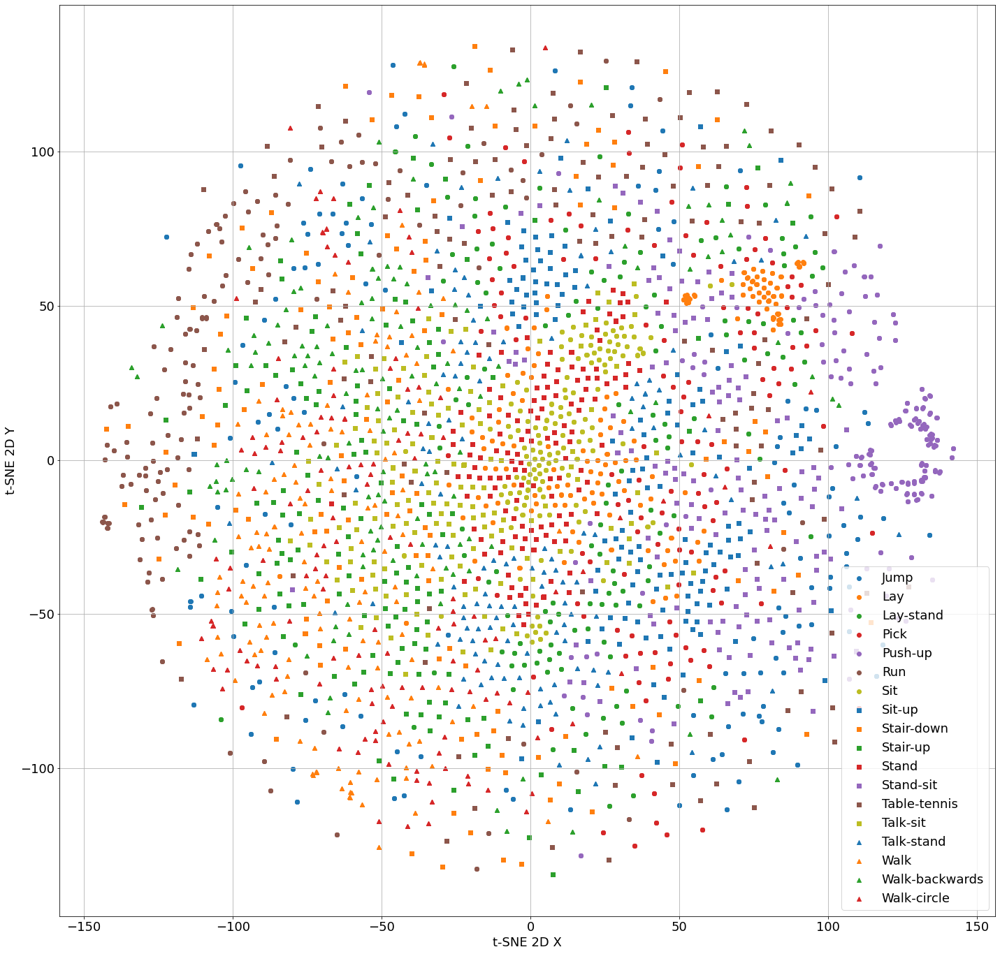

Experiment took 20.441 seconds

Starting experiment with 't-SNE' on 'Balanced Ku-HAR dataset' with Standard Scaler. Model parameters: {'n_components': 2, 'perplexity': 30.0}
X.shape=(7236, 1800), y.shape=(7236,)
Model took 18.085 seconds
Figure saved to outputs/manifold/868d6394/balanced_kuhar-tsne-perp30-std-scaler.png


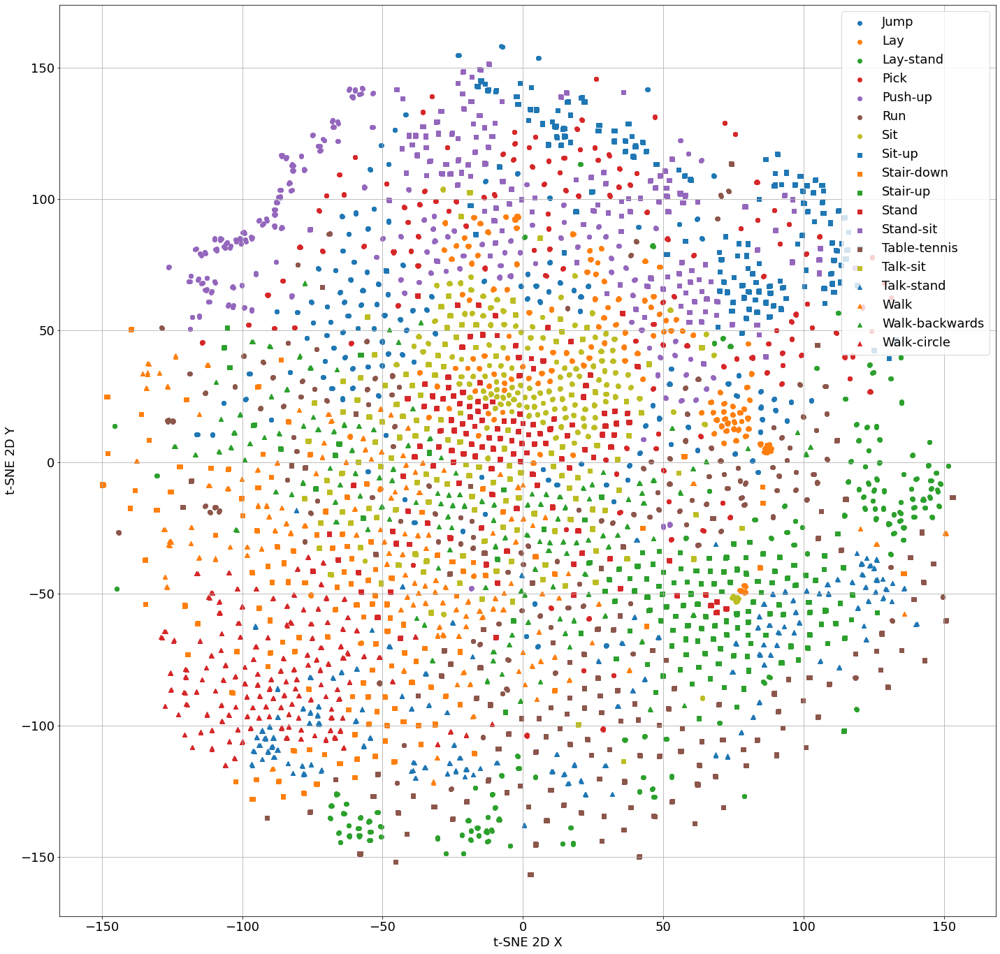

Experiment took 19.479 seconds

Starting experiment with 't-SNE' on 'Balanced Ku-HAR dataset' with MinMax Scaler. Model parameters: {'n_components': 2, 'perplexity': 30.0}
X.shape=(7236, 1800), y.shape=(7236,)
Model took 19.211 seconds
Figure saved to outputs/manifold/868d6394/balanced_kuhar-tsne-perp30-minmax-scaler.png


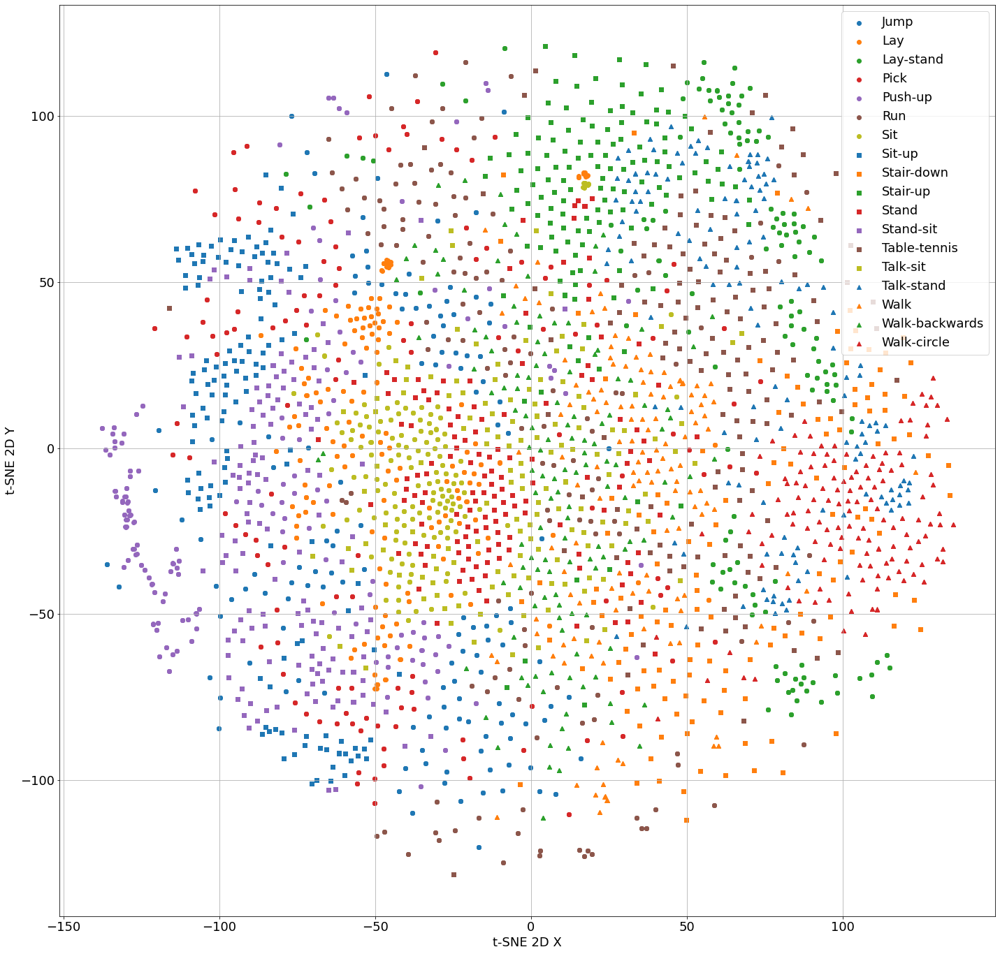

Experiment took 20.464 seconds

Starting experiment with 't-SNE' on 'Balanced Ku-HAR dataset' with No Scaler. Model parameters: {'n_components': 2, 'perplexity': 60.0}
X.shape=(7236, 1800), y.shape=(7236,)
Model took 24.354 seconds
Figure saved to outputs/manifold/868d6394/balanced_kuhar-tsne-perp60-no-scaler.png


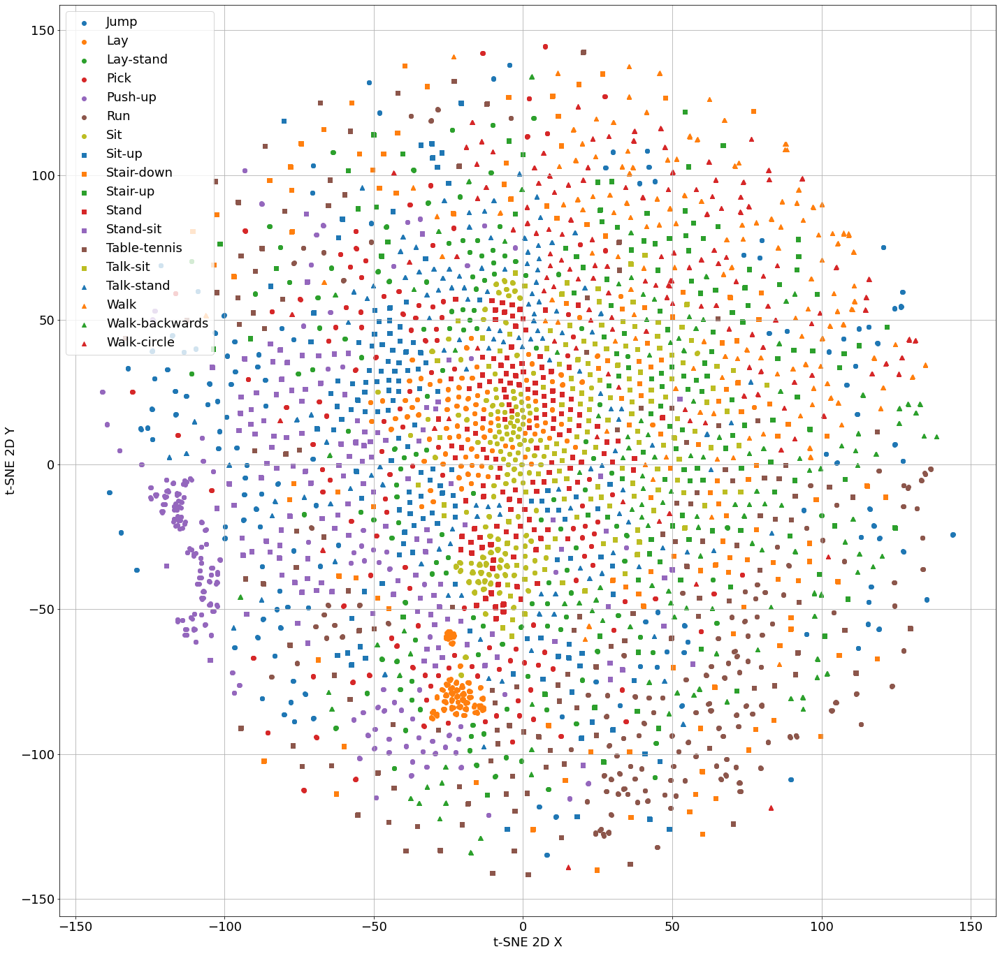

Experiment took 25.576 seconds

Starting experiment with 't-SNE' on 'Balanced Ku-HAR dataset' with Standard Scaler. Model parameters: {'n_components': 2, 'perplexity': 60.0}
X.shape=(7236, 1800), y.shape=(7236,)
Model took 24.632 seconds
Figure saved to outputs/manifold/868d6394/balanced_kuhar-tsne-perp60-std-scaler.png


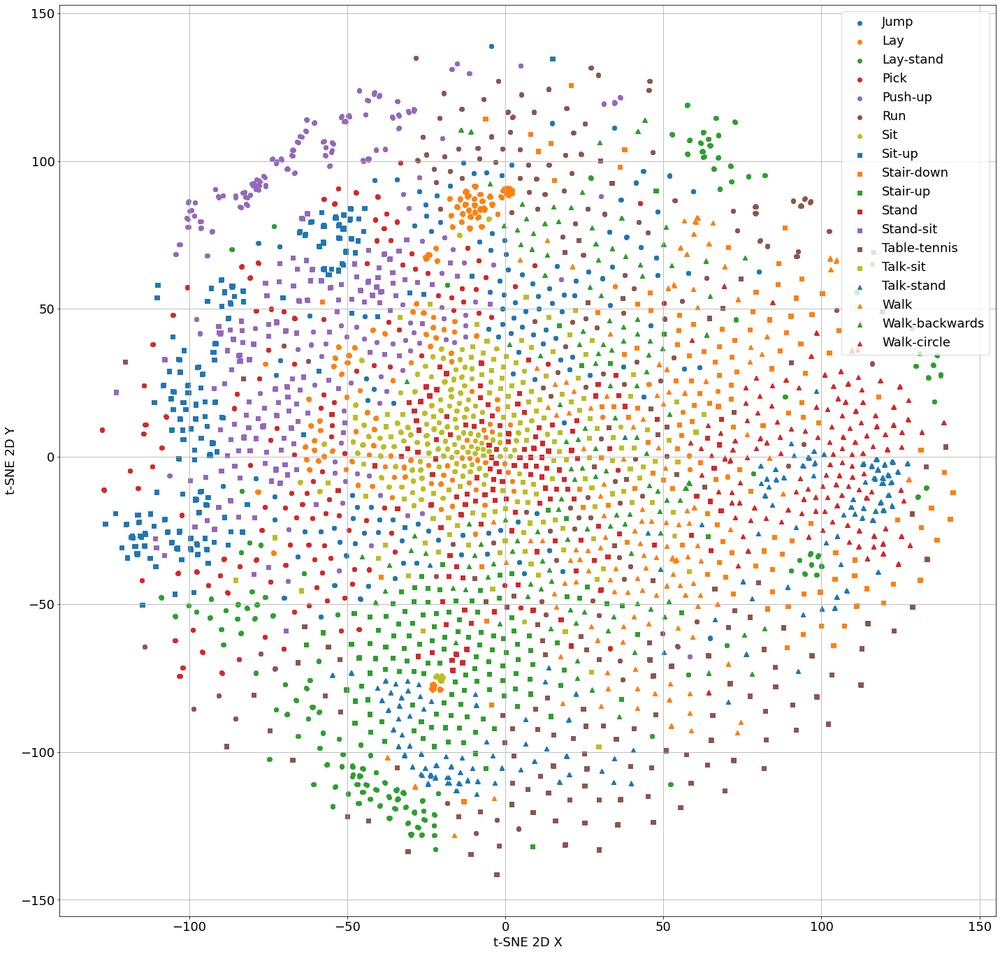

Experiment took 26.005 seconds

Starting experiment with 't-SNE' on 'Balanced Ku-HAR dataset' with MinMax Scaler. Model parameters: {'n_components': 2, 'perplexity': 60.0}
X.shape=(7236, 1800), y.shape=(7236,)
Model took 24.447 seconds
Figure saved to outputs/manifold/868d6394/balanced_kuhar-tsne-perp60-minmax-scaler.png


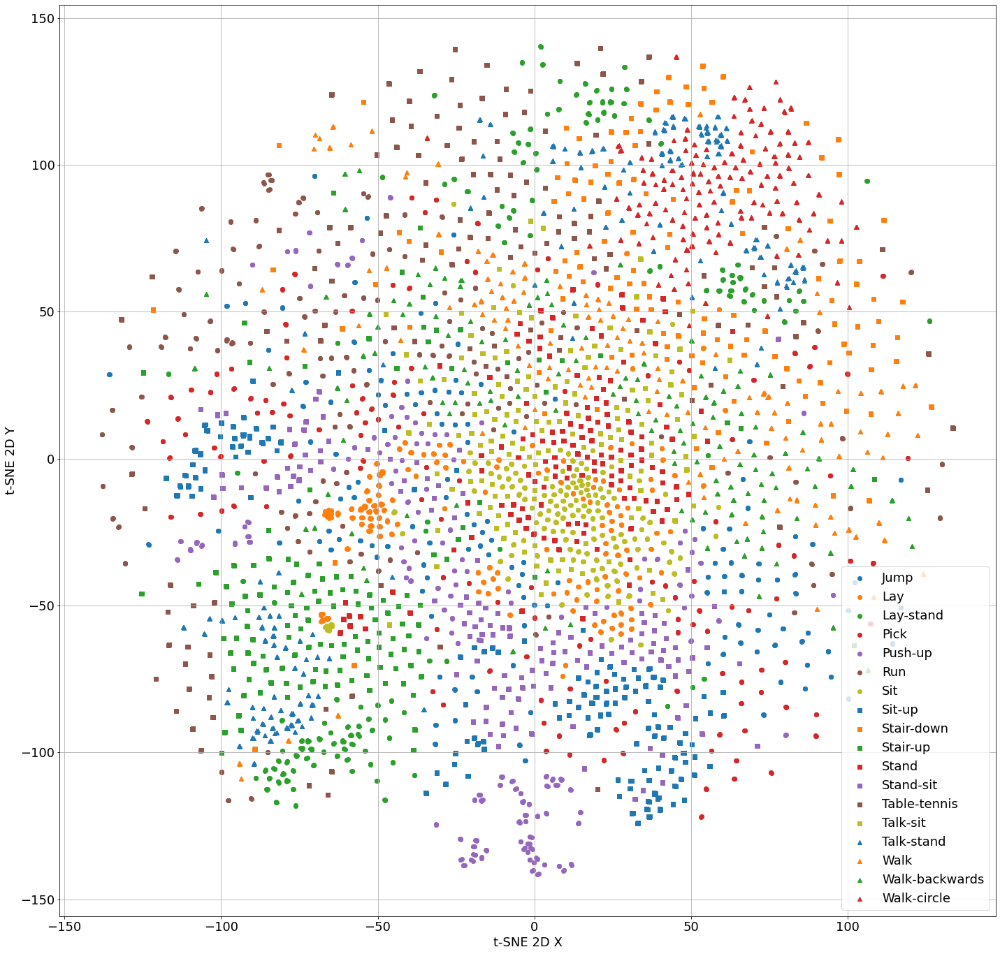

Experiment took 25.722 seconds

Starting experiment with 'UMAP' on 'Balanced Ku-HAR dataset (FFT)' with No Scaler. Model parameters: {'n_components': 2}
X.shape=(7236, 1800), y.shape=(7236,)
Model took 7.589 seconds
Figure saved to outputs/manifold/868d6394/balanced_kuhar_fft_full-umap-no-scaler.png


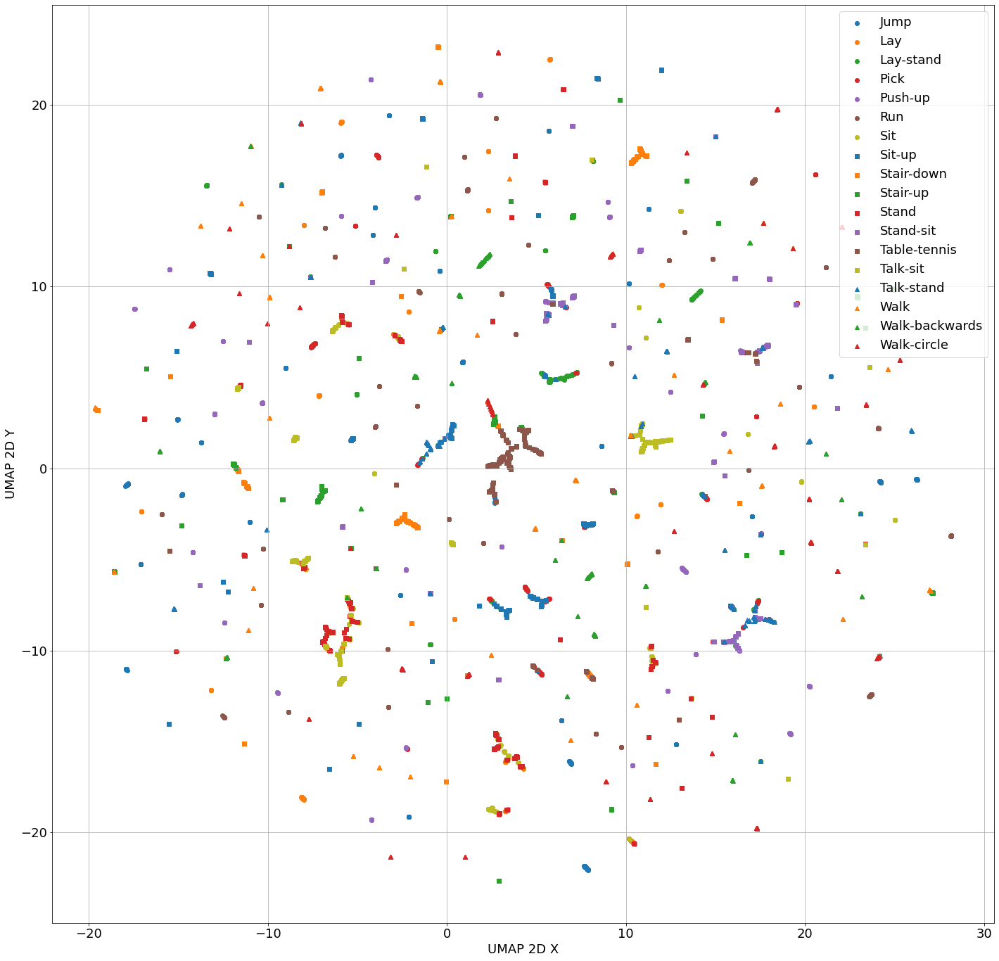

Experiment took 8.773 seconds

Starting experiment with 'UMAP' on 'Balanced Ku-HAR dataset (FFT)' with Standard Scaler. Model parameters: {'n_components': 2}
X.shape=(7236, 1800), y.shape=(7236,)
Model took 9.120 seconds
Figure saved to outputs/manifold/868d6394/balanced_kuhar_fft_full-umap-std-scaler.png


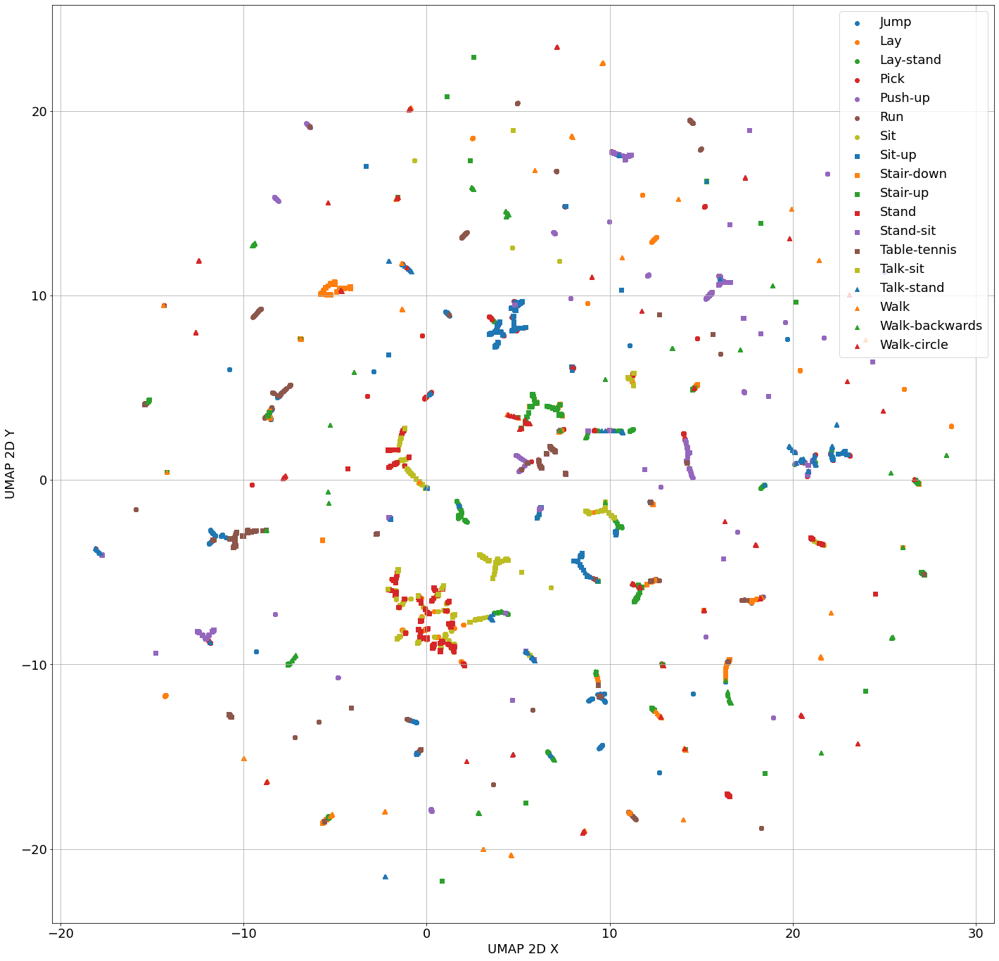

Experiment took 10.453 seconds

Starting experiment with 'UMAP' on 'Balanced Ku-HAR dataset (FFT)' with MinMax Scaler. Model parameters: {'n_components': 2}
X.shape=(7236, 1800), y.shape=(7236,)
Model took 7.616 seconds
Figure saved to outputs/manifold/868d6394/balanced_kuhar_fft_full-umap-minmax-scaler.png


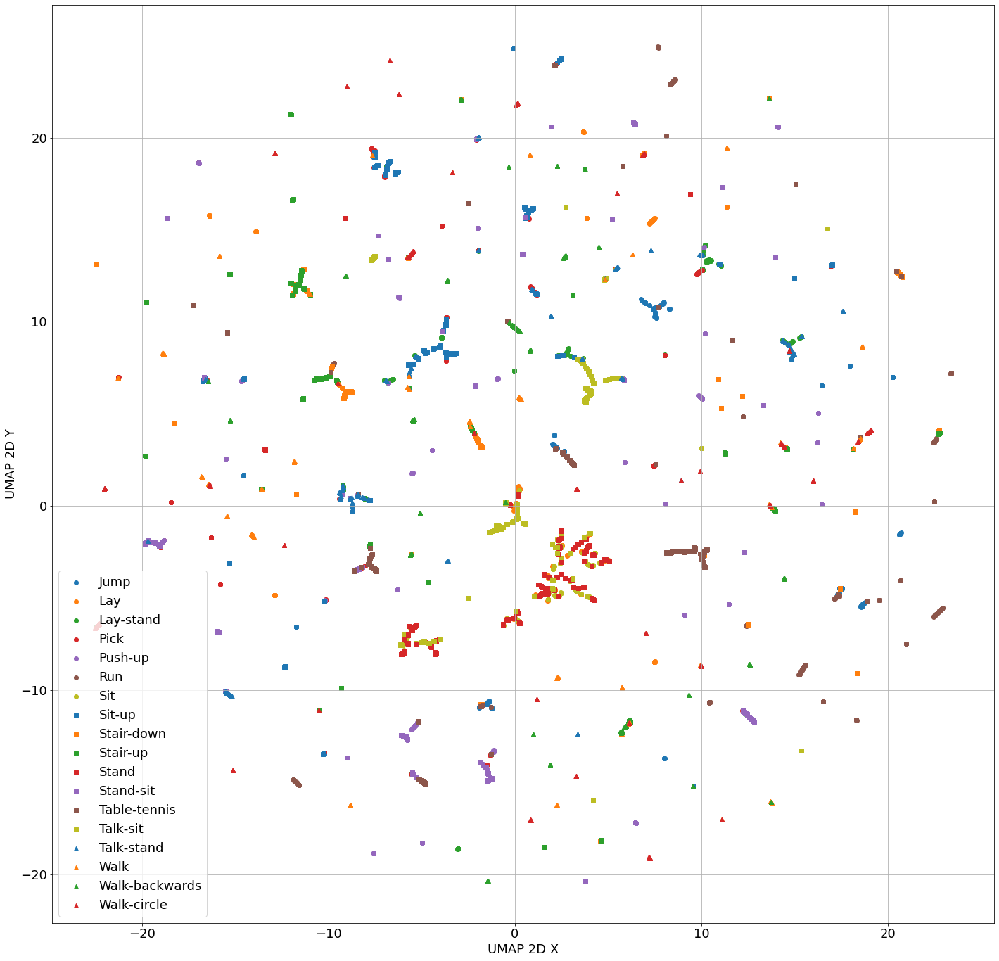

Experiment took 8.851 seconds

Starting experiment with 't-SNE' on 'Balanced Ku-HAR dataset (FFT)' with No Scaler. Model parameters: {'n_components': 2, 'perplexity': 30.0}
X.shape=(7236, 1800), y.shape=(7236,)
Model took 16.617 seconds
Figure saved to outputs/manifold/868d6394/balanced_kuhar_fft_full-tsne-perp30-no-scaler.png


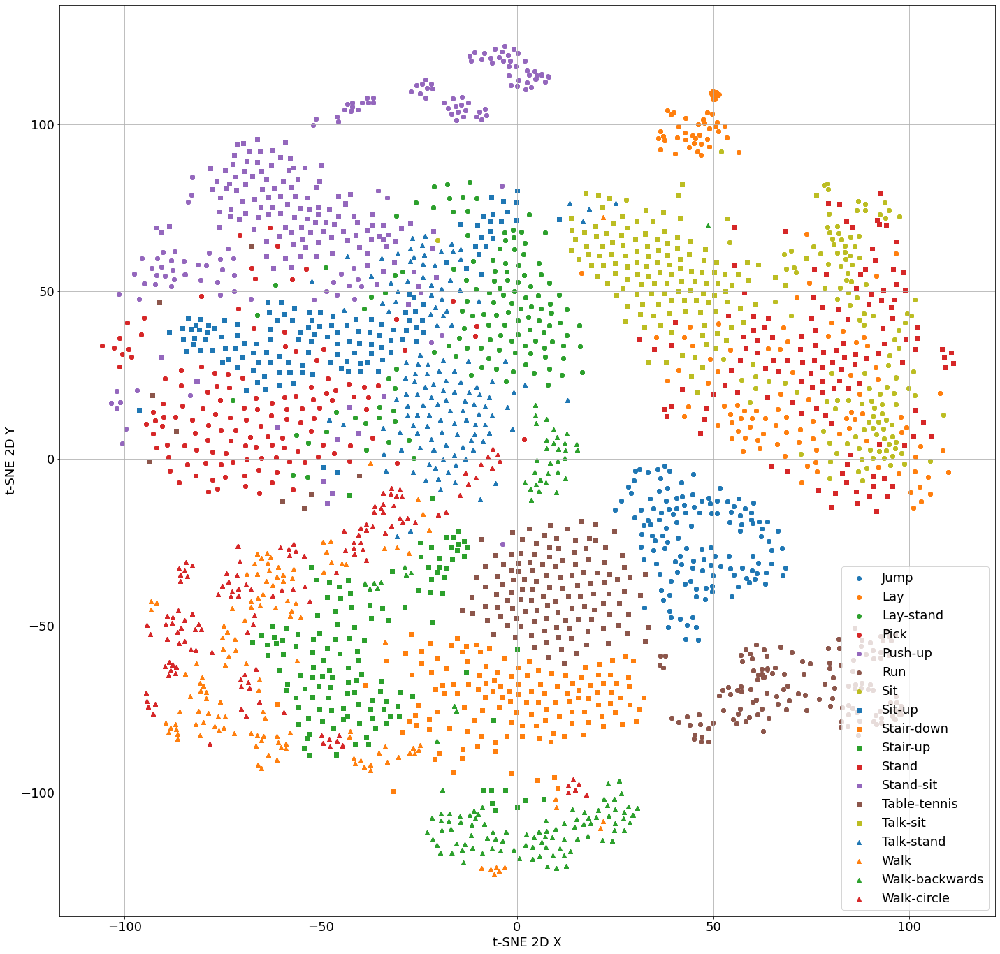

Experiment took 17.795 seconds

Starting experiment with 't-SNE' on 'Balanced Ku-HAR dataset (FFT)' with Standard Scaler. Model parameters: {'n_components': 2, 'perplexity': 30.0}
X.shape=(7236, 1800), y.shape=(7236,)
Model took 16.740 seconds
Figure saved to outputs/manifold/868d6394/balanced_kuhar_fft_full-tsne-perp30-std-scaler.png


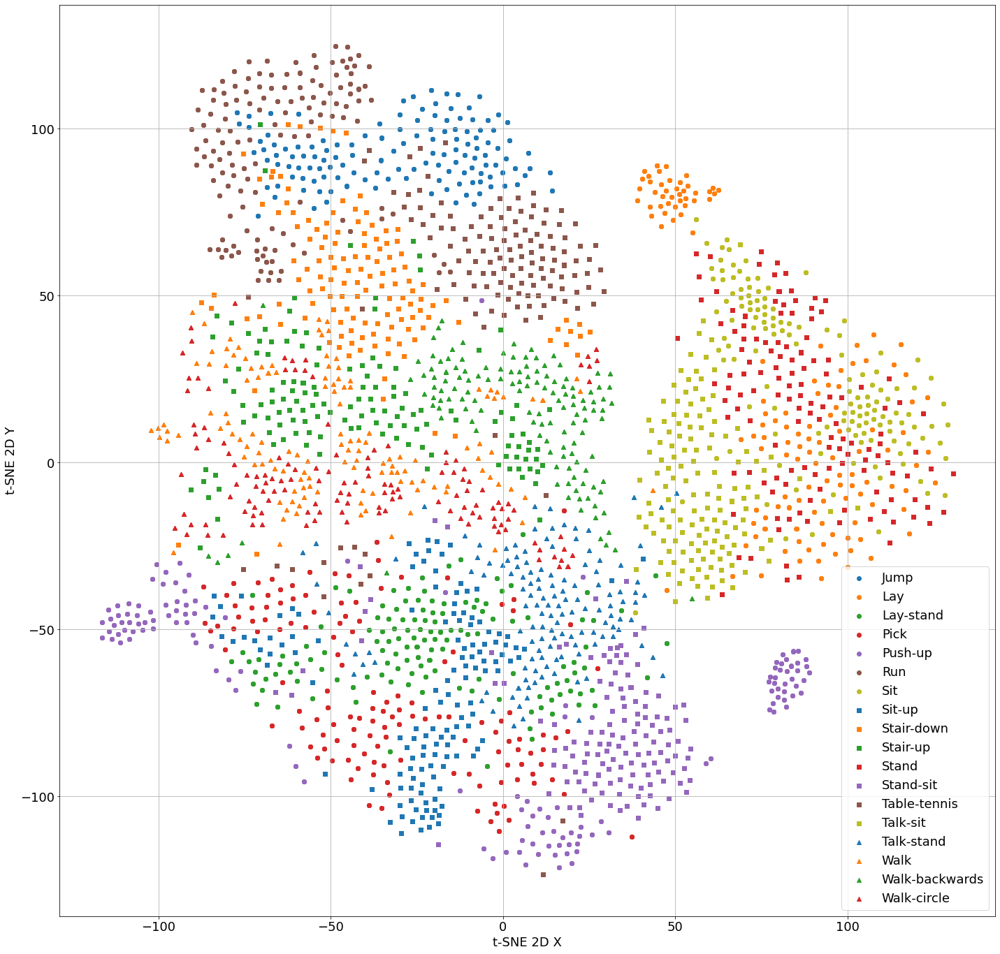

Experiment took 18.070 seconds

Starting experiment with 't-SNE' on 'Balanced Ku-HAR dataset (FFT)' with MinMax Scaler. Model parameters: {'n_components': 2, 'perplexity': 30.0}
X.shape=(7236, 1800), y.shape=(7236,)
Model took 17.414 seconds
Figure saved to outputs/manifold/868d6394/balanced_kuhar_fft_full-tsne-perp30-minmax-scaler.png


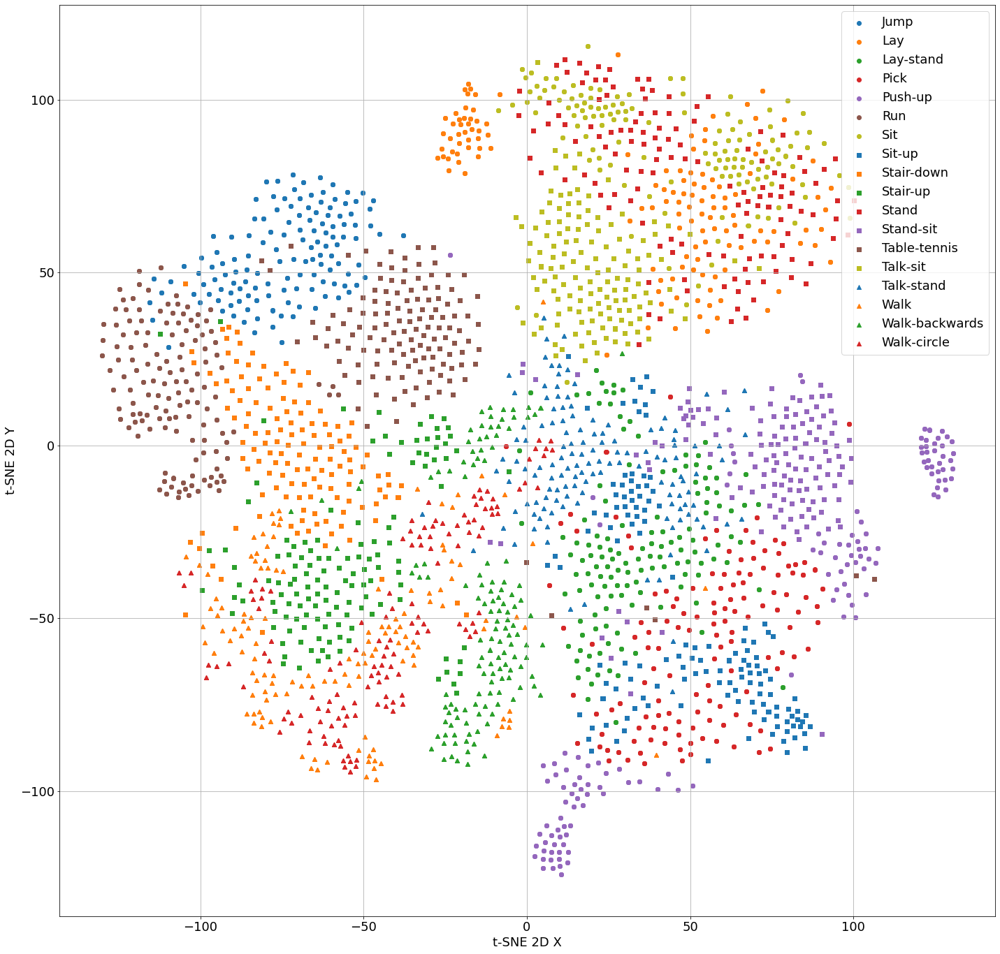

Experiment took 18.666 seconds

Starting experiment with 't-SNE' on 'Balanced Ku-HAR dataset (FFT)' with No Scaler. Model parameters: {'n_components': 2, 'perplexity': 60.0}
X.shape=(7236, 1800), y.shape=(7236,)
Model took 21.071 seconds
Figure saved to outputs/manifold/868d6394/balanced_kuhar_fft_full-tsne-perp60-no-scaler.png


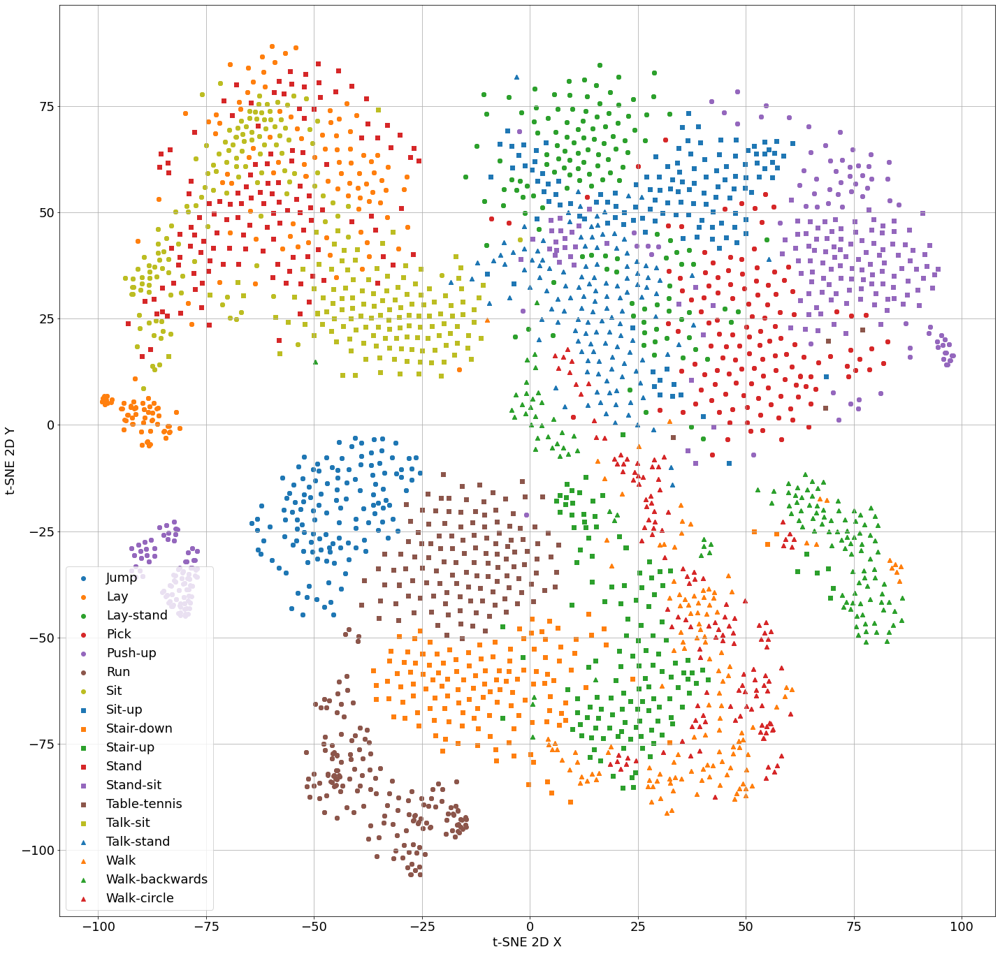

Experiment took 22.308 seconds

Starting experiment with 't-SNE' on 'Balanced Ku-HAR dataset (FFT)' with Standard Scaler. Model parameters: {'n_components': 2, 'perplexity': 60.0}
X.shape=(7236, 1800), y.shape=(7236,)
Model took 21.569 seconds
Figure saved to outputs/manifold/868d6394/balanced_kuhar_fft_full-tsne-perp60-std-scaler.png


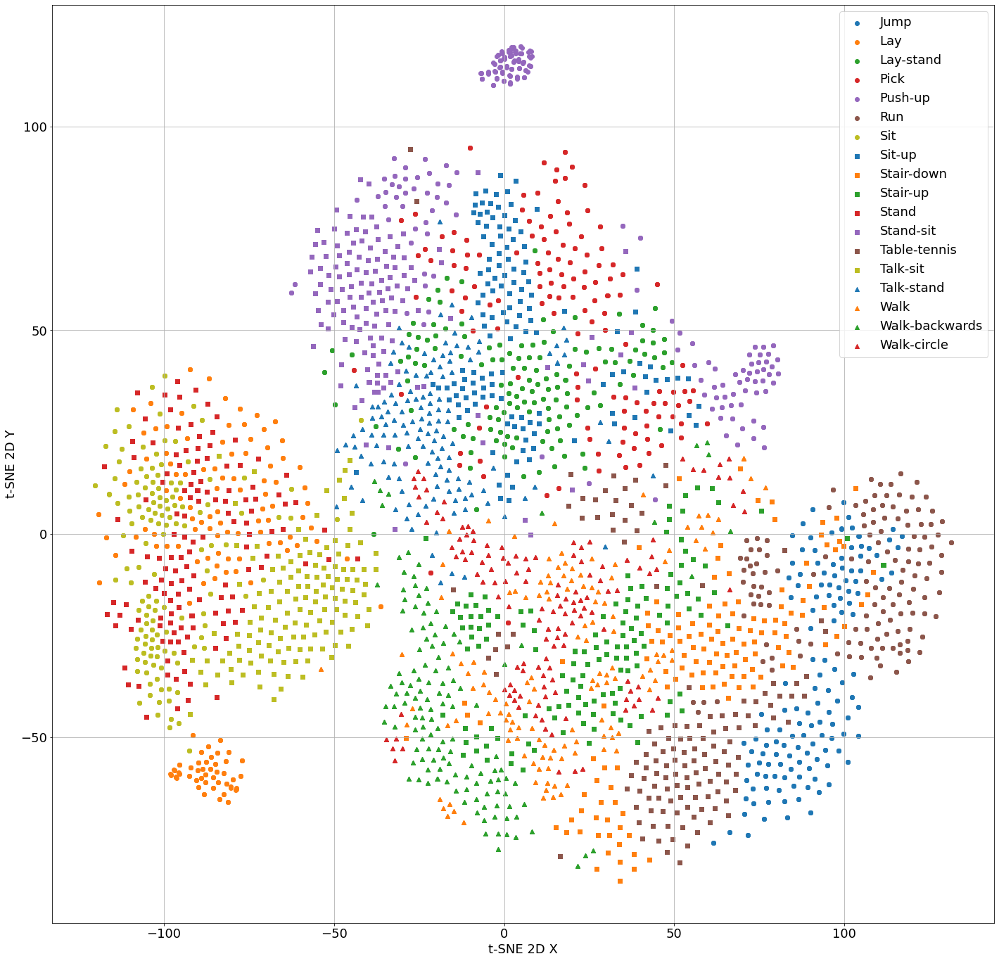

Experiment took 22.659 seconds

Starting experiment with 't-SNE' on 'Balanced Ku-HAR dataset (FFT)' with MinMax Scaler. Model parameters: {'n_components': 2, 'perplexity': 60.0}
X.shape=(7236, 1800), y.shape=(7236,)
Model took 23.209 seconds
Figure saved to outputs/manifold/868d6394/balanced_kuhar_fft_full-tsne-perp60-minmax-scaler.png


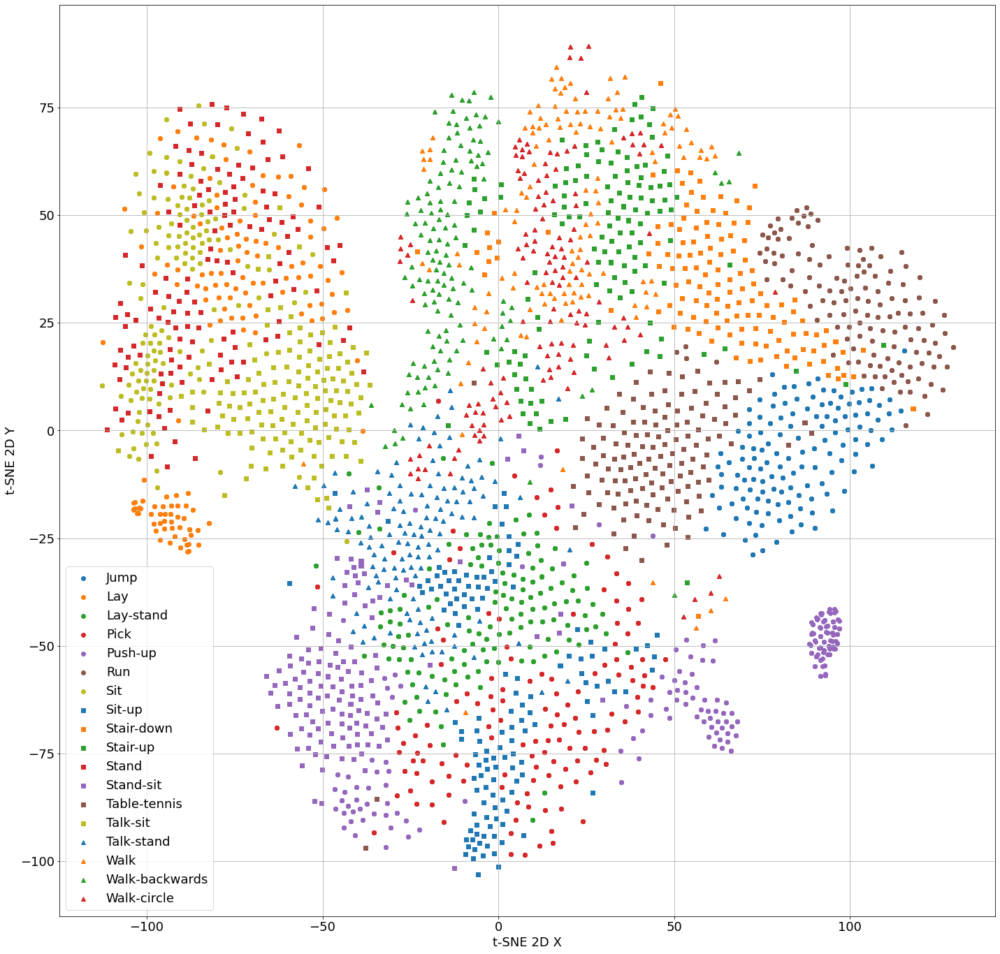

Experiment took 24.281 seconds

Starting experiment with 'UMAP' on 'Balanced Ku-HAR dataset (FFT per row)' with No Scaler. Model parameters: {'n_components': 2}
X.shape=(7236, 1800), y.shape=(7236,)
Model took 7.362 seconds
Figure saved to outputs/manifold/868d6394/balanced_kuhar_fft_sensor-umap-no-scaler.png


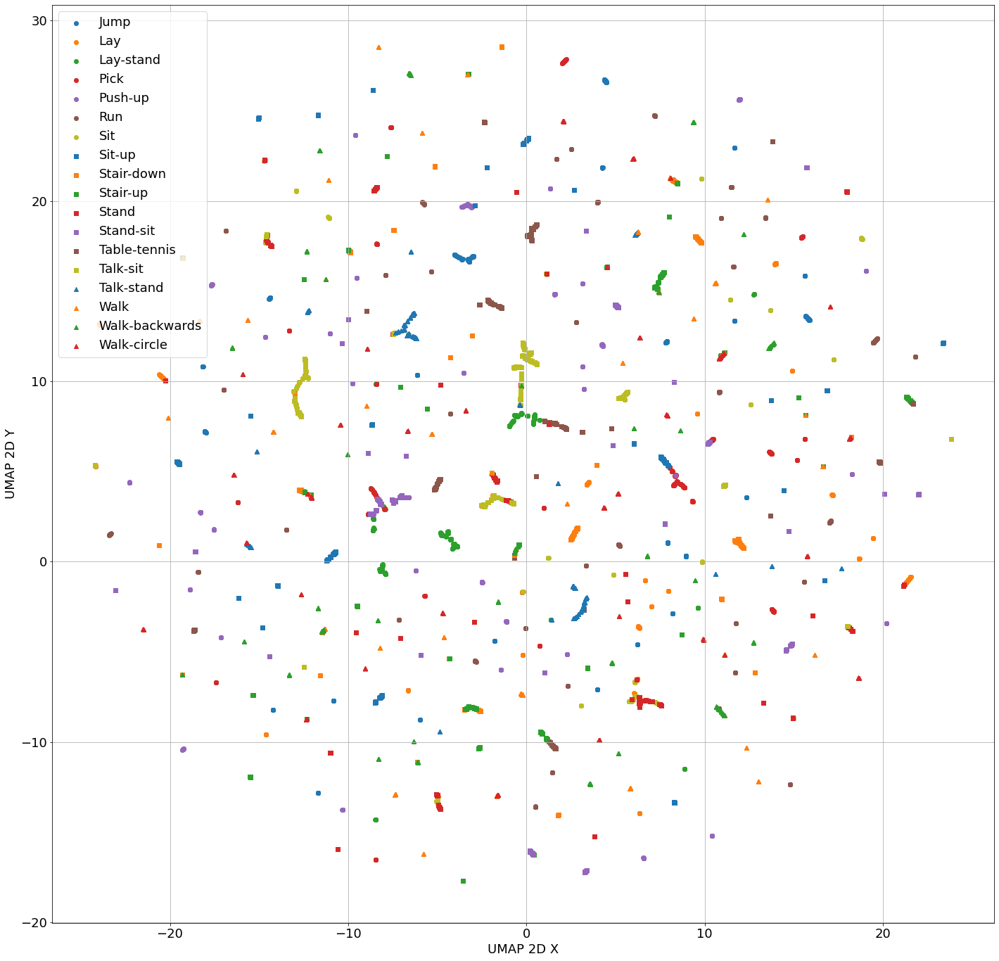

Experiment took 8.532 seconds

Starting experiment with 'UMAP' on 'Balanced Ku-HAR dataset (FFT per row)' with Standard Scaler. Model parameters: {'n_components': 2}
X.shape=(7236, 1800), y.shape=(7236,)
Model took 9.598 seconds
Figure saved to outputs/manifold/868d6394/balanced_kuhar_fft_sensor-umap-std-scaler.png


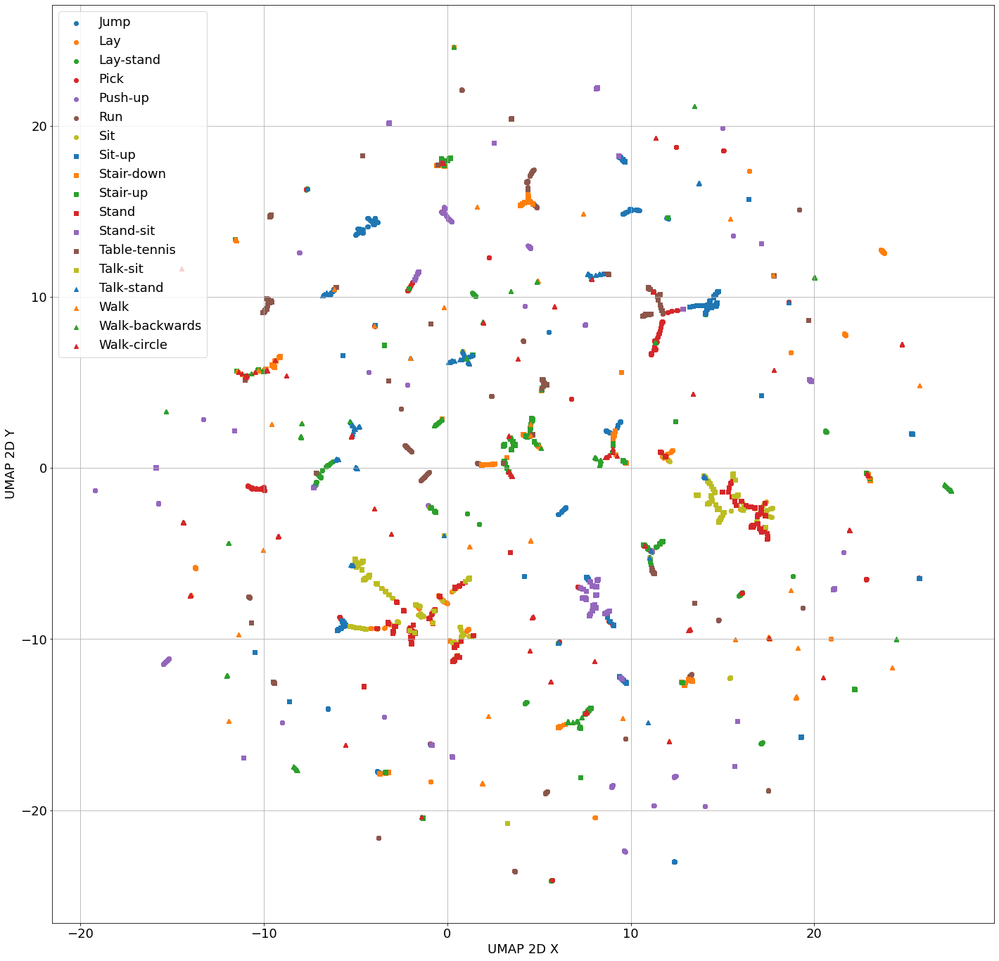

Experiment took 10.924 seconds

Starting experiment with 'UMAP' on 'Balanced Ku-HAR dataset (FFT per row)' with MinMax Scaler. Model parameters: {'n_components': 2}
X.shape=(7236, 1800), y.shape=(7236,)
Model took 7.521 seconds
Figure saved to outputs/manifold/868d6394/balanced_kuhar_fft_sensor-umap-minmax-scaler.png


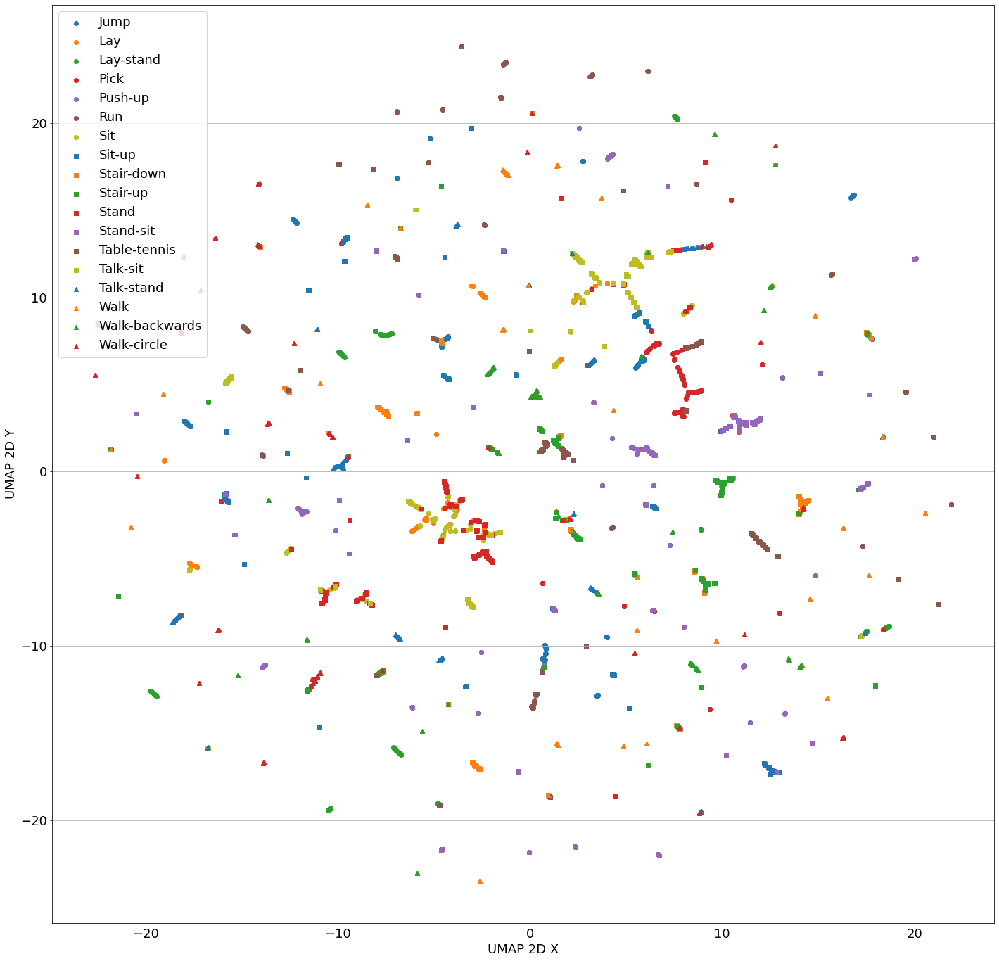

Experiment took 8.759 seconds

Starting experiment with 't-SNE' on 'Balanced Ku-HAR dataset (FFT per row)' with No Scaler. Model parameters: {'n_components': 2, 'perplexity': 30.0}
X.shape=(7236, 1800), y.shape=(7236,)
Model took 16.189 seconds
Figure saved to outputs/manifold/868d6394/balanced_kuhar_fft_sensor-tsne-perp30-no-scaler.png


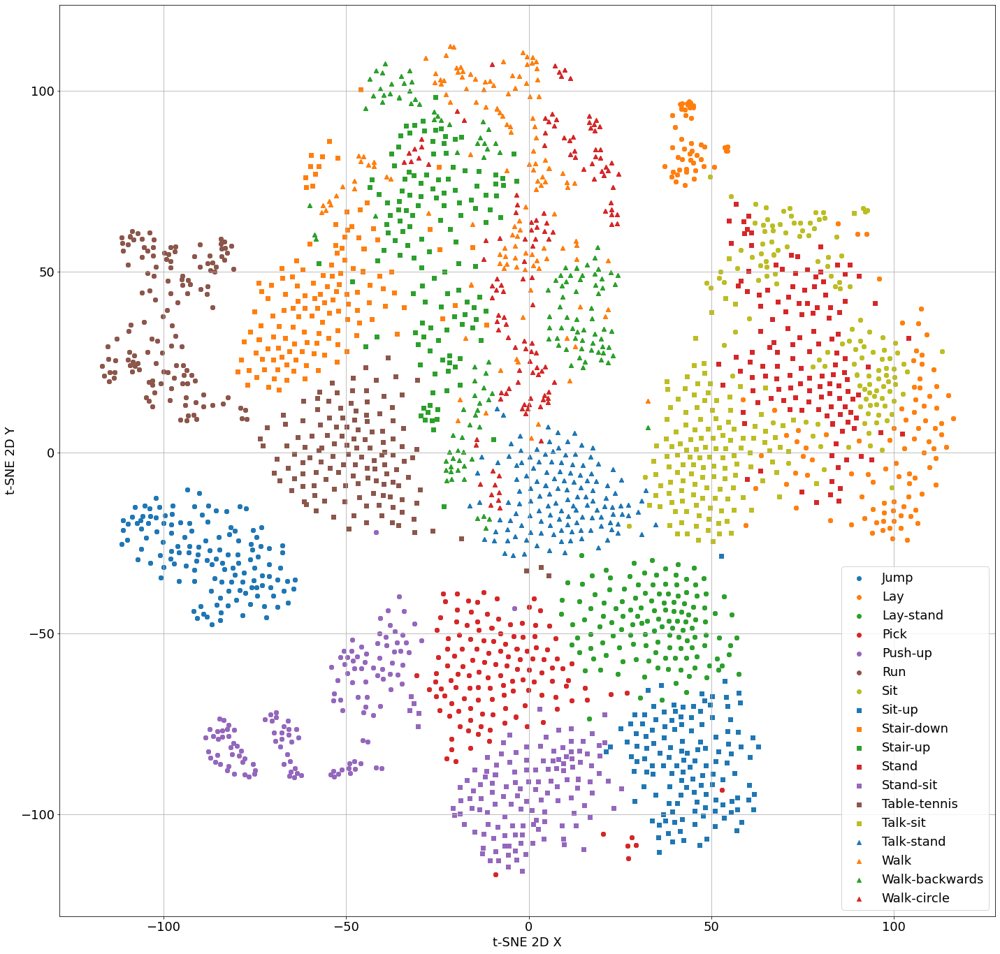

Experiment took 17.200 seconds

Starting experiment with 't-SNE' on 'Balanced Ku-HAR dataset (FFT per row)' with Standard Scaler. Model parameters: {'n_components': 2, 'perplexity': 30.0}
X.shape=(7236, 1800), y.shape=(7236,)
Model took 17.509 seconds
Figure saved to outputs/manifold/868d6394/balanced_kuhar_fft_sensor-tsne-perp30-std-scaler.png


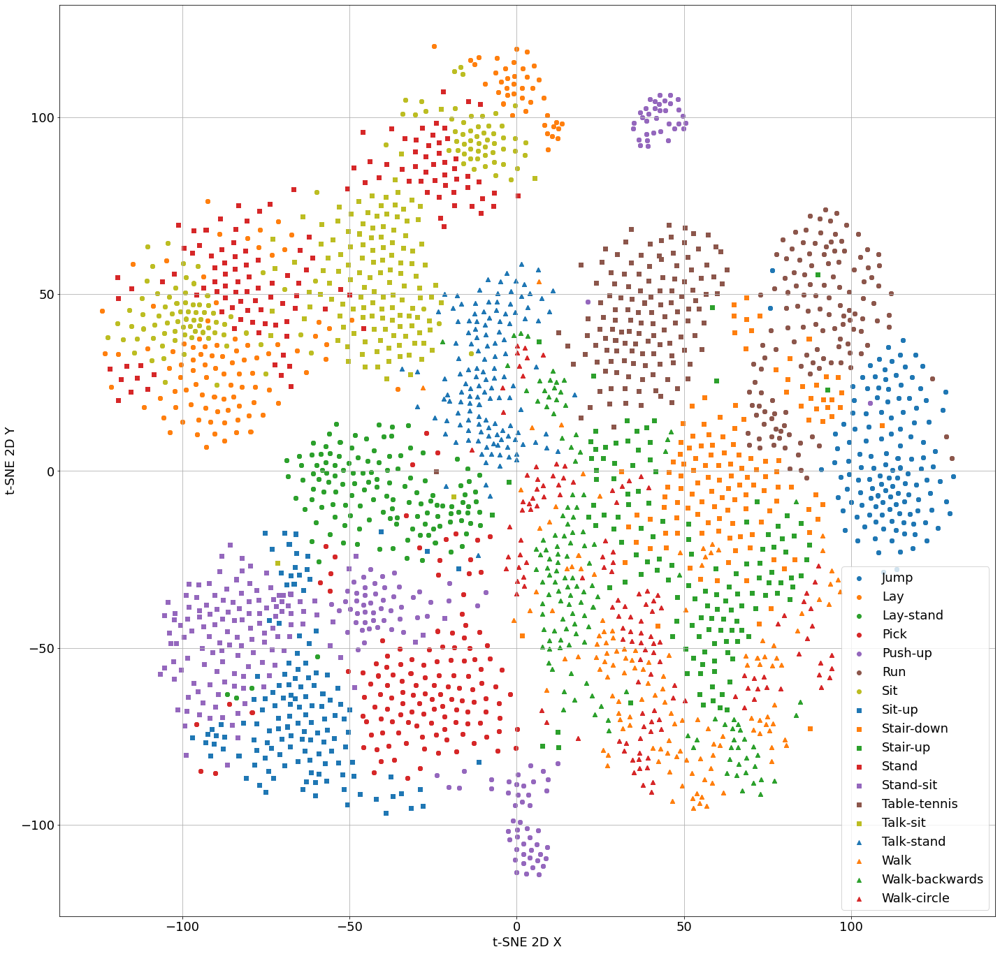

Experiment took 18.838 seconds

Starting experiment with 't-SNE' on 'Balanced Ku-HAR dataset (FFT per row)' with MinMax Scaler. Model parameters: {'n_components': 2, 'perplexity': 30.0}
X.shape=(7236, 1800), y.shape=(7236,)
Model took 16.374 seconds
Figure saved to outputs/manifold/868d6394/balanced_kuhar_fft_sensor-tsne-perp30-minmax-scaler.png


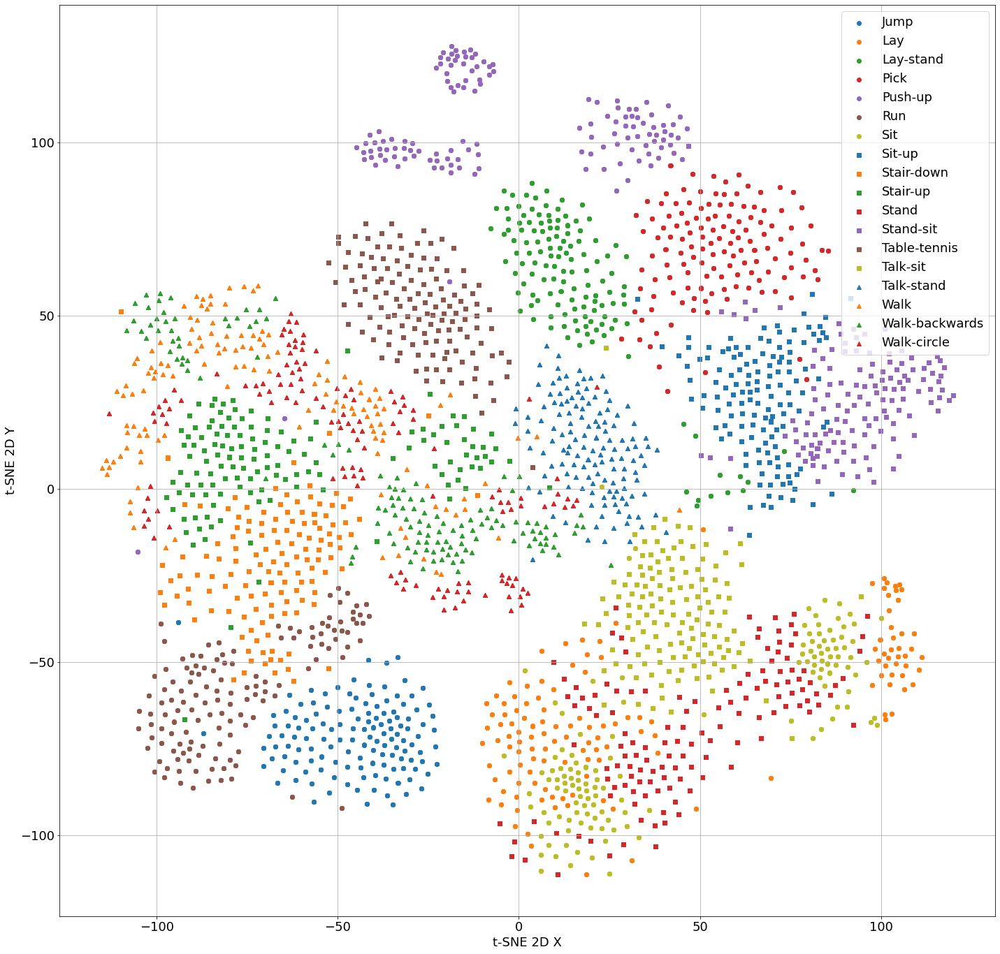

Experiment took 17.631 seconds

Starting experiment with 't-SNE' on 'Balanced Ku-HAR dataset (FFT per row)' with No Scaler. Model parameters: {'n_components': 2, 'perplexity': 60.0}
X.shape=(7236, 1800), y.shape=(7236,)
Model took 20.394 seconds
Figure saved to outputs/manifold/868d6394/balanced_kuhar_fft_sensor-tsne-perp60-no-scaler.png


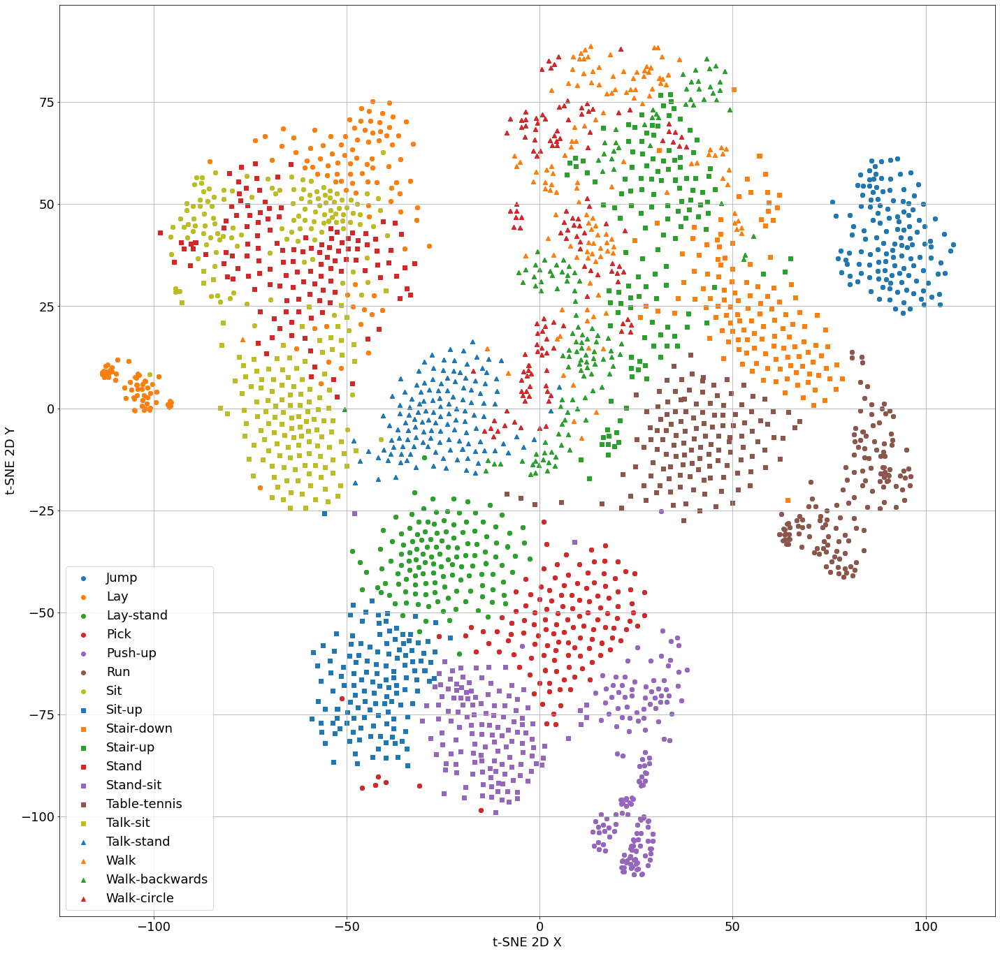

Experiment took 21.400 seconds

Starting experiment with 't-SNE' on 'Balanced Ku-HAR dataset (FFT per row)' with Standard Scaler. Model parameters: {'n_components': 2, 'perplexity': 60.0}
X.shape=(7236, 1800), y.shape=(7236,)
Model took 21.968 seconds
Figure saved to outputs/manifold/868d6394/balanced_kuhar_fft_sensor-tsne-perp60-std-scaler.png


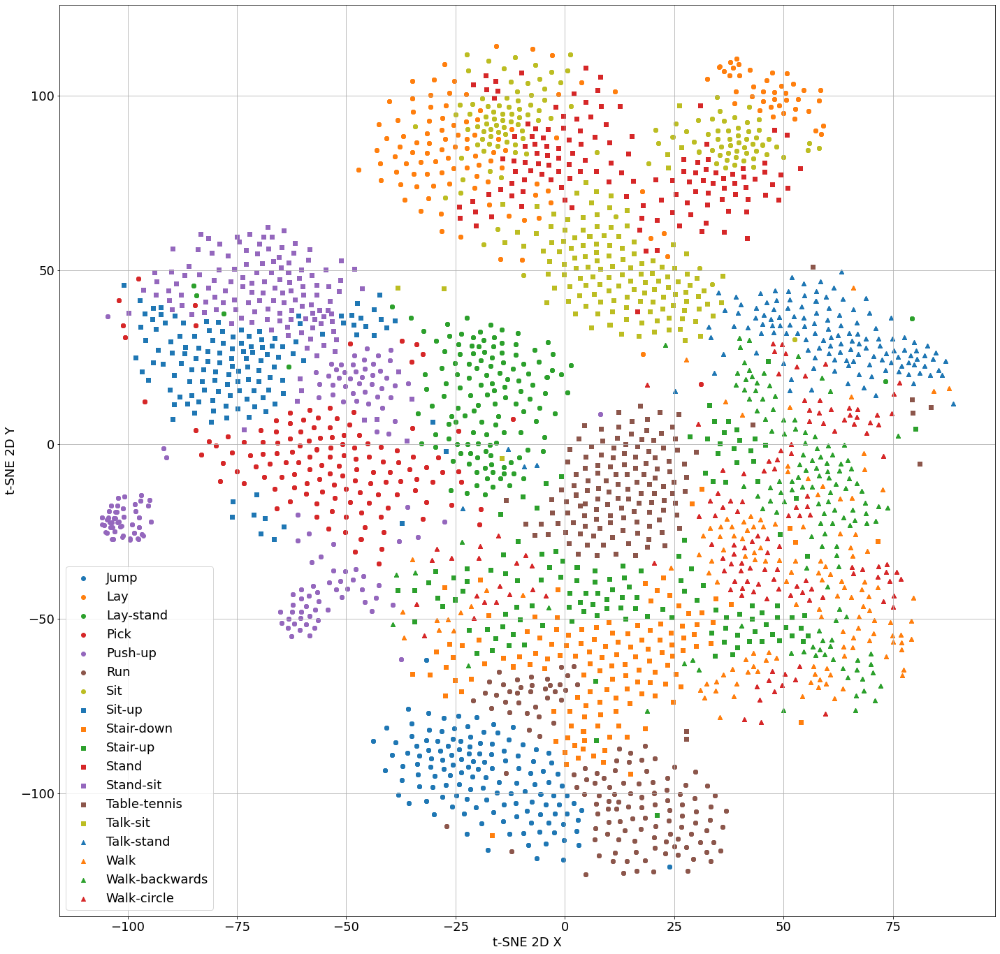

Experiment took 23.139 seconds

Starting experiment with 't-SNE' on 'Balanced Ku-HAR dataset (FFT per row)' with MinMax Scaler. Model parameters: {'n_components': 2, 'perplexity': 60.0}
X.shape=(7236, 1800), y.shape=(7236,)
Model took 20.275 seconds
Figure saved to outputs/manifold/868d6394/balanced_kuhar_fft_sensor-tsne-perp60-minmax-scaler.png


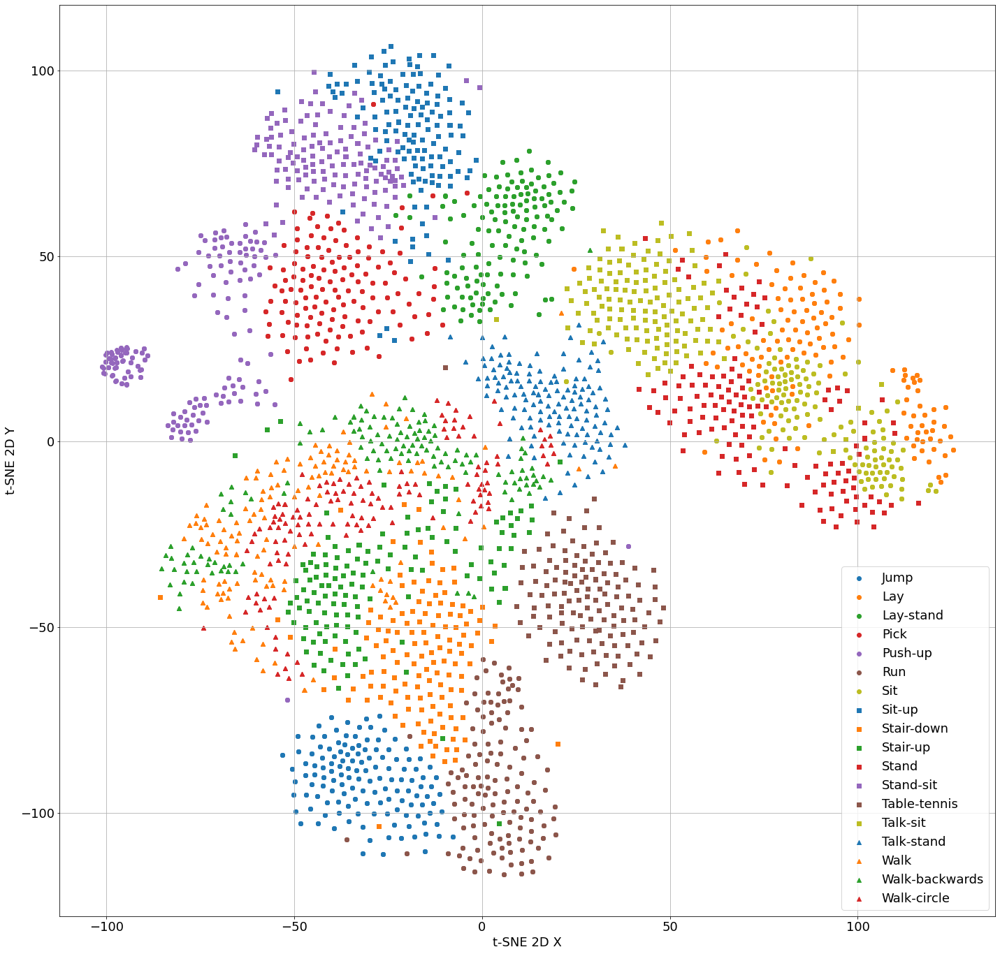

Experiment took 21.352 seconds



In [24]:
uid = str(uuid.uuid4())[:8]
output_dir = os.path.join("outputs", "manifold", uid)
os.makedirs(output_dir, exist_ok=True)
print(f"Default output path to '{output_dir}'...")

for dataset_id, dataset_desc, dataset in datasets:
    for model_id, model_name, model_params in models:
        for scaler_id, scaler_desc, scaler_cls in scalers:
            start = time.time()
            print(f"Starting experiment with '{model_name}' on '{dataset_desc}' with {scaler_desc}. Model parameters: {model_params}")
            # Fit Transform            
            scaler = scaler_cls() if scaler_cls is not None else None
            model = get_model(model_name, **model_params)
            X = dataset[features_cols].to_numpy(copy=True)
            y = dataset[target_col].to_numpy(copy=True)
            X = perform_fit_transform(model=model, X=X, y=y, scaler=scaler)
            
            # Plot
            #title = f"{model_name} on {dataset_desc} ({scaler_desc})"
            xlabel = f"{model_name} 2D X"
            ylabel = f"{model_name} 2D Y"
            output_file = os.path.join(output_dir, f"{dataset_id}-{model_id}-{scaler_id}.png")
            plot_graph(X=X, xlabel=xlabel, ylabel=ylabel, title=None, mark_color=mark_color, open_markers=False, output_file=output_file)
            print(f"Experiment took {time.time()-start:.3f} seconds\n")
            
            # Call GC
            gc.collect()

Default output path to 'outputs/manifold/b574e84b'...
Starting experiment with 'pca' on 'Ku-HAR dataset' with No Scaler. Model parameters: {'n_components': 2}
X.shape=(20750, 1800), y.shape=(20750,)
Model took 1.936 seconds
Figure saved to outputs/manifold/b574e84b/kuhar-PCA-no-scaler.png


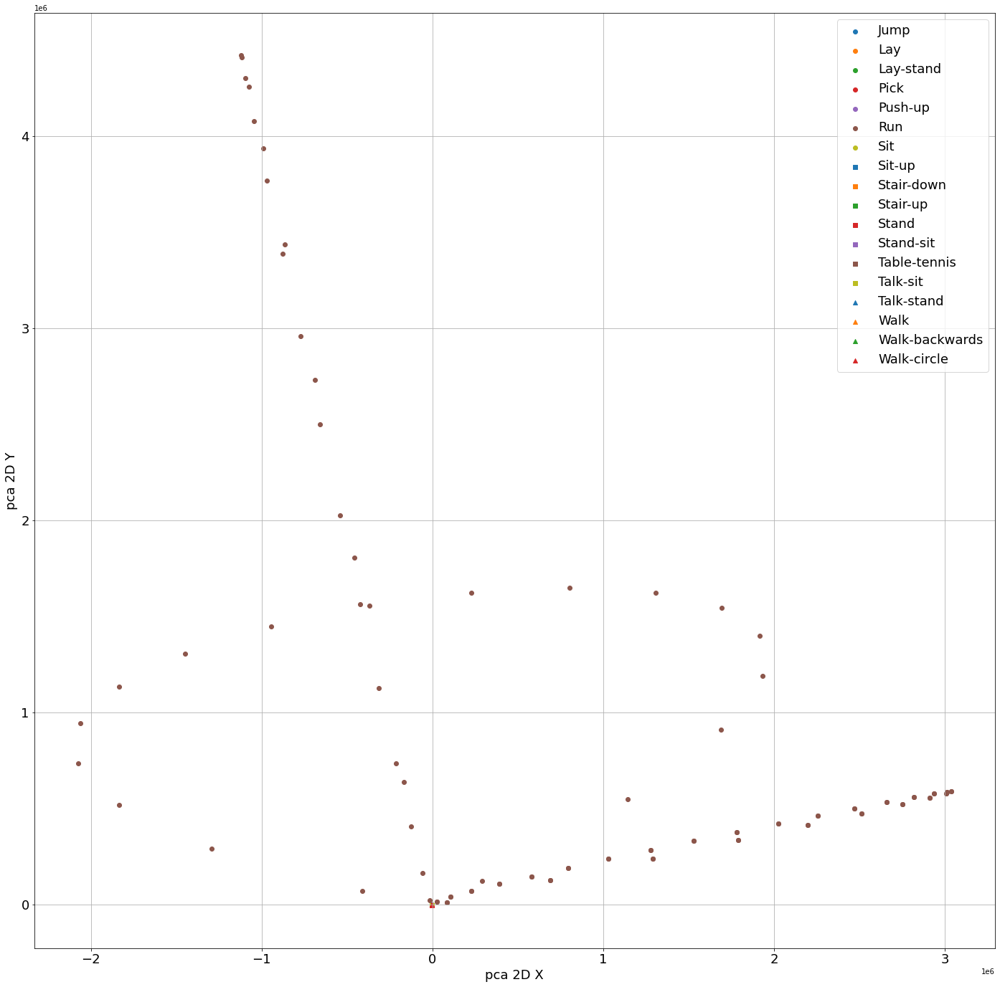

Experiment took 3.047 seconds

Starting experiment with 'pca' on 'Ku-HAR dataset' with Standard Scaler. Model parameters: {'n_components': 2}
X.shape=(20750, 1800), y.shape=(20750,)
Model took 2.168 seconds
Figure saved to outputs/manifold/b574e84b/kuhar-PCA-std-scaler.png


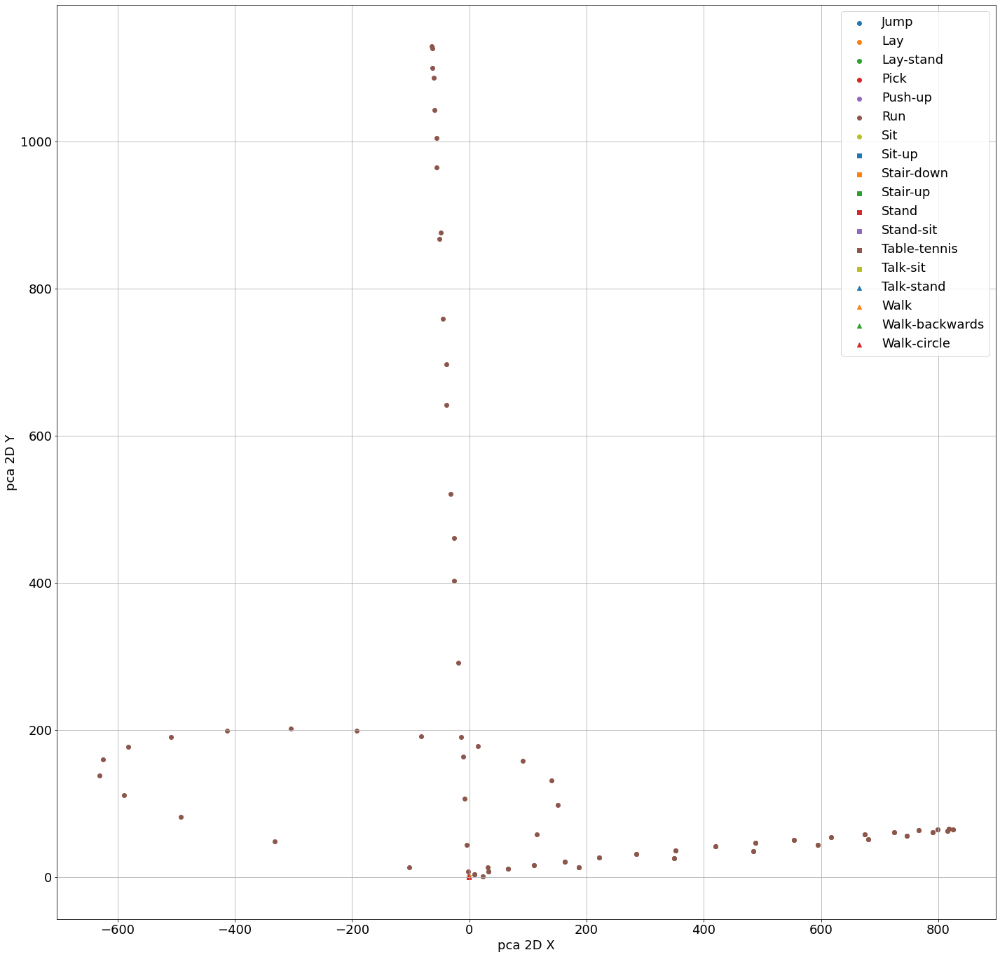

Experiment took 3.813 seconds

Starting experiment with 'pca' on 'Ku-HAR dataset' with MinMax Scaler. Model parameters: {'n_components': 2}
X.shape=(20750, 1800), y.shape=(20750,)
Model took 2.121 seconds
Figure saved to outputs/manifold/b574e84b/kuhar-PCA-minmax-scaler.png


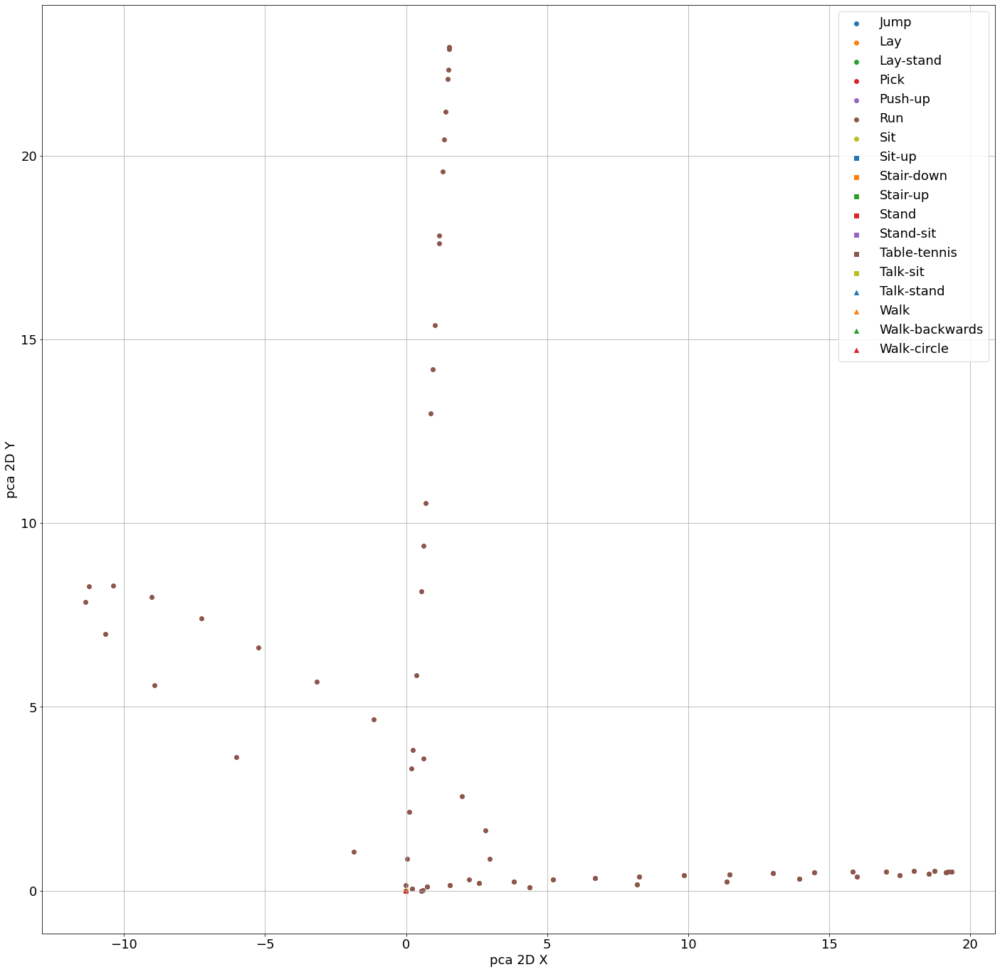

Experiment took 3.452 seconds

Starting experiment with 'isomap' on 'Ku-HAR dataset' with No Scaler. Model parameters: {'n_components': 2}
X.shape=(20750, 1800), y.shape=(20750,)
Model took 301.011 seconds
Figure saved to outputs/manifold/b574e84b/kuhar-ISOMAP-no-scaler.png


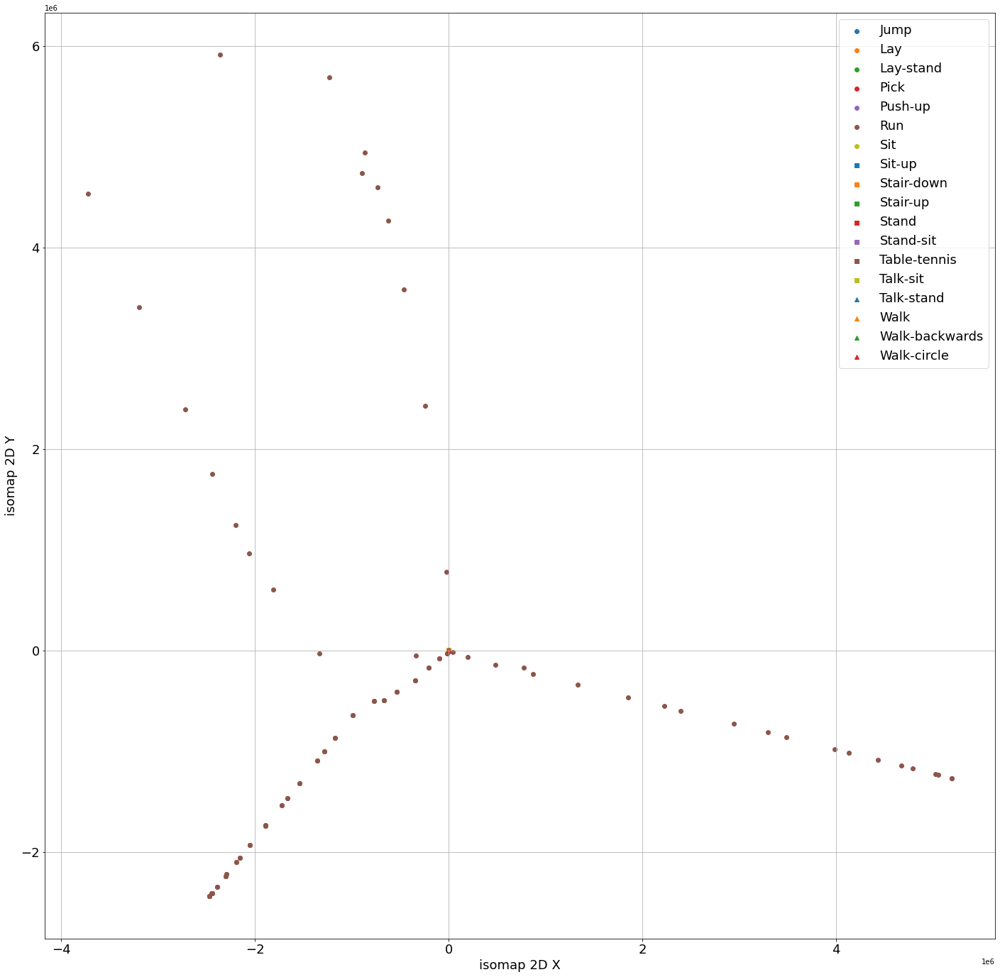

Experiment took 302.344 seconds

Starting experiment with 'isomap' on 'Ku-HAR dataset' with Standard Scaler. Model parameters: {'n_components': 2}
X.shape=(20750, 1800), y.shape=(20750,)
Model took 279.101 seconds
Figure saved to outputs/manifold/b574e84b/kuhar-ISOMAP-std-scaler.png


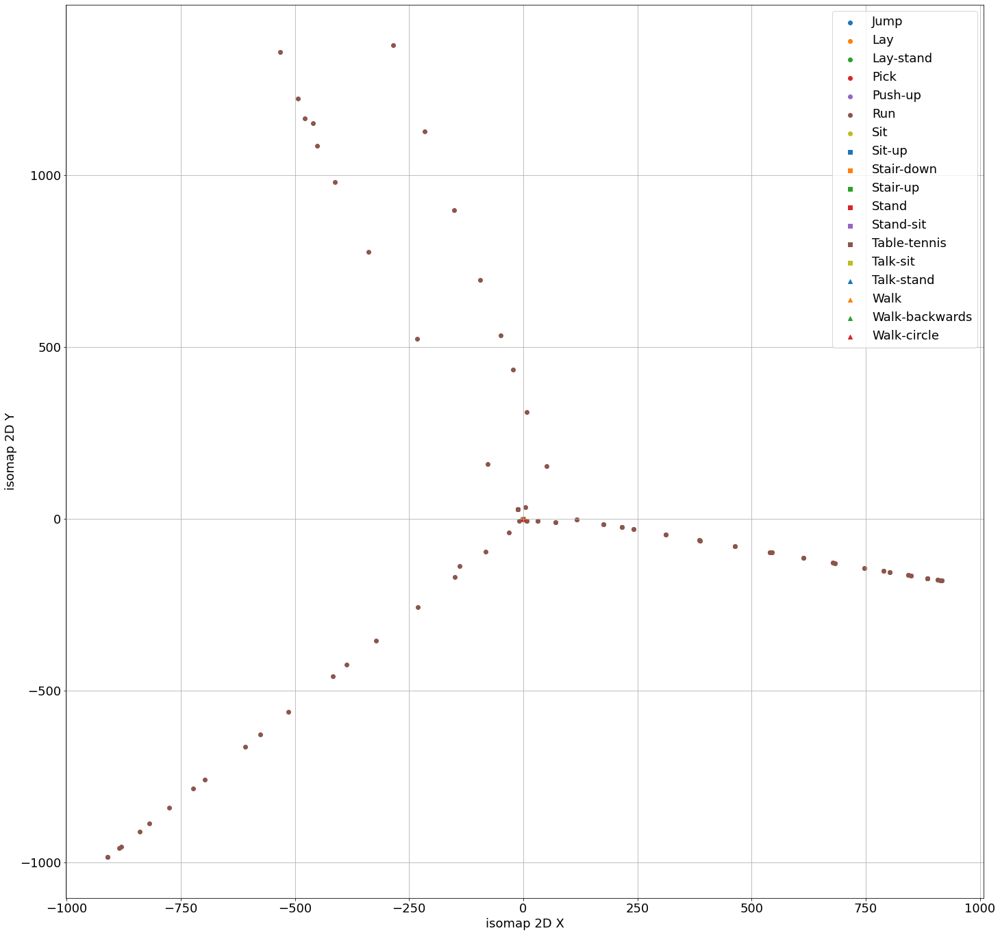

Experiment took 281.525 seconds

Starting experiment with 'isomap' on 'Ku-HAR dataset' with MinMax Scaler. Model parameters: {'n_components': 2}
X.shape=(20750, 1800), y.shape=(20750,)
Model took 289.859 seconds
Figure saved to outputs/manifold/b574e84b/kuhar-ISOMAP-minmax-scaler.png


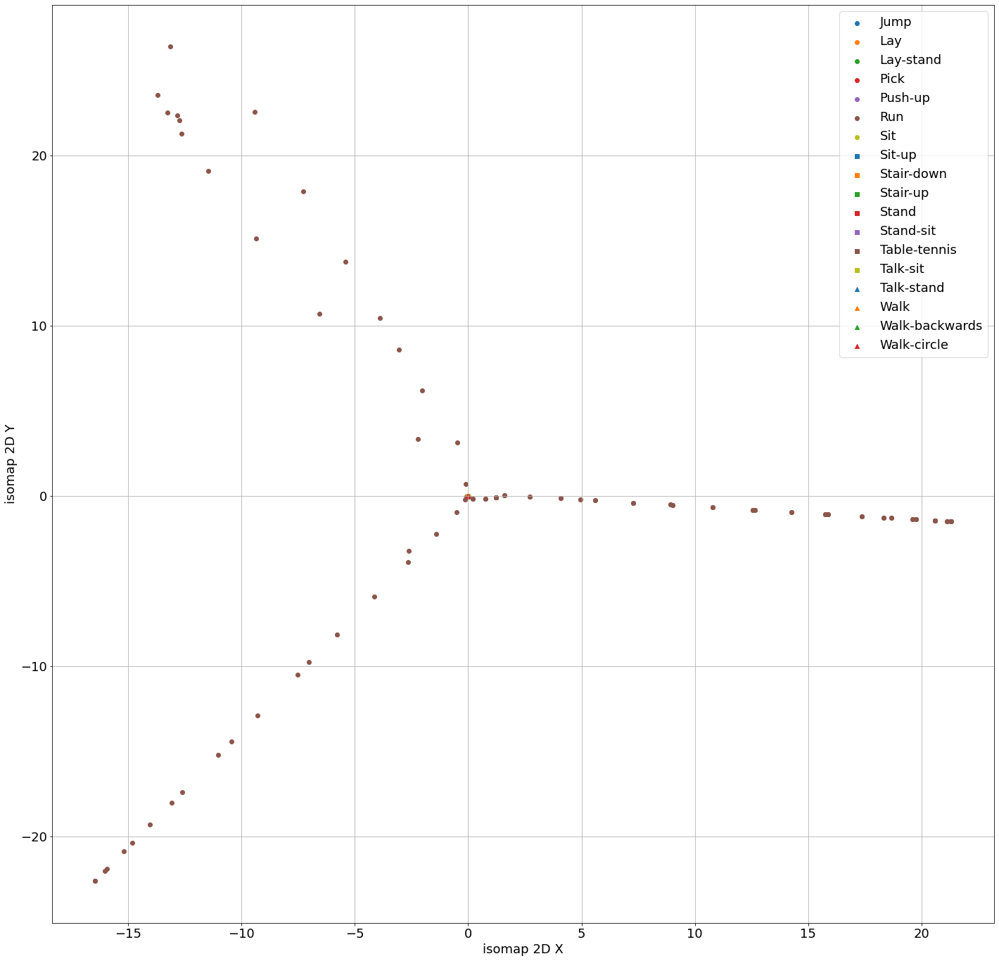

Experiment took 291.784 seconds

Starting experiment with 'se' on 'Ku-HAR dataset' with No Scaler. Model parameters: {'n_components': 2}
X.shape=(20750, 1800), y.shape=(20750,)


MemoryError: 

In [26]:
colors = ["tab:blue", "tab:orange", "tab:green", "tab:red", "tab:purple", "tab:brown", "tab:olive"]
markers = ["o", "s", "^"]
mark_color = list(itertools.product(markers, colors))

features_cols = sensor_features
target_col = "class name"

datasets = [
    ("kuhar", "Ku-HAR dataset", original_df),
    ("kuhar_fft_full", "Ku-HAR dataset (FFT)", full_fft_original_df),
    ("kuhar_fft_sensor", "Ku-HAR dataset (FFT per row)", per_sensor_fft_original_df),
    ("balanced_kuhar", "Balanced Ku-HAR dataset", balanced_df),
    ("balanced_kuhar_fft_full", "Balanced Ku-HAR dataset (FFT)", full_fft_balanced_df),
    ("balanced_kuhar_fft_sensor", "Balanced Ku-HAR dataset (FFT per row)", per_sensor_fft_balanced_df),    
]

models = [
    ("PCA", "pca", {"n_components": 2}),
    ("ISOMAP", "isomap", {"n_components": 2}),
    ("Spectral Embedding", "se", {"n_components": 2}),
]

scalers = [
    ("no-scaler", "No Scaler", None),
    ("std-scaler", "Standard Scaler", StandardScaler),
    ("minmax-scaler", "MinMax Scaler", MinMaxScaler)
]

uid = str(uuid.uuid4())[:8]
output_dir = os.path.join("outputs", "manifold", uid)
os.makedirs(output_dir, exist_ok=True)
print(f"Default output path to '{output_dir}'...")

for dataset_id, dataset_desc, dataset in datasets:
    for model_id, model_name, model_params in models:
        for scaler_id, scaler_desc, scaler_cls in scalers:
            start = time.time()
            print(f"Starting experiment with '{model_name}' on '{dataset_desc}' with {scaler_desc}. Model parameters: {model_params}")
            # Fit Transform            
            scaler = scaler_cls() if scaler_cls is not None else None
            model = get_model(model_name, **model_params)
            X = dataset[features_cols].to_numpy(copy=True)
            y = dataset[target_col].to_numpy(copy=True)
            X = perform_fit_transform(model=model, X=X, y=y, scaler=scaler)
            
            # Plot
            #title = f"{model_name} on {dataset_desc} ({scaler_desc})"
            xlabel = f"{model_name} 2D X"
            ylabel = f"{model_name} 2D Y"
            output_file = os.path.join(output_dir, f"{dataset_id}-{model_id}-{scaler_id}.png")
            plot_graph(X=X, xlabel=xlabel, ylabel=ylabel, title=None, mark_color=mark_color, open_markers=False, output_file=output_file)
            print(f"Experiment took {time.time()-start:.3f} seconds\n")
            
            # Call GC
            gc.collect()